# Implementação das funções do CEC

In [1]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
MASTER_SEED = 2003  # semente fixa; cada célula de experimento chama set_seed antes de rodar


def set_seed(seed):
    """Fixa os RNGs de numpy e torch (CPU e CUDA) para reprodutibilidade."""
    np.random.seed(seed)
    torch.manual_seed(seed)
    if DEVICE == 'cuda':
        torch.cuda.manual_seed_all(seed)


set_seed(MASTER_SEED)


# Funções-base do CEC-2014, vetorizadas: entrada x com shape (runs, NP, D),
# saída com shape (runs, NP). Recebem já o vetor transformado z.
def f2_bent_cigar(x):
    term1 = x[..., 0]**2
    term2 = 1e6 * torch.sum(x[..., 1:]**2, dim=-1)
    return term1 + term2

def f4_rosenbrock(x):
    term1 = 100 * (x[..., :-1]**2 - x[..., 1:])**2
    term2 = (x[..., :-1] - 1)**2
    return torch.sum(term1 + term2, dim=-1)

def f6_weierstrass(x, a=0.5, b=3, kmax=20):
    D = x.shape[-1]
    k_arr = torch.arange(kmax + 1, dtype=x.dtype, device=x.device)
    ak = a ** k_arr
    bk = b ** k_arr

    x_exp = x.unsqueeze(-1)
    term1_inner = ak * torch.cos(2 * torch.pi * bk * (x_exp + 0.5))
    term1 = torch.sum(term1_inner, dim=(-1, -2))

    term2_inner = ak * torch.cos(2 * torch.pi * bk * 0.5)
    term2 = D * torch.sum(term2_inner)
    return term1 - term2

def f7_griewank(x):
    D = x.shape[-1]
    i_arr = torch.arange(1, D + 1, dtype=x.dtype, device=x.device)
    term1 = torch.sum(x**2, dim=-1) / 4000
    term2 = torch.prod(torch.cos(x / torch.sqrt(i_arr)), dim=-1)
    return term1 - term2 + 1

def f8_rastrigin(x):
    return torch.sum(x**2 - 10 * torch.cos(2 * torch.pi * x) + 10, dim=-1)

def f11_happycat(x):
    D = x.shape[-1]
    sum_sq = torch.sum(x**2, dim=-1)
    sum_x = torch.sum(x, dim=-1)
    return torch.abs(sum_sq - D)**0.25 + (0.5 * sum_sq + sum_x) / D + 0.5


class CEC2014Function:
    """Aplica shift + escala + rotação (arquivos oficiais em cec14-c-code/input_data)
    e devolve f(x) + F*. Cobre F2, F4, F6, F7, F9 e F13 do CEC-2014."""

    def __init__(self, func_id, D, data_dir=r'cec14-c-code\input_data'):
        self.func_id = func_id
        self.D = D
        self.f_star_map = {2: 200, 4: 400, 6: 600, 7: 700, 9: 900, 13: 1300}
        self.F_star = self.f_star_map[func_id]

        shift_file = os.path.join(data_dir, f'shift_data_{func_id}.txt')
        if not os.path.isfile(shift_file):
            raise FileNotFoundError(f'Dados CEC não encontrados: {shift_file}')
        shift_data = np.asarray(np.loadtxt(shift_file)).reshape(-1)
        if shift_data.size < D:
            raise ValueError(f'Arquivo de shift da F{func_id} possui {shift_data.size} valores; esperado pelo menos {D}.')
        self.o_i = torch.tensor(shift_data[:D], dtype=torch.float64, device=DEVICE)

        rot_file = os.path.join(data_dir, f'M_{func_id}_D{D}.txt')
        if not os.path.isfile(rot_file):
            raise FileNotFoundError(f'Matriz de rotação não encontrada: {rot_file}')
        rot_data = np.asarray(np.loadtxt(rot_file))
        if rot_data.shape != (D, D):
            raise ValueError(f'Matriz de rotação inválida para F{func_id}, D={D}: shape={rot_data.shape}; esperado {(D, D)}.')
        self.M_i = torch.tensor(rot_data, dtype=torch.float64, device=DEVICE)

    def evaluate(self, x):
        if x.shape[-1] != self.D:
            raise ValueError(f'Entrada com dimensão {x.shape[-1]}; esperado D={self.D}.')

        # Nenhuma das 6 funções escolhidas usa shuffle na definição do CEC-2014,
        # então basta o shift; a escala (5.12/100 etc.) leva ao domínio nativo de cada função.
        z_trans = x - self.o_i

        if self.func_id == 2:
            z = z_trans @ self.M_i.T
            return f2_bent_cigar(z) + self.F_star
        elif self.func_id == 4:
            z = ((2.048 * z_trans) / 100) @ self.M_i.T + 1  # +1: ótimo do Rosenbrock em (1,...,1)
            return f4_rosenbrock(z) + self.F_star
        elif self.func_id == 6:
            z = ((0.5 * z_trans) / 100) @ self.M_i.T
            return f6_weierstrass(z) + self.F_star
        elif self.func_id == 7:
            z = ((600 * z_trans) / 100) @ self.M_i.T
            return f7_griewank(z) + self.F_star
        elif self.func_id == 9:
            z = ((5.12 * z_trans) / 100) @ self.M_i.T
            return f8_rastrigin(z) + self.F_star
        elif self.func_id == 13:
            z = ((5 * z_trans) / 100) @ self.M_i.T
            z = z - 1.0  # -1: ótimo do HappyCat em (-1,...,-1)
            return f11_happycat(z) + self.F_star


# Infraestrutura: persistência de resultados

Cada célula de experimento grava, por função e dimensão, um arquivo `resultados/<algo>_D<D>_F<fid>.npz` com erro final das 30 execuções, FES-para-alvo (1e-8), flag de sucesso e curvas de convergência/adoção. A análise estatística comparativa é a última célula do notebook.

In [2]:
import os
import numpy as np

# Semente-mestra única: cada célula de experimento chama set_seed(MASTER_SEED) antes de
# rodar, o que torna a tabela reprodutível sem tornar a inicialização determinística
# (as 30 execuções continuam partindo de populações aleatórias e distintas entre si).

RESULTS_DIR = "resultados"  # relativo ao diretório do notebook
os.makedirs(RESULTS_DIR, exist_ok=True)
os.makedirs(os.path.join(RESULTS_DIR, "figuras"), exist_ok=True)

TARGET_ERR = 1e-8  # erro abaixo do qual o enunciado considera a função resolvida


def _save_run(algo, D, func_id, results, histories, fes_axis, adoption=None, diversity=None, wall_time=None):
    """Persiste em resultados/<algo>_D<D>_F<func_id>.npz os dados de uma execução.

    results   : (runs,)      erro final de cada execução
    histories : (runs, T)    melhor erro por iteração
    fes_axis  : (T,)         FES acumulado em cada ponto de histories
    adoption  : (runs, T) ou (T,), opcional  -  % de adoção de estratégia
    """
    res = np.asarray(results, dtype=float).ravel()
    h = np.asarray(histories, dtype=float)
    if h.ndim == 1:
        h = h[None, :]
    fx = np.asarray(fes_axis, dtype=float).ravel()
    if fx.shape[0] != h.shape[1]:
        lo = float(fx.min()) if fx.size else 0.0
        hi = float(fx.max()) if fx.size else float(h.shape[1])
        fx = np.linspace(lo, hi, h.shape[1])

    # FES em que cada execução cruzou o alvo pela primeira vez (inf se nunca cruzou)
    reached = h <= TARGET_ERR
    ftt = np.full(h.shape[0], np.inf)
    ok = reached.any(axis=1)
    if ok.any():
        ftt[ok] = fx[reached.argmax(axis=1)[ok]]

    payload = dict(
        algo=str(algo), D=int(D), func_id=int(func_id),
        final_error=res,
        fes_to_target=ftt,
        success=np.isfinite(ftt),
        curve_fes=fx,
        curve_mean=np.nanmean(h, axis=0),
        curve_median=np.nanmedian(h, axis=0),
        curve_q25=np.nanpercentile(h, 25, axis=0),
        curve_q75=np.nanpercentile(h, 75, axis=0),
    )
    if adoption is not None:
        a = np.asarray(adoption, dtype=float)
        # (runs, T) -> (T,) ;  (runs, T, K) -> (T, K)  [colunas: % PSO, % DE, % Levy]
        payload["adoption"] = a.mean(axis=0) if a.ndim in (2, 3) else a.ravel()
    if diversity is not None:
        d = np.asarray(diversity, dtype=float)
        payload["curve_div"] = d.mean(axis=0) if d.ndim == 2 else d.ravel()
    if wall_time is not None:
        payload["wall_time"] = float(wall_time)   # segundos das 30 execucoes em lote

    path = os.path.join(RESULTS_DIR, f"{algo}_D{int(D)}_F{int(func_id)}.npz")
    np.savez(path, **payload)
    return path


print("Infraestrutura de resultados pronta ->", RESULTS_DIR)


Infraestrutura de resultados pronta -> resultados


# Implementação do DE

Acelerador Lógico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: DE SÍNCRONO VETORIZADO - DIMENSÃO D = 30
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 8.87e+08 | 2.32e+09 | 1.68e+09 | 1.75e+09 | 3.10e+08
F4       | 2.66e+02 | 4.20e+02 | 3.46e+02 | 3.48e+02 | 4.36e+01
F6       | 1.84e+01 | 3.59e+01 | 2.56e+01 | 2.53e+01 | 4.45e+00
F7       | 1.10e+01 | 2.01e+01 | 1.52e+01 | 1.51e+01 | 2.21e+00
F9       | 2.43e+02 | 2.83e+02 | 2.69e+02 | 2.70e+02 | 1.05e+01
F13      | 6.70e-01 | 9.21e-01 | 8.09e-01 | 8.08e-01 | 6.55e-02


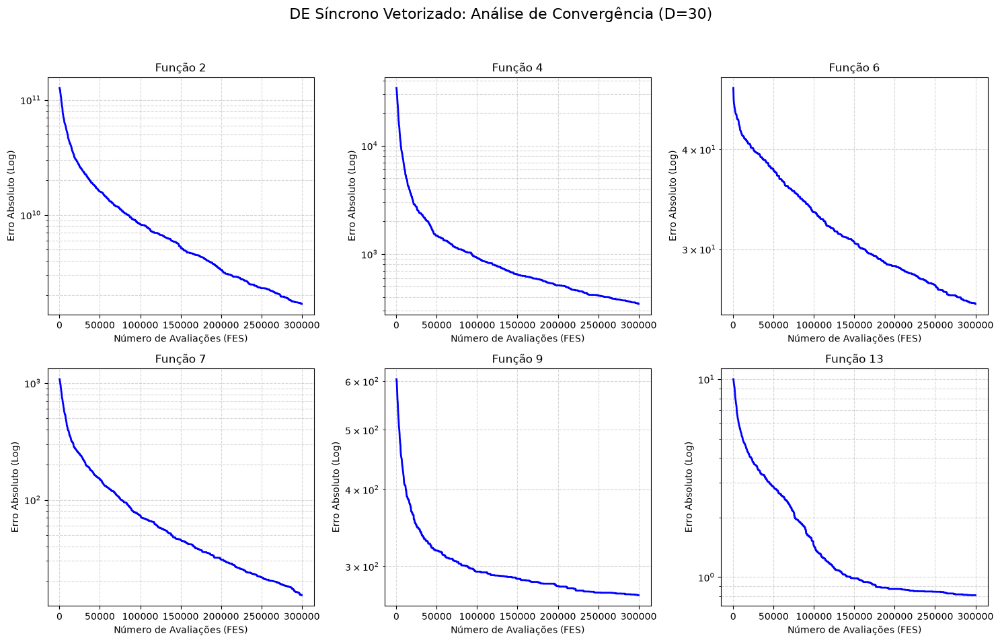


 RESULTADOS: DE SÍNCRONO VETORIZADO - DIMENSÃO D = 50
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 2.13e+10 | 3.44e+10 | 2.80e+10 | 2.80e+10 | 3.22e+09
F4       | 1.90e+03 | 3.49e+03 | 2.69e+03 | 2.78e+03 | 4.30e+02
F6       | 4.78e+01 | 6.77e+01 | 5.49e+01 | 5.43e+01 | 4.57e+00
F7       | 2.35e+02 | 3.31e+02 | 2.89e+02 | 2.90e+02 | 2.78e+01
F9       | 5.22e+02 | 6.21e+02 | 5.75e+02 | 5.75e+02 | 2.04e+01
F13      | 2.91e+00 | 3.53e+00 | 3.14e+00 | 3.14e+00 | 1.78e-01


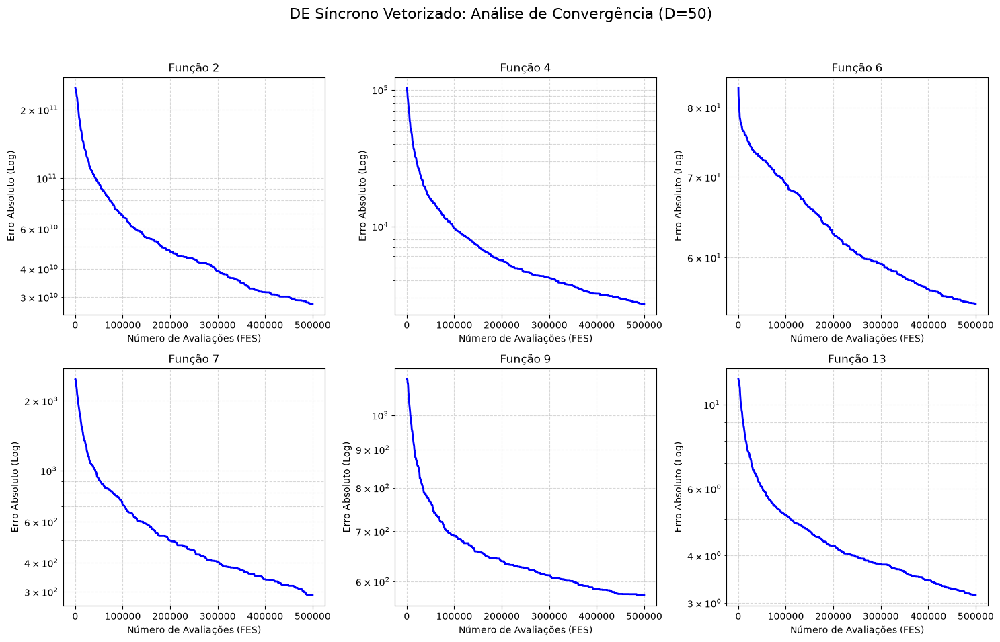

In [38]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time


# Differential Evolution (DE/rand/1/bin) clássico, executado em lote:
# um tensor (runs, NP, D) processa as 30 rodadas independentes de uma vez.
def differential_evolution_batch(cec_func, D, F=0.8, CR=0.9, NP=100, runs=30):
    max_FES = 10000 * D
    bounds = (-100, 100)

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=DEVICE).uniform_(bounds[0], bounds[1])

    fitness = cec_func.evaluate(pos)
    errors = fitness - cec_func.F_star
    errors = torch.where(errors < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), errors)

    best_errors, _ = torch.min(errors, dim=1)
    history = [best_errors.cpu().numpy()]
    FES = NP

    batch_idx = torch.arange(runs, device=DEVICE).view(runs, 1)
    np_idx = torch.arange(NP, device=DEVICE).view(1, NP)

    while FES < max_FES and not torch.all(best_errors <= 1e-8):
        # Mutação DE/rand/1: 3 doadores distintos por indivíduo.
        # rand na diagonal = inf impede sortear o próprio índice.
        rand_matrix = torch.rand((runs, NP, NP), device=DEVICE)
        rand_matrix.diagonal(dim1=1, dim2=2).fill_(float('inf'))
        r_indices = torch.topk(rand_matrix, 3, dim=2, largest=False).indices
        r1, r2, r3 = r_indices[..., 0], r_indices[..., 1], r_indices[..., 2]

        a = pos[batch_idx, r1, :]
        b = pos[batch_idx, r2, :]
        c = pos[batch_idx, r3, :]
        mutant = torch.clamp(a + F * (b - c), bounds[0], bounds[1])

        # Crossover binomial, com pelo menos uma dimensão vinda do mutante.
        cross_points = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE) < CR
        force_cross = torch.randint(0, D, (runs, NP), device=DEVICE)
        cross_points[batch_idx, np_idx, force_cross] = True
        trials = torch.where(cross_points, mutant, pos)

        trial_fitness = cec_func.evaluate(trials)
        trial_errors = trial_fitness - cec_func.F_star
        trial_errors = torch.where(trial_errors < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), trial_errors)

        # Seleção gulosa: o trial substitui o alvo apenas se for melhor.
        improvements = trial_errors < errors
        imp_exp = improvements.unsqueeze(-1).expand_as(pos)
        pos = torch.where(imp_exp, trials, pos)
        errors = torch.where(improvements, trial_errors, errors)

        best_errors, _ = torch.min(errors, dim=1)
        history.append(best_errors.cpu().numpy())
        FES += NP

    return best_errors.cpu().numpy(), np.array(history).T


funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30

print(f"Acelerador Lógico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # reprodutível por célula; a inicialização segue estocástica (30 populações distintas)

for D in dimensoes:
    print(f"\n{'='*75}")
    print(f" RESULTADOS: DE SÍNCRONO VETORIZADO - DIMENSÃO D = {D}")
    print(f"{'='*75}")
    print(f"{'Função':<8} | {'Melhor':<10} | {'Pior':<10} | {'Média':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 75)

    max_FES_global = 10000 * D
    NP_de = 5 * D  # populacao do DE proporcional a dimensao (faixa 5.D-10.D de Storn & Price)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'DE Síncrono Vetorizado: Análise de Convergência (D={D})', fontsize=16)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories = differential_evolution_batch(cec_func, D, NP=NP_de, runs=runs_global)
        _save_run("de", D, func_id, results, histories, np.linspace(NP_de, max_FES_global, histories.shape[1]), None, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)

        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        x_axis = np.linspace(NP_de, max_FES_global, len(mean_history))

        ax = axes[idx]
        ax.plot(x_axis, mean_history_plot, color='blue', linewidth=2)
        ax.set_yscale('log')
        ax.set_title(f'Função {func_id}')
        ax.set_xlabel('Número de Avaliações (FES)')
        ax.set_ylabel('Erro Absoluto (Log)')
        ax.grid(True, which="both", ls="--", alpha=0.5)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)

plt.show()


# Implementação do PSO

Acelerador Lógico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: PSO SÍNCRONO VETORIZADO (Com Vmax/Vmin) - DIMENSÃO D = 30
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 9.23e-05 | 2.06e+10 | 5.64e+09 | 4.71e+09 | 5.26e+09
F4       | 7.12e+01 | 1.37e+03 | 3.52e+02 | 2.59e+02 | 3.03e+02
F6       | 8.76e+00 | 2.63e+01 | 1.92e+01 | 1.90e+01 | 3.58e+00
F7       | 7.12e+00 | 2.18e+02 | 6.32e+01 | 4.07e+01 | 4.72e+01
F9       | 5.17e+01 | 1.96e+02 | 1.18e+02 | 1.11e+02 | 3.64e+01
F13      | 5.07e-01 | 3.51e+00 | 1.58e+00 | 9.19e-01 | 1.11e+00


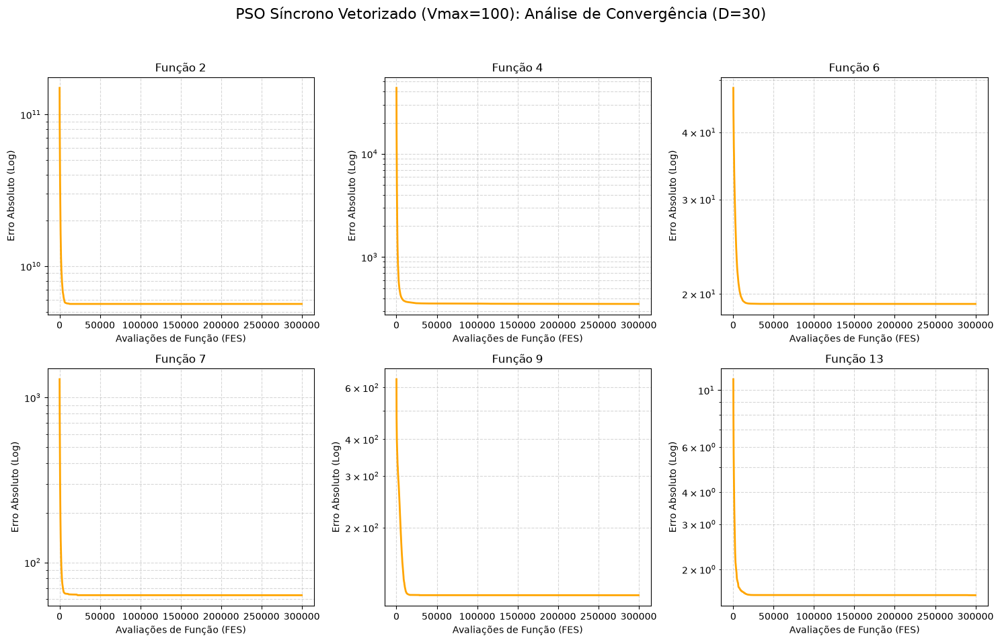


 RESULTADOS: PSO SÍNCRONO VETORIZADO (Com Vmax/Vmin) - DIMENSÃO D = 50
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 3.95e+09 | 3.96e+10 | 1.81e+10 | 1.50e+10 | 1.03e+10
F4       | 9.87e+01 | 7.03e+03 | 1.58e+03 | 1.49e+03 | 1.43e+03
F6       | 3.12e+01 | 5.86e+01 | 4.04e+01 | 3.84e+01 | 5.33e+00
F7       | 3.89e+01 | 5.29e+02 | 1.72e+02 | 1.40e+02 | 1.15e+02
F9       | 1.75e+02 | 4.00e+02 | 2.90e+02 | 2.90e+02 | 5.39e+01
F13      | 6.10e-01 | 4.54e+00 | 1.67e+00 | 8.48e-01 | 1.29e+00


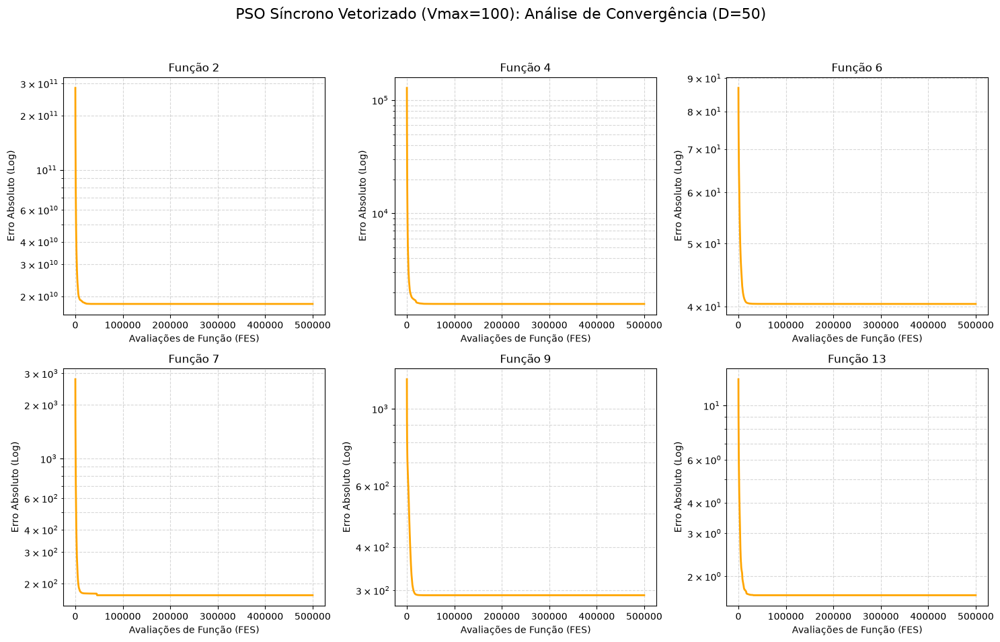

In [39]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time

def particle_swarm_optimization_batch(cec_func, D, w=0.729, c1=1.49445, c2=1.49445, NP=50, runs=30, vmax=100.0):
    max_FES = 10000 * D
    bounds = (-100, 100)
    vmin = -vmax  # Limite inferior simétrico de velocidade recomendado pela literatura

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=DEVICE).uniform_(bounds[0], bounds[1])
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=DEVICE)

    raw_fitness = cec_func.evaluate(pos) - cec_func.F_star
    errors = torch.where(raw_fitness < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_fitness)

    pbest_pos = pos.clone()
    pbest_errors = errors.clone()

    best_errors, best_idx = torch.min(pbest_errors, dim=1) # Formato: (runs,)
    batch_idx = torch.arange(runs, device=DEVICE)
    gbest_pos = pbest_pos[batch_idx, best_idx, :].clone()  # Formato: (runs, D)

    history = [best_errors.cpu().numpy()]
    FES = NP

    while FES < max_FES and not torch.all(best_errors <= 0.0):

        # Operador de Deslocamento: Atualização de Velocidade e Posição
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)

        vel = (w * vel +
               c1 * r1 * (pbest_pos - pos) +
               c2 * r2 * (gbest_pos.unsqueeze(1) - pos))

        # clamp de velocidade (vmax/vmin): evita overflow, sobretudo na F2
        vel = torch.clamp(vel, vmin, vmax)

        pos = torch.clamp(pos + vel, bounds[0], bounds[1])

        # Avaliação e Atualização (Baseada em Lote )
        raw_current_fitness = cec_func.evaluate(pos) - cec_func.F_star
        current_errors = torch.where(raw_current_fitness < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_current_fitness)

        # Atualização dos Pbest (Máscara booleana de melhoria)
        improves_pbest = current_errors < pbest_errors
        imp_pbest_exp = improves_pbest.unsqueeze(-1).expand_as(pos)

        pbest_pos = torch.where(imp_pbest_exp, pos, pbest_pos)
        pbest_errors = torch.where(improves_pbest, current_errors, pbest_errors)

        # Atualização dos Gbest (Avaliando o estado global atualizado)
        current_best_errors, current_best_idx = torch.min(pbest_errors, dim=1)

        improves_gbest = current_best_errors < best_errors
        imp_gbest_exp = improves_gbest.unsqueeze(-1).expand_as(gbest_pos)

        new_gbest_pos = pbest_pos[batch_idx, current_best_idx, :]

        gbest_pos = torch.where(imp_gbest_exp, new_gbest_pos, gbest_pos)
        best_errors = torch.where(improves_gbest, current_best_errors, best_errors)

        history.append(best_errors.cpu().numpy())
        FES += NP

    return best_errors.cpu().numpy(), np.array(history).T

funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Lógico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta célula (ver célula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*75}")
    print(f" RESULTADOS: PSO SÍNCRONO VETORIZADO (Com Vmax/Vmin) - DIMENSÃO D = {D}")
    print(f"{'='*75}")
    print(f"{'Função':<8} | {'Melhor':<10} | {'Pior':<10} | {'Média':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 75)

    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'PSO Síncrono Vetorizado (Vmax=100): Análise de Convergência (D={D})', fontsize=16)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories = particle_swarm_optimization_batch(cec_func, D, NP=NP_baseline, runs=runs_global, vmax=100.0)
        _save_run("pso", D, func_id, results, histories, np.linspace(NP_baseline, max_FES_global, histories.shape[1]), None, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)

        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))

        ax = axes[idx]
        ax.plot(x_axis, mean_history_plot, color='orange', linewidth=2)
        ax.set_yscale('log')
        ax.set_title(f'Função {func_id}')
        ax.set_xlabel('Avaliações de Função (FES)')
        ax.set_ylabel('Erro Absoluto (Log)')
        ax.grid(True, which="both", ls="--", alpha=0.5)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)

plt.show()


# PSO com DE

Acelerador Lógico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: HÍBRIDO PSO-DE VETORIZADO - DIMENSÃO D = 30
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 4.07e+09 | 2.35e+10 | 9.83e+09 | 8.86e+09 | 4.02e+09
F4       | 6.86e+01 | 2.30e+03 | 7.60e+02 | 6.33e+02 | 4.79e+02
F6       | 1.63e+01 | 2.91e+01 | 2.26e+01 | 2.22e+01 | 3.37e+00
F7       | 2.25e+01 | 1.64e+02 | 1.01e+02 | 1.02e+02 | 3.25e+01
F9       | 7.27e+01 | 1.87e+02 | 1.27e+02 | 1.36e+02 | 2.79e+01
F13      | 6.04e-01 | 3.80e+00 | 1.76e+00 | 9.06e-01 | 1.15e+00


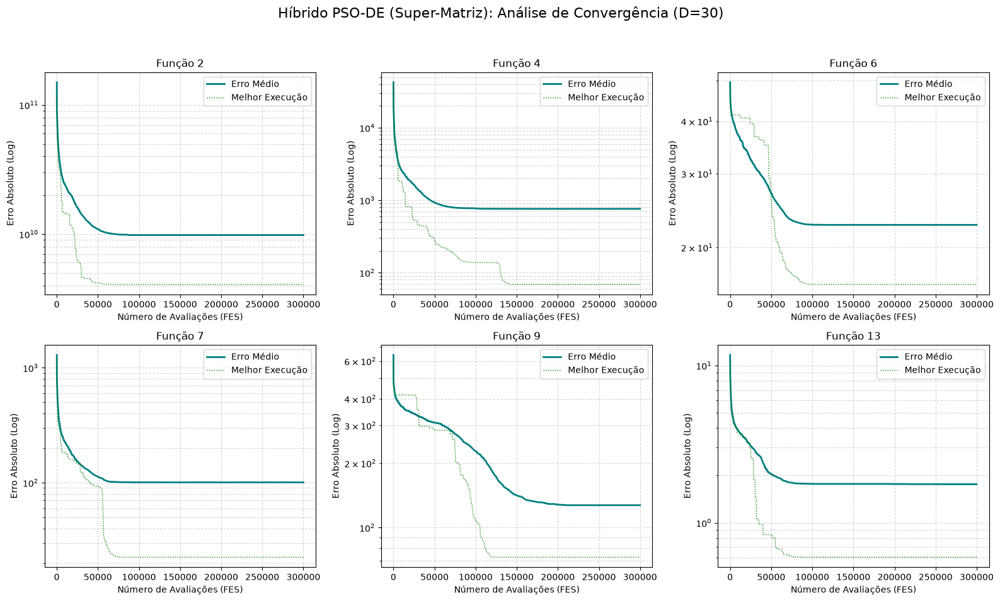


 RESULTADOS: HÍBRIDO PSO-DE VETORIZADO - DIMENSÃO D = 50
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 1.48e+10 | 6.66e+10 | 3.87e+10 | 3.70e+10 | 1.41e+10
F4       | 9.52e+02 | 9.56e+03 | 4.30e+03 | 4.20e+03 | 2.59e+03
F6       | 3.81e+01 | 5.79e+01 | 4.71e+01 | 4.64e+01 | 5.06e+00
F7       | 1.42e+02 | 7.13e+02 | 3.77e+02 | 3.59e+02 | 1.59e+02
F9       | 2.15e+02 | 4.25e+02 | 3.15e+02 | 3.10e+02 | 4.68e+01
F13      | 8.02e-01 | 5.07e+00 | 3.66e+00 | 3.88e+00 | 1.01e+00


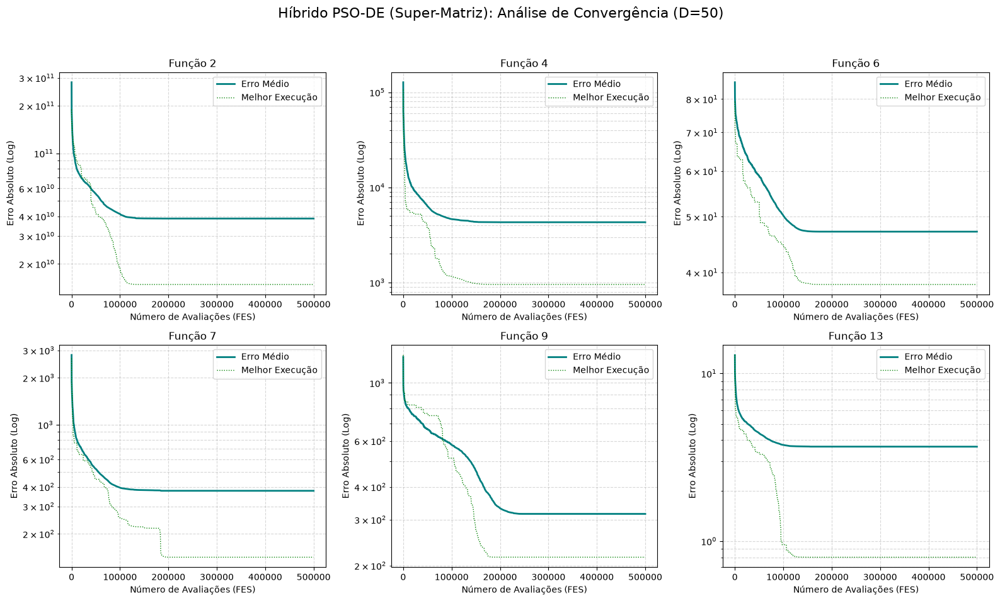

In [40]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time

def pso_de_hybrid_batch(cec_func, D, NP=50, runs=30, vmax=100.0):
    w_max, w_min = 0.9, 0.4
    c1, c2 = 1.49445, 1.49445
    F_mut = 0.5
    CR = 0.9

    max_FES = 10000 * D
    bounds = (-100, 100)
    vmin = -vmax  # Limite inferior simétrico de velocidade

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=DEVICE).uniform_(bounds[0], bounds[1])
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=DEVICE)

    fitness = cec_func.evaluate(pos)
    raw_errors = fitness - cec_func.F_star
    errors = torch.where(raw_errors < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_errors)
    FES = NP

    pbest_pos = pos.clone()
    pbest_errors = errors.clone()

    best_errors, best_idx = torch.min(pbest_errors, dim=1) # (runs,)
    batch_idx = torch.arange(runs, device=DEVICE)
    gbest_pos = pbest_pos[batch_idx, best_idx, :].clone()  # (runs, D)

    history = [best_errors.cpu().numpy()]

    batch_idx_view = batch_idx.view(runs, 1)
    np_idx = torch.arange(NP, device=DEVICE).view(1, NP)

    while FES < max_FES and not torch.all(best_errors <= 0.0):
        w_inertia = w_max - (w_max - w_min) * (FES / max_FES)

        # Fase 1: passo PSO
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)

        vel = (w_inertia * vel +
               c1 * r1 * (pbest_pos - pos) +
               c2 * r2 * (gbest_pos.unsqueeze(1) - pos))

        # clamp de velocidade (vmax/vmin): evita overflow, sobretudo na F2
        vel = torch.clamp(vel, vmin, vmax)

        pos = torch.clamp(pos + vel, bounds[0], bounds[1])

        # erro < 1e-8 -> 0 (função considerada resolvida)
        fitness_pso = cec_func.evaluate(pos)
        raw_errors_pso = fitness_pso - cec_func.F_star
        errors_pso = torch.where(raw_errors_pso < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_errors_pso)
        FES += NP

        # atualiza pbest com o resultado do passo PSO
        improves_pso = errors_pso < pbest_errors
        pbest_errors = torch.where(improves_pso, errors_pso, pbest_errors)
        pbest_pos = torch.where(improves_pso.unsqueeze(-1).expand_as(pos), pos, pbest_pos)

        if FES >= max_FES:
            break

        # Fase 2: passo DE
        rand_matrix = torch.rand((runs, NP, NP), device=DEVICE)
        rand_matrix.diagonal(dim1=1, dim2=2).fill_(float('inf'))

        r_indices = torch.topk(rand_matrix, 3, dim=2, largest=False).indices
        r1_idx, r2_idx, r3_idx = r_indices[..., 0], r_indices[..., 1], r_indices[..., 2]

        a = pos[batch_idx_view, r1_idx, :]
        b = pos[batch_idx_view, r2_idx, :]
        c = pos[batch_idx_view, r3_idx, :]

        mutant = torch.clamp(a + F_mut * (b - c), bounds[0], bounds[1])

        cross_points = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE) < CR
        force_cross = torch.randint(0, D, (runs, NP), device=DEVICE)
        cross_points[batch_idx_view, np_idx, force_cross] = True

        trials = torch.where(cross_points, mutant, pos)

        fitness_de = cec_func.evaluate(trials)
        raw_errors_de = fitness_de - cec_func.F_star
        errors_de = torch.where(raw_errors_de < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_errors_de)
        FES += NP

        # a posição migra para o trial da DE se este for melhor que o pós-PSO
        improves_de = errors_de < errors_pso
        pos = torch.where(improves_de.unsqueeze(-1).expand_as(pos), trials, pos)

        # pbest também considera o trial da DE
        improves_pbest_de = errors_de < pbest_errors
        pbest_errors = torch.where(improves_pbest_de, errors_de, pbest_errors)
        pbest_pos = torch.where(improves_pbest_de.unsqueeze(-1).expand_as(trials), trials, pbest_pos)

        # atualiza o gbest da rodada
        current_best_errors, current_best_idx = torch.min(pbest_errors, dim=1)
        improves_gbest = current_best_errors < best_errors

        new_gbest_pos = pbest_pos[batch_idx, current_best_idx, :]
        gbest_pos = torch.where(improves_gbest.unsqueeze(-1).expand_as(gbest_pos), new_gbest_pos, gbest_pos)
        best_errors = torch.where(improves_gbest, current_best_errors, best_errors)

        history.append(best_errors.cpu().numpy())

    return best_errors.cpu().numpy(), np.array(history).T

funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Lógico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta célula (ver célula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*75}")
    print(f" RESULTADOS: HÍBRIDO PSO-DE VETORIZADO - DIMENSÃO D = {D}")
    print(f"{'='*75}")
    print(f"{'Função':<8} | {'Melhor':<10} | {'Pior':<10} | {'Média':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 75)

    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    fig.suptitle(f'Híbrido PSO-DE (Super-Matriz): Análise de Convergência (D={D})', fontsize=16)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories = pso_de_hybrid_batch(cec_func, D, NP=NP_baseline, runs=runs_global, vmax=100.0)
        _save_run("pso_de", D, func_id, results, histories, np.linspace(NP_baseline, max_FES_global, histories.shape[1]), None, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)

        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        best_run_idx = np.argmin(results)
        best_history = histories[best_run_idx]

        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        best_history_plot = np.maximum(best_history, 1e-16)

        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))

        ax = axes[idx]
        ax.plot(x_axis, mean_history_plot, color='teal', linewidth=2, label='Erro Médio')
        ax.plot(x_axis, best_history_plot, color='green', linewidth=1, linestyle=':', label='Melhor Execução')

        ax.set_yscale('log')
        ax.set_title(f'Função {func_id}')
        ax.set_xlabel('Número de Avaliações (FES)')
        ax.set_ylabel('Erro Absoluto (Log)')
        ax.grid(True, which="both", ls="--", alpha=0.5)
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)

plt.show()


# Metodo de referencia: HGPSODE (Nash Bargaining PSO+DE)


Acelerador Logico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: HGPSODE (Nash Bargaining PSO+DE) - D = 30
Funcao   | Melhor     | Pior       | Media      | Mediana    | Desvio Pad.
-------------------------------------------------------------------------------------
F2       | 3.16e+03 | 1.98e+06 | 2.73e+05 | 7.14e+04 | 4.94e+05
F4       | 7.42e+01 | 3.03e+02 | 1.30e+02 | 1.18e+02 | 4.88e+01
F6       | 8.65e+00 | 2.32e+01 | 1.67e+01 | 1.76e+01 | 3.30e+00
F7       | 9.40e-03 | 1.97e+00 | 4.36e-01 | 3.36e-01 | 3.73e-01
F9       | 3.88e+01 | 1.70e+02 | 9.82e+01 | 9.40e+01 | 3.02e+01
F13      | 2.55e-01 | 5.68e-01 | 4.29e-01 | 4.15e-01 | 7.49e-02


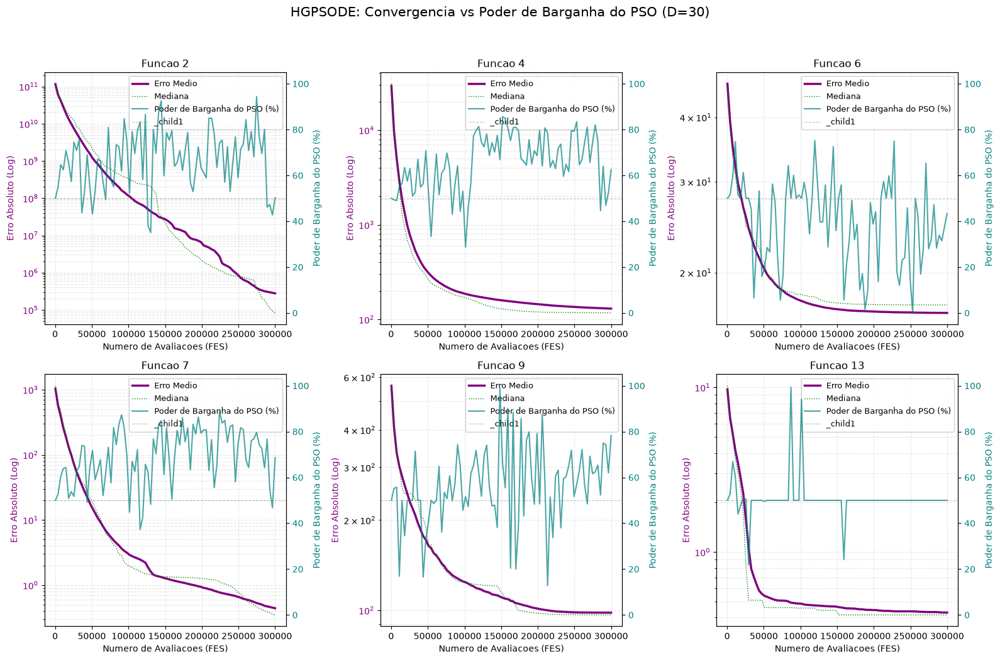


 PODER DE BARGANHA MEDIO (D=30)
Funcao   |      PSO (%) |       DE (%)
----------------------------------------------------------------------
F2       |        66.98 |        33.02
F4       |        66.62 |        33.38
F6       |        42.04 |        57.96
F7       |        66.89 |        33.11
F9       |        59.08 |        40.92
F13      |        50.67 |        49.33

 RESULTADOS: HGPSODE (Nash Bargaining PSO+DE) - D = 50
Funcao   | Melhor     | Pior       | Media      | Mediana    | Desvio Pad.
-------------------------------------------------------------------------------------
F2       | 5.00e+07 | 2.79e+09 | 4.32e+08 | 2.87e+08 | 5.16e+08
F4       | 1.59e+02 | 5.04e+02 | 2.99e+02 | 2.87e+02 | 7.98e+01
F6       | 2.66e+01 | 4.66e+01 | 3.77e+01 | 3.81e+01 | 5.03e+00
F7       | 1.34e+00 | 2.59e+01 | 3.81e+00 | 2.25e+00 | 5.49e+00
F9       | 1.41e+02 | 4.43e+02 | 2.43e+02 | 2.22e+02 | 7.76e+01
F13      | 4.12e-01 | 6.96e-01 | 5.69e-01 | 5.87e-01 | 8.13e-02


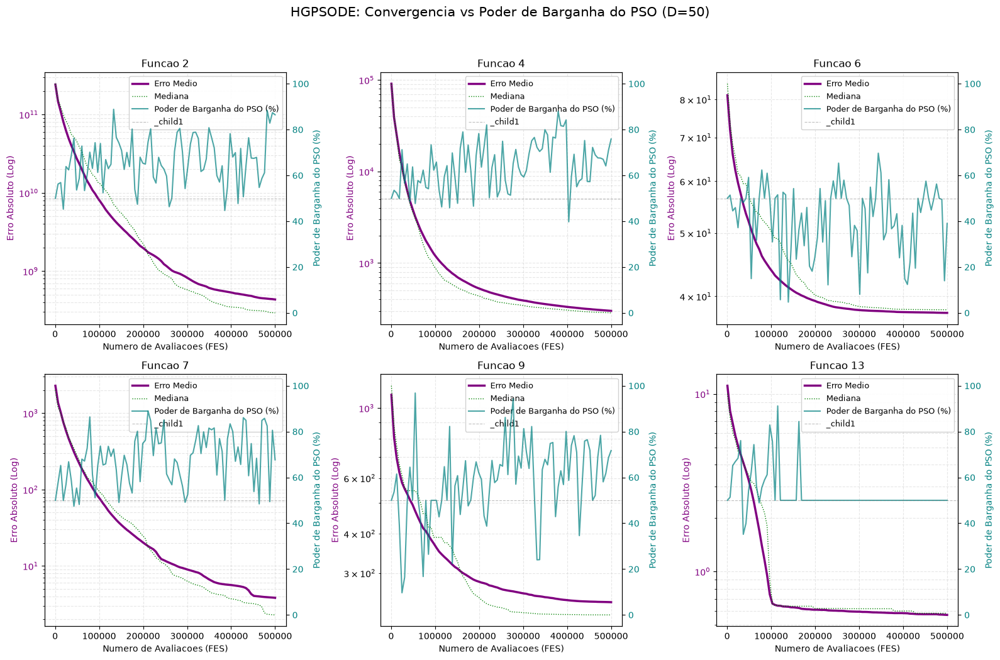


 PODER DE BARGANHA MEDIO (D=50)
Funcao   |      PSO (%) |       DE (%)
----------------------------------------------------------------------
F2       |        67.06 |        32.94
F4       |        64.46 |        35.54
F6       |        41.13 |        58.87
F7       |        67.04 |        32.96
F9       |        56.77 |        43.23
F13      |        51.32 |        48.68


In [50]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time

# HGPSODE (Dadvar, Navidi, Haj Seyyed Javadi, Mirzarezaee, 2022) portado ao CEC2014.
# Dois jogadores independentes: POP1 roda PSO, POP2 roda DE, cada uma com 6*D
# individuos. A cada rodada, cada lado executa N iteracoes e guarda os N melhores
# (M1, M2). A barganha de Nash sobre F = M1 x M2 escolhe o par (x1*, x2*) que
# maximiza o produto das melhorias sobre o ponto de desacordo (v1, v2). Os vetores
# sao trocados: x1* (lado PSO) vira a base da mutacao DE; x2* (lado DE) vira o
# atrator social do PSO na rodada seguinte. O ponto de desacordo e trocado.
def cooperative_nash_pso_de_batch(cec_func, D, runs=30, N=10, vmax=100.0):
    w, c1, c2 = 0.7298, 1.49445, 1.49445   # parametros do artigo (linha HGPSODE)
    F_de, CR = 0.5, 0.9
    P = 6 * D
    max_FES = 10000 * D
    lo, hi = -100.0, 100.0
    vmin = -vmax
    dev = DEVICE

    batch = torch.arange(runs, device=dev)
    bcol = batch.view(runs, 1)
    pcol = torch.arange(P, device=dev).view(1, P)

    def _err(x):
        e = cec_func.evaluate(x) - cec_func.F_star
        return torch.where(e < 1e-8, torch.zeros_like(e), e)

    # POP1 (PSO) e POP2 (DE)
    pos1 = torch.empty((runs, P, D), dtype=torch.float64, device=dev).uniform_(lo, hi)
    vel1 = torch.zeros((runs, P, D), dtype=torch.float64, device=dev)
    pbest1_pos = pos1.clone()
    pbest1_err = _err(pos1)
    pos2 = torch.empty((runs, P, D), dtype=torch.float64, device=dev).uniform_(lo, hi)
    err2 = _err(pos2)
    FES = 2 * P

    b1, i1 = torch.min(pbest1_err, dim=1)
    b2, i2 = torch.min(err2, dim=1)
    pso_wins = b1 <= b2
    # ponto de desacordo inicial: melhor dos dois lados (valor e vetor)
    v1 = torch.where(pso_wins, b1, b2)
    v2 = v1.clone()
    v1_vec = torch.where(pso_wins.unsqueeze(-1), pbest1_pos[batch, i1], pos2[batch, i2])
    v2_vec = v1_vec.clone()
    de_base = v1_vec.clone()      # base da mutacao DE (= x1*)
    pso_leader = v1_vec.clone()   # atrator social do PSO (= x2*)

    best_found_ever = torch.minimum(b1, b2)
    history = [best_found_ever.cpu().numpy()]
    nash_power = [np.full(runs, 50.0)]
    diversity = [torch.cat([pos1, pos2], dim=1).std(dim=1).mean(dim=-1).cpu().numpy()]

    while FES < max_FES:
        # -------- fase GPSO: N iteracoes; atrator social fixo = pso_leader --------
        M1e, M1v = [], []
        for _ in range(N):
            if FES >= max_FES:
                break
            r1 = torch.rand((runs, P, D), dtype=torch.float64, device=dev)
            r2 = torch.rand((runs, P, D), dtype=torch.float64, device=dev)
            vel1 = w * vel1 + c1 * r1 * (pbest1_pos - pos1) + c2 * r2 * (pso_leader.unsqueeze(1) - pos1)
            vel1 = torch.clamp(vel1, vmin, vmax)   # clamp de velocidade (porte ao CEC2014, F2)
            pos1 = torch.clamp(pos1 + vel1, lo, hi)
            e = _err(pos1)
            FES += P
            imp = e < pbest1_err
            pbest1_pos = torch.where(imp.unsqueeze(-1), pos1, pbest1_pos)
            pbest1_err = torch.where(imp, e, pbest1_err)
            be, bi = torch.min(pbest1_err, dim=1)
            M1e.append(be); M1v.append(pbest1_pos[batch, bi])
        best_found_ever = torch.minimum(best_found_ever, pbest1_err.min(dim=1).values)

        # -------- fase GDE: N iteracoes; base da mutacao fixa = de_base --------
        M2e, M2v = [], []
        for _ in range(N):
            if FES >= max_FES:
                break
            sc = torch.rand((runs, P, P), device=dev)
            sc.diagonal(dim1=1, dim2=2).fill_(float('inf'))
            r = torch.topk(sc, 2, dim=2, largest=False).indices
            xr2 = pos2[bcol, r[..., 0], :]
            xr3 = pos2[bcol, r[..., 1], :]
            mutant = torch.clamp(de_base.unsqueeze(1) + F_de * (xr2 - xr3), lo, hi)
            cp = torch.rand((runs, P, D), dtype=torch.float64, device=dev) < CR
            fj = torch.randint(0, D, (runs, P), device=dev)
            cp[bcol, pcol, fj] = True
            trial = torch.where(cp, mutant, pos2)
            te = _err(trial)
            FES += P
            acc = te < err2
            pos2 = torch.where(acc.unsqueeze(-1), trial, pos2)
            err2 = torch.where(acc, te, err2)
            be, bi = torch.min(err2, dim=1)
            M2e.append(be); M2v.append(pos2[batch, bi])
        best_found_ever = torch.minimum(best_found_ever, err2.min(dim=1).values)

        if not M1e or not M2e:
            break

        # -------- barganha de Nash sobre F = M1 x M2 --------
        M1e_t = torch.stack(M1e, dim=1)            # (runs, n1)
        M2e_t = torch.stack(M2e, dim=1)            # (runs, n2)
        M1v_t = torch.stack(M1v, dim=1)            # (runs, n1, D)
        M2v_t = torch.stack(M2v, dim=1)
        imp1 = v1.unsqueeze(1) - M1e_t             # melhoria sobre o desacordo (positiva = melhor)
        imp2 = v2.unsqueeze(1) - M2e_t
        prod = imp1.unsqueeze(2) * imp2.unsqueeze(1)          # (runs, n1, n2)
        feas = (imp1.unsqueeze(2) > 0) & (imp2.unsqueeze(1) > 0)
        prod = torch.where(feas, prod, torch.full_like(prod, -1.0))
        n2v = M2e_t.shape[1]
        bestval, bestpos = prod.reshape(runs, -1).max(dim=1)
        gi1 = torch.div(bestpos, n2v, rounding_mode='floor')
        gi2 = bestpos % n2v
        got = bestval > 0                          # existe par que melhora ambos os lados
        x1_err = torch.where(got, M1e_t[batch, gi1], v1)
        x2_err = torch.where(got, M2e_t[batch, gi2], v2)
        x1_vec = torch.where(got.unsqueeze(-1), M1v_t[batch, gi1], v1_vec)
        x2_vec = torch.where(got.unsqueeze(-1), M2v_t[batch, gi2], v2_vec)

        # poder de barganha do PSO = parcela da melhoria total no par vencedor
        s1 = torch.clamp(v1 - x1_err, min=0.0)
        s2 = torch.clamp(v2 - x2_err, min=0.0)
        power = torch.where((s1 + s2) > 0, 100.0 * s1 / (s1 + s2), torch.full_like(s1, 50.0))

        # troca de lucros e desacordo da proxima rodada (trocados)
        de_base, pso_leader = x1_vec, x2_vec
        v1, v2 = x2_err, x1_err
        v1_vec, v2_vec = x2_vec, x1_vec

        best_found_ever = torch.minimum(best_found_ever, torch.minimum(x1_err, x2_err))
        history.append(best_found_ever.cpu().numpy())
        nash_power.append(power.cpu().numpy())
        diversity.append(torch.cat([pos1, pos2], dim=1).std(dim=1).mean(dim=-1).cpu().numpy())

    return (best_found_ever.cpu().numpy(), np.array(history).T,
            np.array(nash_power).T, np.array(diversity).T)

funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30

print(f"Acelerador Logico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta celula (ver celula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*85}")
    print(f" RESULTADOS: HGPSODE (Nash Bargaining PSO+DE) - D = {D}")
    print(f"{'='*85}")
    print(f"{'Funcao':<8} | {'Melhor':<10} | {'Pior':<10} | {'Media':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 85)

    tabela_barganha = []
    max_FES_global = 10000 * D
    x0 = 12 * D  # FES no primeiro ponto do historico (2 * P)

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))
    fig.suptitle(f'HGPSODE: Convergencia vs Poder de Barganha do PSO (D={D})', fontsize=15)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories, nash_histories, diversity = cooperative_nash_pso_de_batch(
            cec_func, D, runs=runs_global, N=10, vmax=100.0
        )
        _save_run("nash_pso_de", D, func_id, results, histories,
                  np.linspace(x0, max_FES_global, histories.shape[1]), nash_histories, diversity,
                  wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)
        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")
        tabela_barganha.append((func_id, float(np.mean(nash_histories))))

        median_idx = int(np.argsort(np.abs(results - r_median))[0])
        mean_history = np.maximum(np.mean(histories, axis=0), 1e-16)
        median_history = np.maximum(histories[median_idx], 1e-16)
        x_axis = np.linspace(x0, max_FES_global, len(mean_history))

        ax1 = axes[idx]
        ax2 = ax1.twinx()
        ax1.plot(x_axis, mean_history, color='purple', linewidth=2.5, label='Erro Medio')
        ax1.plot(x_axis, median_history, color='green', linewidth=1, linestyle=':', label='Mediana')
        ax1.set_yscale('log')
        ax1.set_xlabel('Numero de Avaliacoes (FES)')
        ax1.set_ylabel('Erro Absoluto (Log)', color='purple')
        ax1.tick_params(axis='y', labelcolor='purple')
        ax2.plot(x_axis, nash_histories[median_idx], color='teal', linewidth=1.5, alpha=0.7,
                 label='Poder de Barganha do PSO (%)')
        ax2.axhline(50, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
        ax2.set_ylabel('Poder de Barganha do PSO (%)', color='teal')
        ax2.set_ylim(-5, 105)
        ax2.tick_params(axis='y', labelcolor='teal')
        ax1.set_title(f'Funcao {func_id}')
        ax1.grid(True, which="both", ls="--", alpha=0.3)
        lns = ax1.get_lines() + ax2.get_lines()
        ax1.legend(lns, [l.get_label() for l in lns], loc='upper right', framealpha=0.9, fontsize=9)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)
    plt.pause(1)

    print(f"\n{'='*70}")
    print(f" PODER DE BARGANHA MEDIO (D={D})")
    print(f"{'='*70}")
    print(f"{'Funcao':<8} | {'PSO (%)':>12} | {'DE (%)':>12}")
    print("-" * 70)
    for f_id, p in tabela_barganha:
        print(f"F{f_id:<7} | {p:>12.2f} | {100 - p:>12.2f}")

plt.show()


## Metodos-base da literatura

O trabalho parte de **dois** metodos de referencia, um para cada face da proposta:

**1. Ramo cooperativo (reproduzido) - HGPSODE**
Dadvar, M.; Navidi, H.; Haj Seyyed Javadi, H.; Mirzarezaee, M. (2022).
*A cooperative approach for combining particle swarm optimization and differential
evolution algorithms to solve single-objective optimization problems.*
Applied Intelligence, 52, 4089-4108. doi:10.1007/s10489-021-02605-x

Dois enxames independentes (PSO e DE, 6*D individuos cada) que, a cada rodada de N=10
iteracoes, formam o conjunto F = M1 x M2 dos N melhores de cada lado; a barganha de
Nash escolhe o par que maximiza o produto das melhorias sobre o ponto de desacordo, e
os vetores-lucro sao trocados (x1* -> base da mutacao DE; x2* -> atrator do PSO).
A celula acima reproduz esse algoritmo (Fig. 2 do artigo), **portado ao protocolo
CEC2014** (F2/F4/F6/F7/F9/F13, D=30 e 50, MaxFES = 10000*D, espaco [-100,100]^D com
shift+rotacao, 30 execucoes). Adaptacoes de porte: clamp de velocidade +-100
(estabilidade na F2 rotacionada) e criterio de parada por FES em vez de MaxIter fixo.
O artigo original avalia no CEC2005 (25 funcoes, MaxFES = 200000, P = 6*D, 10
execucoes; w=0.7298, c1=c2=1.49445, DE/rand/1/bin, CR=0.9, F=0.5, N=10).

*Alvo de validacao de fidelidade* (Tabela 4 do artigo, coluna HGPSODE, D=30, media do erro):
F1 ~ 1.9e-14 | F2 ~ 5.5e+02 | F4 ~ 1.4e+03 | F5 ~ 2.5e+03 | F6 ~ 6.3e+01 |
F9 ~ 7.3e+00 | F10 ~ 1.1e+02 | F11 ~ 2.6e+01 | F13 ~ 4.4e+00 | F14 ~ 1.2e+01.
Uma reproducao (opcional) de um subconjunto do CEC2005 com esta implementacao serve
de checagem direta; a verificacao minima e a conferencia parametro-a-parametro do
pseudocodigo (Fig. 2) mais a curva de poder de barganha (evidencia comportamental).

**2. Ramo competitivo (referencia conceitual) - EGPSO**
Liu, W.-B.; Wang, X.-J. (2008). *An evolutionary game based particle swarm
optimization algorithm.* Journal of Computational and Applied Mathematics, 214, 30-35.
doi:10.1016/j.cam.2007.01.028

Mapeia particulas -> jogadores, espaco de busca -> espaco de estrategias, fitness ->
payoff, gBest -> estrategia evolutivamente estavel, e usa **dinamica de replicador**
para modelar a busca. E avaliado apenas em funcoes classicas de baixa dimensao
(Six-point 1D, Rosenbrock n<=30, Sphere n=30) e nao operacionaliza o passo de
replicador para o PSO continuo (a parte concreta e PSO com inercia decrescente +
multi-start com deflexao). Por isso **nao e reproduzido**: entra como origem
conceitual da camada competitiva. A ideia e tornada operacional neste trabalho na
celula "Teoria dos Jogos Competitivo" (EGT-DEPSO), onde a escolha de estrategia por
individuo (regra de imitação de Schlag / replicador) recai sobre operadores concretos: passo PSO
vs passo DE.


# Teoria dos Jogos Competitivo

**Modificacao estrutural proposta (v1 - EGT-DEPSO).** No lugar da barganha de Nash em
nivel de populacao do HGPSODE, cada individuo passa a disputar, por conta propria, qual
operador usar. A particula e um jogador com duas estrategias puras:

- **estrategia 0 - passo PSO:** inercia decrescente (0.9 -> 0.4) e termo social pelo gbest;
- **estrategia 1 - passo DE:** DE/rand/1/bin sobre os pbest (F=0.5, CR=0.9), com selecao
  gulosa (so aceita a nova posicao se houver melhora).

A cada iteracao ha **uma avaliacao por particula**, usando a estrategia corrente. O
*payoff* e o ganho de erro na iteracao (erro do pbest antes menos depois). As adocoes
evoluem por **dinamica de replicador (regra de imitação proporcional de Schlag):** sorteia-se um oponente e a
particula copia a estrategia dele com probabilidade proporcional a diferenca normalizada
de payoff, apenas quando o oponente teve payoff maior. Apos 10 iteracoes seguidas com
payoff nulo ha **troca forcada** de estrategia (anti-estagnacao).

O contraste com o HGPSODE e o eixo do trabalho: la a escolha PSO/DE e **cooperativa** e
global (um unico par vencedor por rodada, via barganha de Nash); aqui e **competitiva** e
local (cada particula resolve o seu proprio jogo). Registram-se a curva de "% de uso do
DE" e a diversidade para acompanhar o equilibrio que emerge.

Acelerador Lógico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: EGT-DEPSO VETORIZADO (Super-Matriz) - DIMENSÃO D = 30
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 0.00e+00 | 2.53e+10 | 3.40e+09 | 1.41e+09 | 5.50e+09
F4       | 9.23e-01 | 2.80e+03 | 2.22e+02 | 6.99e+01 | 5.08e+02
F6       | 4.40e+00 | 2.21e+01 | 1.36e+01 | 1.46e+01 | 5.29e+00
F7       | 0.00e+00 | 2.30e+02 | 4.28e+01 | 1.56e+01 | 6.51e+01
F9       | 3.38e+01 | 1.20e+02 | 7.51e+01 | 7.56e+01 | 2.31e+01
F13      | 2.47e-01 | 4.63e+00 | 1.37e+00 | 6.68e-01 | 1.29e+00


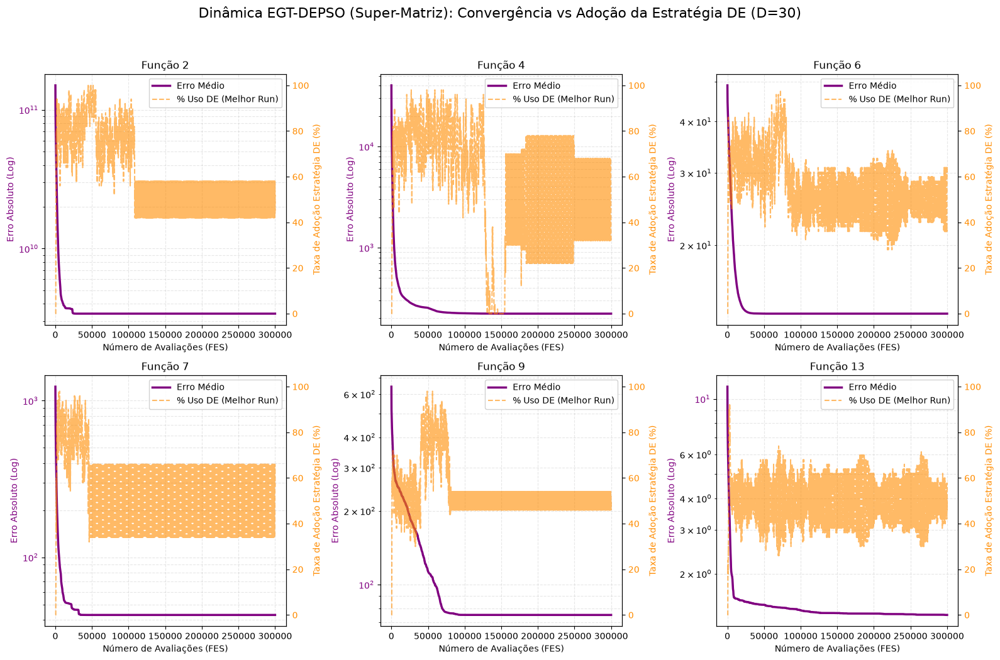


 ECONOMIA DO ENXAME (D=30): MÉTRICAS GLOBAIS DE ADOÇÃO DA ESTRATÉGIA DE
Função   | Média Geral de Adoção (%) | Pico Máximo Registrado (%)
---------------------------------------------------------------------------
F2       | 58.70                     | 62.37                    
F4       | 53.10                     | 59.24                    
F6       | 54.48                     | 55.16                    
F7       | 55.14                     | 56.52                    
F9       | 53.08                     | 54.36                    
F13      | 51.08                     | 53.92                    

 RESULTADOS: EGT-DEPSO VETORIZADO (Super-Matriz) - DIMENSÃO D = 50
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
---------------------------------------------------------------------------
F2       | 5.74e+02 | 2.95e+10 | 6.12e+09 | 2.71e+09 | 8.33e+09
F4       | 7.69e+01 | 8.36e+03 | 1.13e+03 | 4.50e+02 | 1.79e+03
F6       | 2.03e+01 | 5.15e+01 | 3.32e+01 | 3.23

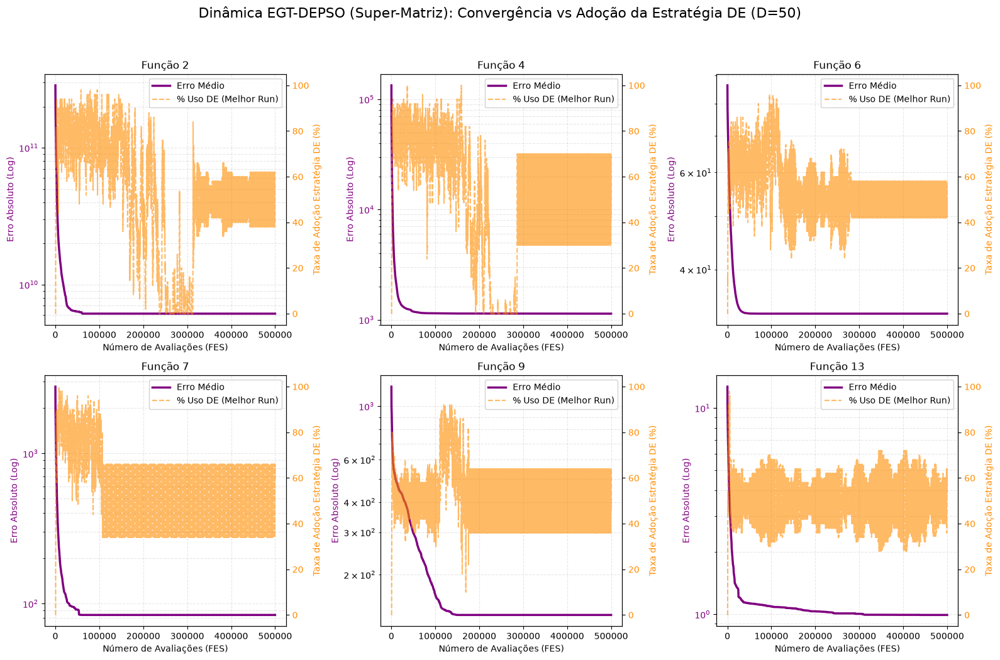


 ECONOMIA DO ENXAME (D=50): MÉTRICAS GLOBAIS DE ADOÇÃO DA ESTRATÉGIA DE
Função   | Média Geral de Adoção (%) | Pico Máximo Registrado (%)
---------------------------------------------------------------------------
F2       | 53.53                     | 56.68                    
F4       | 53.13                     | 59.52                    
F6       | 53.91                     | 54.93                    
F7       | 56.17                     | 57.79                    
F9       | 53.45                     | 54.67                    
F13      | 50.97                     | 54.03                    


In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time

# EGT-DEPSO: cada partícula escolhe entre passo PSO e passo DE por teoria dos jogos evolutivos
def egt_depso_batch(cec_func, D, NP=50, runs=30):
    # parâmetros do jogo evolutivo
    egt_stuck_limit = 10

    # Parâmetros do PSO e da DE
    w_max, w_min = 0.9, 0.4
    c1, c2 = 1.49445, 1.49445
    F_mut = 0.5
    CR = 0.9

    max_FES = 10000 * D
    bounds = (-100, 100)

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=DEVICE).uniform_(bounds[0], bounds[1])
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=DEVICE)

    pbest_pos = pos.clone()

    fitness = cec_func.evaluate(pos)
    pbest_errors = fitness - cec_func.F_star
    pbest_errors = torch.where(pbest_errors < 1e-8, torch.tensor(0.0, dtype=pbest_errors.dtype, device=pbest_errors.device), pbest_errors)

    FES = NP

    batch_idx = torch.arange(runs, device=DEVICE)
    best_found_ever, gbest_idx = torch.min(pbest_errors, dim=1)
    gbest_pos = pbest_pos[batch_idx, gbest_idx, :].clone()

    # 0 = PSO, 1 = DE
    strategy = torch.zeros((runs, NP), dtype=torch.long, device=DEVICE)
    stuck_count = torch.zeros((runs, NP), dtype=torch.long, device=DEVICE)

    history = [best_found_ever.cpu().numpy()]
    de_adoption_history = [(strategy.float().mean(dim=1) * 100.0).cpu().numpy()]
    diversity = [pos.std(dim=1).mean(dim=-1).cpu().numpy()]

    batch_idx_view = batch_idx.view(runs, 1)
    np_idx = torch.arange(NP, device=DEVICE).view(1, NP)

    while FES < max_FES and not torch.all(best_found_ever <= 1e-8):
        w_inertia = w_max - (w_max - w_min) * (FES / max_FES)
        old_pbest_errors = pbest_errors.clone()

        # Fase 1A: candidatos PSO
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)

        vel_new = (w_inertia * vel +
                   c1 * r1 * (pbest_pos - pos) +
                   c2 * r2 * (gbest_pos.unsqueeze(1) - pos))

        trials_pso = torch.clamp(pos + vel_new, bounds[0], bounds[1])

        # Fase 1B: candidatos DE (mutação sobre pbest)
        rand_matrix = torch.rand((runs, NP, NP), device=DEVICE)
        rand_matrix.diagonal(dim1=1, dim2=2).fill_(float('inf'))

        r_indices = torch.topk(rand_matrix, 3, dim=2, largest=False).indices
        r1_idx, r2_idx, r3_idx = r_indices[..., 0], r_indices[..., 1], r_indices[..., 2]

        a = pbest_pos[batch_idx_view, r1_idx, :]
        b = pbest_pos[batch_idx_view, r2_idx, :]
        c = pbest_pos[batch_idx_view, r3_idx, :]

        mutant = torch.clamp(a + F_mut * (b - c), bounds[0], bounds[1])

        cross_points = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE) < CR
        force_cross = torch.randint(0, D, (runs, NP), device=DEVICE)
        cross_points[batch_idx_view, np_idx, force_cross] = True

        trials_de = torch.where(cross_points, mutant, pos)

        # uma única avaliação por iteração (NP candidatos)
        # escolhe o candidato de cada partícula conforme a estratégia atual
        is_pso = (strategy == 0).unsqueeze(-1)
        trials = torch.where(is_pso, trials_pso, trials_de)

        # só partículas em modo PSO propagam velocidade
        vel = torch.where(is_pso, vel_new, vel)

        fit_new = cec_func.evaluate(trials)
        err_new = fit_new - cec_func.F_star
        err_new = torch.where(err_new < 1e-8, torch.tensor(0.0, dtype=err_new.dtype, device=err_new.device), err_new)

        FES += NP

        # aceitação gulosa do pbest
        improves = err_new < pbest_errors

        # PSO (estratégia 0) sempre se desloca; DE (estratégia 1) só aceita a nova posição com melhora (seleção gulosa da DE).
        move_mask = is_pso | improves.unsqueeze(-1)
        pos = torch.where(move_mask, trials, pos)
        pbest_errors = torch.where(improves, err_new, pbest_errors)
        pbest_pos = torch.where(improves.unsqueeze(-1).expand_as(pos), pos, pbest_pos)

        # atualiza o gbest da rodada
        current_best_errors, current_best_idx = torch.min(pbest_errors, dim=1)
        improves_gbest = current_best_errors < best_found_ever

        new_gbest_pos = pbest_pos[batch_idx, current_best_idx, :]
        gbest_pos = torch.where(improves_gbest.unsqueeze(-1).expand_as(gbest_pos), new_gbest_pos, gbest_pos)
        best_found_ever = torch.where(improves_gbest, current_best_errors, best_found_ever)

        # Fase 2: dinâmica de replicador (regra de imitação proporcional de Schlag)
        if FES < max_FES:
            # payoff = ganho de erro na iteração
            payoff = torch.clamp(old_pbest_errors - pbest_errors, min=0.0)

            pi_max, _ = payoff.max(dim=1, keepdim=True)
            pi_min, _ = payoff.min(dim=1, keepdim=True)

            # sorteia um oponente por partícula
            j_idx = torch.randint(0, NP, (runs, NP), device=DEVICE)
            payoff_j = payoff[batch_idx_view, j_idx]

            # regra de imitação proporcional de Schlag: adota a estratégia do oponente com prob. ~ diferença de payoff
            prob_switch = (payoff_j - payoff) / (pi_max - pi_min + 1e-15)
            switch_mask = (torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < prob_switch) & (payoff_j > payoff)

            new_strategy = torch.where(switch_mask, strategy[batch_idx_view, j_idx], strategy)

            # troca forçada após egt_stuck_limit iterações sem ganho
            stuck_count = torch.where(payoff == 0.0, stuck_count + 1, torch.zeros_like(stuck_count))
            limit_mask = stuck_count >= egt_stuck_limit

            new_strategy = torch.where(limit_mask, 1 - new_strategy, new_strategy)
            stuck_count = torch.where(limit_mask, torch.zeros_like(stuck_count), stuck_count)

            # zera a velocidade de quem passou a usar PSO nesta iteração
            changed_to_pso = (strategy != new_strategy) & (new_strategy == 0)
            vel = torch.where(changed_to_pso.unsqueeze(-1), torch.zeros_like(vel), vel)

            strategy = new_strategy

        history.append(best_found_ever.cpu().numpy())
        de_adoption_history.append((strategy.float().mean(dim=1) * 100.0).cpu().numpy())
        diversity.append(pos.std(dim=1).mean(dim=-1).cpu().numpy())

    return (best_found_ever.cpu().numpy(), np.array(history).T,
            np.array(de_adoption_history).T, np.array(diversity).T)

funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Lógico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta célula (ver célula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*75}")
    print(f" RESULTADOS: EGT-DEPSO VETORIZADO (Super-Matriz) - DIMENSÃO D = {D}")
    print(f"{'='*75}")
    print(f"{'Função':<8} | {'Melhor':<10} | {'Pior':<10} | {'Média':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 75)

    tabela_economia = []
    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))
    fig.suptitle(f'Dinâmica EGT-DEPSO (Super-Matriz): Convergência vs Adoção da Estratégia DE (D={D})', fontsize=16)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories, adoptions, diversity = egt_depso_batch(cec_func, D, NP=NP_baseline, runs=runs_global)
        _save_run("egt_depso", D, func_id, results, histories, np.linspace(NP_baseline, max_FES_global, histories.shape[1]), adoptions, diversity, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)
        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mean_adoptions_run = np.mean(adoptions, axis=1)
        a_mean = np.mean(mean_adoptions_run)
        a_max = np.max(mean_adoptions_run)
        tabela_economia.append((func_id, a_mean, a_max))

        best_run_idx = np.argmin(results)
        best_adoption = adoptions[best_run_idx]

        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)

        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))

        ax1 = axes[idx]
        ax2 = ax1.twinx()

        l1 = ax1.plot(x_axis, mean_history_plot, color='purple', linewidth=2.5, label='Erro Médio')
        ax1.set_yscale('log')
        ax1.set_xlabel('Número de Avaliações (FES)')
        ax1.set_ylabel('Erro Absoluto (Log)', color='purple')
        ax1.tick_params(axis='y', labelcolor='purple')

        x_axis_adop = np.linspace(NP_baseline, max_FES_global, len(best_adoption))
        l3 = ax2.plot(x_axis_adop, best_adoption, color='darkorange', linewidth=1.5, linestyle='--', alpha=0.6, label='% Uso DE (Melhor Run)')
        ax2.set_ylabel('Taxa de Adoção Estratégia DE (%)', color='darkorange')
        ax2.set_ylim(-5, 105)
        ax2.tick_params(axis='y', labelcolor='darkorange')

        ax1.set_title(f'Função {func_id}')
        ax1.grid(True, which="both", ls="--", alpha=0.3)

        lns = l1 + l3
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc='upper right', framealpha=0.9)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)

    print(f"\n{'='*75}")
    print(f" ECONOMIA DO ENXAME (D={D}): MÉTRICAS GLOBAIS DE ADOÇÃO DA ESTRATÉGIA DE")
    print(f"{'='*75}")
    print(f"{'Função':<8} | {'Média Geral de Adoção (%)':<25} | {'Pico Máximo Registrado (%)':<25}")
    print("-" * 75)
    for f_id, a_mean, a_max in tabela_economia:
        print(f"F{f_id:<7} | {a_mean:<25.2f} | {a_max:<25.2f}")

plt.show()


# Replicador - Mutador

**A proposta (v2).** Estende o jogo competitivo da celula anterior com tres mudancas
estruturais, avaliadas contra o HGPSODE e contra a literatura recente:

1. **Topologia em anel (L-best).** O termo social do passo PSO deixa de mirar o gbest e
   passa a mirar o melhor pbest da vizinhanca {i-1, i, i+1}. A informacao se propaga mais
   devagar pela populacao, o que atenua a convergencia prematura.
2. **Terceira estrategia pura - voo de Levy.** Alem de PSO L-best e DE, cada particula
   pode jogar um passo de Levy (Mantegna, beta=1.5) como exploracao de fundo: saltos
   longos ocasionais para escapar de bacias de atracao.
3. **Termo mutador no replicador.** Alem da imitacao proporcional de Schlag (replicador), com
   probabilidade `mu_rate` cada particula que nao e a lider da rodada troca de estrategia
   ao acaso ((s + {1,2}) mod 3). O mutador injeta inovacao: impede que a populacao
   colapse num unico operador e mantem as tres estrategias vivas ate o fim (diversidade
   sustentada).

Os operadores exploratorios (PSO e Levy) sempre se deslocam; o DE mantem a selecao
gulosa. Ha *clamp* de velocidade +-vmax (estabilidade na F2). O valor de `mu_rate`
(padrao 0.03) e varrido na celula de sensibilidade. Por iteracao registram-se a mistura
de estrategias [% PSO, % DE, % Levy] e a diversidade da populacao.

Acelerador Lógico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: EGT Lbest-DEPSO REPLICADOR-MUTADOR (Super-Matriz) - D = 30
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
-------------------------------------------------------------------------------------
F2       | 3.91e-08 | 7.85e-06 | 1.19e-06 | 5.76e-07 | 1.82e-06
F4       | 6.82e-05 | 3.67e-01 | 4.04e-02 | 1.97e-02 | 6.66e-02
F6       | 3.14e+00 | 1.47e+01 | 8.41e+00 | 8.06e+00 | 3.01e+00
F7       | 0.00e+00 | 2.70e-02 | 2.38e-03 | 0.00e+00 | 5.77e-03
F9       | 2.59e+01 | 6.17e+01 | 4.04e+01 | 4.04e+01 | 8.78e+00
F13      | 1.82e-01 | 3.33e-01 | 2.41e-01 | 2.37e-01 | 4.08e-02


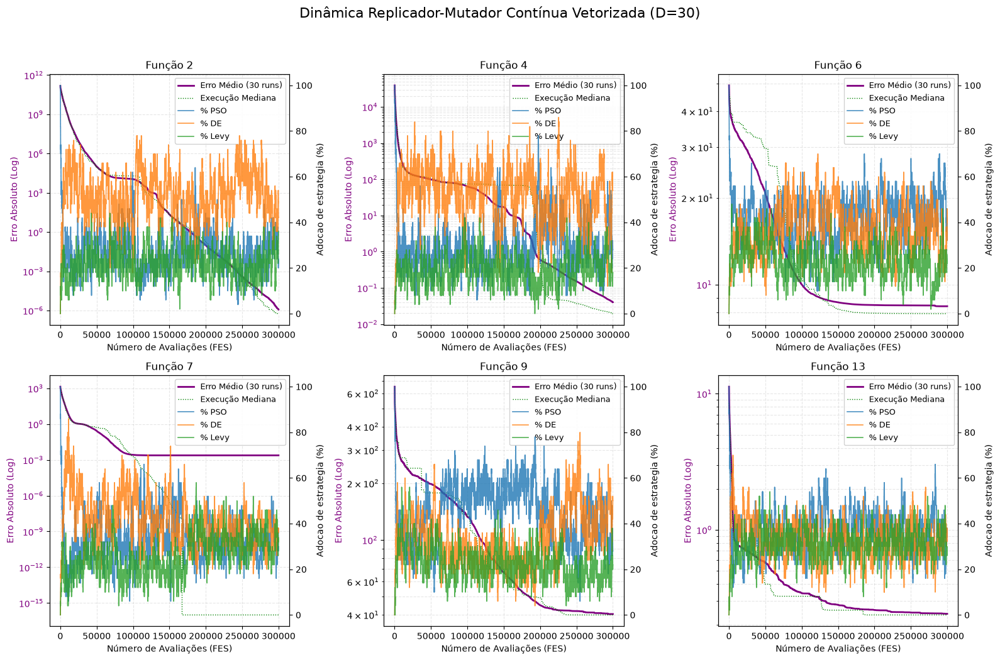


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=30)
Funcao   |        PSO |         DE |       Levy
-------------------------------------------------------------------------------------
F2       |      27.22 |      50.64 |      22.14
F4       |      28.47 |      52.20 |      19.33
F6       |      38.99 |      38.37 |      22.65
F7       |      31.92 |      42.36 |      25.72
F9       |      44.23 |      33.15 |      22.62
F13      |      36.57 |      32.84 |      30.59

 RESULTADOS: EGT Lbest-DEPSO REPLICADOR-MUTADOR (Super-Matriz) - D = 50
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
-------------------------------------------------------------------------------------
F2       | 1.32e+00 | 2.12e+04 | 6.01e+03 | 2.71e+03 | 7.16e+03
F4       | 6.27e+00 | 9.84e+01 | 7.78e+01 | 8.34e+01 | 2.72e+01
F6       | 5.56e+00 | 3.44e+01 | 2.01e+01 | 1.99e+01 | 6.57e+00
F7       | 0.00e+00 | 2.22e-02 | 4.84e-03 | 5.19e-09 | 6.25e-03
F9       | 6.67e+01 | 1.05e+02 | 8

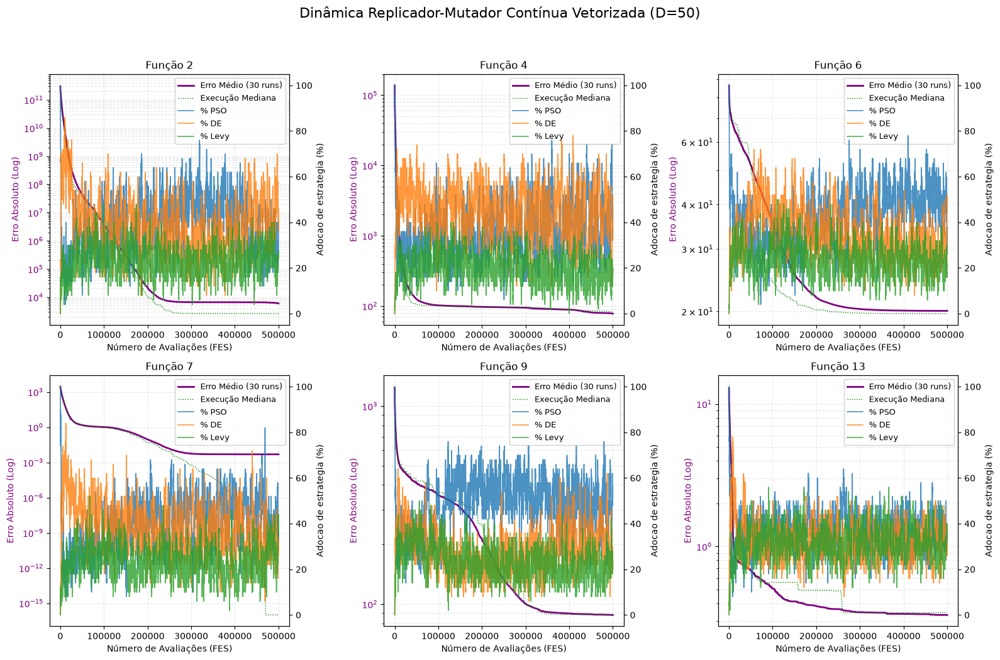


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=50)
Funcao   |        PSO |         DE |       Levy
-------------------------------------------------------------------------------------
F2       |      38.79 |      38.28 |      22.93
F4       |      35.82 |      43.11 |      21.06
F6       |      42.68 |      33.56 |      23.76
F7       |      39.92 |      37.54 |      22.54
F9       |      47.14 |      29.88 |      22.98
F13      |      35.65 |      33.09 |      31.27


In [4]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# EGT Lbest-DEPSO com dinâmica replicador-mutador: cada partícula joga entre 3
# estratégias (PSO L-best, DE, voo de Lévy); as adoções evoluem por replicador + mutador.
def egt_lbest_depso_replicator_mutator_batch(cec_func, D, NP=50, runs=30, vmax=100.0, mu_rate=0.03):
    w_max, w_min = 0.9, 0.4
    c1, c2 = 1.49445, 1.49445
    F_mut, CR = 0.5, 0.9

    max_FES = 10000 * D
    bounds = (-100, 100)
    vmin = -vmax  # Limite inferior simétrico de velocidade

    # escala do voo de Lévy (Mantegna)
    beta = 1.5
    sigma = (math.gamma(1 + beta) * math.sin(math.pi * beta / 2) /
             (math.gamma((1 + beta) / 2) * beta * 2**((beta - 1) / 2))) ** (1 / beta)
    alpha_levy = 0.01 * (bounds[1] - bounds[0])

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=DEVICE).uniform_(bounds[0], bounds[1])
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=DEVICE)
    pbest_pos = pos.clone()

    fitness = cec_func.evaluate(pos)
    raw_pbest_err = fitness - cec_func.F_star
    pbest_errors = torch.where(raw_pbest_err < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_pbest_err)

    FES = NP
    best_found_ever, gbest_idx = torch.min(pbest_errors, dim=1)

    # estratégia por partícula: 0 = PSO L-best, 1 = DE, 2 = Lévy
    strategy = torch.zeros((runs, NP), dtype=torch.long, device=DEVICE)

    history = [best_found_ever.cpu().numpy()]
    # mistura de estrategias por iteracao: colunas [% PSO, % DE, % Levy]
    strat_mix = [torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0]
    # diversidade: desvio-padrao medio das posicoes entre as NP particulas
    diversity = [pos.std(dim=1).mean(dim=-1).cpu().numpy()]

    batch_idx = torch.arange(runs, device=DEVICE).view(runs, 1)
    np_idx = torch.arange(NP, device=DEVICE).view(1, NP)

    while FES < max_FES and not torch.all(best_found_ever <= 0.0):
        w_inertia = w_max - (w_max - w_min) * (FES / max_FES)
        old_pbest_errors = pbest_errors.clone()

        # vizinho L-best: melhor pbest no anel {i-1, i, i+1}
        err_left = torch.roll(pbest_errors, shifts=1, dims=1)
        err_right = torch.roll(pbest_errors, shifts=-1, dims=1)

        err_stack = torch.stack([err_left, pbest_errors, err_right], dim=2)
        best_n_idx = torch.argmin(err_stack, dim=2)

        shift_map = torch.tensor([-1, 0, 1], device=DEVICE)
        actual_n_idx = (np_idx + shift_map[best_n_idx]) % NP
        lbest_pos = pbest_pos[batch_idx, actual_n_idx, :] # (runs, NP, D)

        # Fase 1: gera o candidato de cada estratégia para toda a população
        # estratégia 0: PSO com termo social do anel L-best
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)

        vel_pso = (w_inertia * vel +
                   c1 * r1 * (pbest_pos - pos) +
                   c2 * r2 * (lbest_pos - pos))

        # clamp de velocidade (vmax/vmin): evita overflow, sobretudo na F2
        vel_pso = torch.clamp(vel_pso, vmin, vmax)
        trials_pso = torch.clamp(pos + vel_pso, bounds[0], bounds[1])

        # estratégia 1: DE/rand/1 sobre pbest
        rand_matrix = torch.rand((runs, NP, NP), device=DEVICE)
        rand_matrix.diagonal(dim1=1, dim2=2).fill_(float('inf'))
        r_indices = torch.topk(rand_matrix, 3, dim=2, largest=False).indices

        a = pbest_pos[batch_idx, r_indices[..., 0], :]
        b = pbest_pos[batch_idx, r_indices[..., 1], :]
        c = pbest_pos[batch_idx, r_indices[..., 2], :]

        mutant = torch.clamp(a + F_mut * (b - c), bounds[0], bounds[1])
        cross_points = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE) < CR
        force_cross = torch.randint(0, D, (runs, NP), device=DEVICE)
        cross_points[batch_idx, np_idx, force_cross] = True
        trials_de = torch.where(cross_points, mutant, pos)

        # estratégia 2: voo de Lévy (exploração de fundo)
        u = torch.normal(0, sigma, (runs, NP, D), dtype=torch.float64, device=DEVICE)
        v = torch.normal(0, 1, (runs, NP, D), dtype=torch.float64, device=DEVICE)
        step = u / torch.abs(v) ** (1 / beta)
        trials_levy = torch.clamp(pos + alpha_levy * step, bounds[0], bounds[1])

        # aplica a estratégia de cada partícula e avalia (1 chamada por iteração)
        is_pso = (strategy == 0).unsqueeze(-1)
        is_de = (strategy == 1).unsqueeze(-1)

        trials = torch.where(is_pso, trials_pso, torch.where(is_de, trials_de, trials_levy))
        vel = torch.where(is_pso, vel_pso, vel)

        fit_new = cec_func.evaluate(trials)
        raw_err_new = fit_new - cec_func.F_star
        err_new = torch.where(raw_err_new < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_err_new)

        FES += NP

        improves = err_new < pbest_errors

        # PSO (0) e Lévy (2) são operadores exploratórios e sempre se deslocam;
        # DE (1) usa seleção gulosa: só aceita a nova posição em caso de melhora.
        move_mask = (~is_de) | improves.unsqueeze(-1)
        pos = torch.where(move_mask, trials, pos)
        pbest_errors = torch.where(improves, err_new, pbest_errors)
        pbest_pos = torch.where(improves.unsqueeze(-1).expand_as(pos), pos, pbest_pos)

        current_best_iter, gbest_idx = torch.min(pbest_errors, dim=1)
        best_found_ever = torch.minimum(best_found_ever, current_best_iter)

        # Fase 2: atualiza as estratégias (replicador + mutador)
        if FES < max_FES:
            payoff = torch.clamp(old_pbest_errors - pbest_errors, min=0.0)
            pi_max, _ = payoff.max(dim=1, keepdim=True)
            pi_min, _ = payoff.min(dim=1, keepdim=True)

            # replicador: copia a estratégia de um oponente com payoff maior (regra de Schlag)
            j_idx = torch.randint(0, NP, (runs, NP), device=DEVICE)
            payoff_j = payoff[batch_idx, j_idx]

            prob_switch = (payoff_j - payoff) / (pi_max - pi_min + 1e-15)
            switch_mask = (torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < prob_switch) & (payoff_j > payoff)
            new_strategy = torch.where(switch_mask, strategy[batch_idx, j_idx], strategy)

            # mutador: troca aleatória com prob. mu_rate (preserva o líder da rodada)
            is_not_leader = np_idx != gbest_idx.unsqueeze(1)
            mu_mask = (torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < mu_rate) & is_not_leader

            random_shift = torch.randint(1, 3, (runs, NP), device=DEVICE)
            mutated_strategy = (new_strategy + random_shift) % 3

            new_strategy = torch.where(mu_mask, mutated_strategy, new_strategy)

            changed_to_pso = (strategy != new_strategy) & (new_strategy == 0)
            vel = torch.where(changed_to_pso.unsqueeze(-1), torch.zeros_like(vel), vel)

            strategy = new_strategy

        history.append(best_found_ever.cpu().numpy())
        strat_mix.append(torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0)
        diversity.append(pos.std(dim=1).mean(dim=-1).cpu().numpy())

    return (best_found_ever.cpu().numpy(), np.array(history).T,
            np.stack(strat_mix, axis=1), np.array(diversity).T)

funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Lógico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta célula (ver célula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*85}")
    print(f" RESULTADOS: EGT Lbest-DEPSO REPLICADOR-MUTADOR (Super-Matriz) - D = {D}")
    print(f"{'='*85}")
    print(f"{'Função':<8} | {'Melhor':<10} | {'Pior':<10} | {'Média':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 85)

    tabela_economia = []
    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))
    fig.suptitle(f'Dinâmica Replicador-Mutador Contínua Vetorizada (D={D})', fontsize=16)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories, adoptions, diversity = egt_lbest_depso_replicator_mutator_batch(
            cec_func, D, NP=NP_baseline, runs=runs_global, vmax=100.0
        )
        _save_run("egt_replicador_mutador", D, func_id, results, histories, np.linspace(NP_baseline, max_FES_global, histories.shape[1]), adoptions, diversity, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)

        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mix_mean = adoptions.mean(axis=(0, 1))  # [% PSO, % DE, % Levy] medio nas 30 execucoes
        tabela_economia.append((func_id, mix_mean))

        median_idx = np.argsort(np.abs(results - r_median))[0]

        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        median_history_plot = np.maximum(histories[median_idx], 1e-16)

        ax1 = axes[idx]
        ax2 = ax1.twinx()

        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))
        ax1.plot(x_axis, mean_history_plot, color='purple', linewidth=2, label='Erro Médio (30 runs)')
        ax1.plot(x_axis, median_history_plot, color='green', linewidth=1, linestyle=':', label='Execução Mediana')

        ax1.set_yscale('log')
        ax1.set_xlabel('Número de Avaliações (FES)')
        ax1.set_ylabel('Erro Absoluto (Log)', color='purple')
        ax1.tick_params(axis='y', labelcolor='purple')

        mix_med = adoptions[median_idx]  # (T, 3)
        for k, lab in enumerate(('PSO', 'DE', 'Levy')):
            ax2.plot(x_axis, mix_med[:, k], linewidth=1.2, alpha=0.8, label=f'% {lab}')
        ax2.set_ylabel('Adocao de estrategia (%)')
        ax2.set_ylim(-5, 105)

        ax1.set_title(f'Função {func_id}')
        ax1.grid(True, which="both", ls="--", alpha=0.3)
        lns = ax1.get_lines() + ax2.get_lines()
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc='upper right', framealpha=0.9, fontsize=9)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)
    plt.pause(1)

    print(f"\n{'='*85}")
    print(f" USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D={D})")
    print(f"{'='*85}")
    print(f"{'Funcao':<8} | {'PSO':>10} | {'DE':>10} | {'Levy':>10}")
    print("-" * 85)
    for f_id, mix in tabela_economia:
        print(f"F{f_id:<7} | {mix[0]:>10.2f} | {mix[1]:>10.2f} | {mix[2]:>10.2f}")

plt.show()


# Variante do Replicador-Mutador: topologia global (gbest)

Mesma ideia da ablacao anterior, mas no sentido oposto: o termo social do PSO passa a
usar **apenas o lider global (gbest)**, sem o vizinho do anel local. Comparar com a
versao original (so lbest) e com a variante lbest+gbest.


Acelerador Logico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: REPLICADOR-MUTADOR + TOPOLOGIA GLOBAL (PSO so gbest) - D = 30
Funcao   | Melhor     | Pior       | Media      | Mediana    | Desvio Pad.
----------------------------------------------------------------------------------------
F2       | 0.00e+00 | 3.45e+04 | 2.30e+03 | 0.00e+00 | 8.60e+03
F4       | 7.88e-07 | 7.14e+01 | 1.12e+01 | 3.12e-03 | 2.43e+01
F6       | 3.38e+00 | 1.59e+01 | 8.65e+00 | 9.02e+00 | 3.20e+00
F7       | 0.00e+00 | 4.66e-02 | 9.93e-03 | 7.40e-03 | 1.13e-02
F9       | 2.54e+01 | 6.79e+01 | 4.69e+01 | 4.62e+01 | 1.02e+01
F13      | 2.11e-01 | 5.00e-01 | 3.30e-01 | 3.31e-01 | 6.80e-02


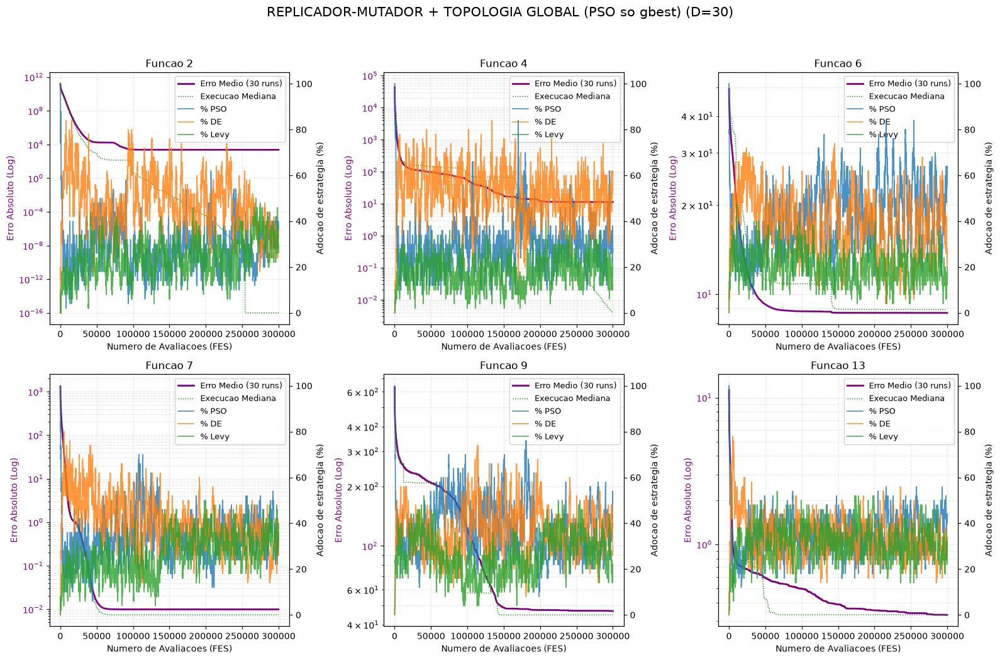


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=30)
Funcao   |        PSO |         DE |       Levy
----------------------------------------------------------------------------------------
F2       |      29.80 |      47.32 |      22.88
F4       |      30.57 |      49.64 |      19.79
F6       |      39.80 |      39.64 |      20.55
F7       |      33.28 |      39.54 |      27.18
F9       |      36.24 |      36.84 |      26.91
F13      |      34.17 |      34.34 |      31.49

 RESULTADOS: REPLICADOR-MUTADOR + TOPOLOGIA GLOBAL (PSO so gbest) - D = 50
Funcao   | Melhor     | Pior       | Media      | Mediana    | Desvio Pad.
----------------------------------------------------------------------------------------
F2       | 3.24e-01 | 2.62e+04 | 2.34e+03 | 3.24e+02 | 6.41e+03
F4       | 4.88e+00 | 2.28e+02 | 6.41e+01 | 7.35e+01 | 4.52e+01
F6       | 1.12e+01 | 3.72e+01 | 2.54e+01 | 2.69e+01 | 5.55e+00
F7       | 0.00e+00 | 4.43e-02 | 8.21e-03 | 7.40e-03 | 9.93e-03
F9       | 6.67e+01 | 1.5

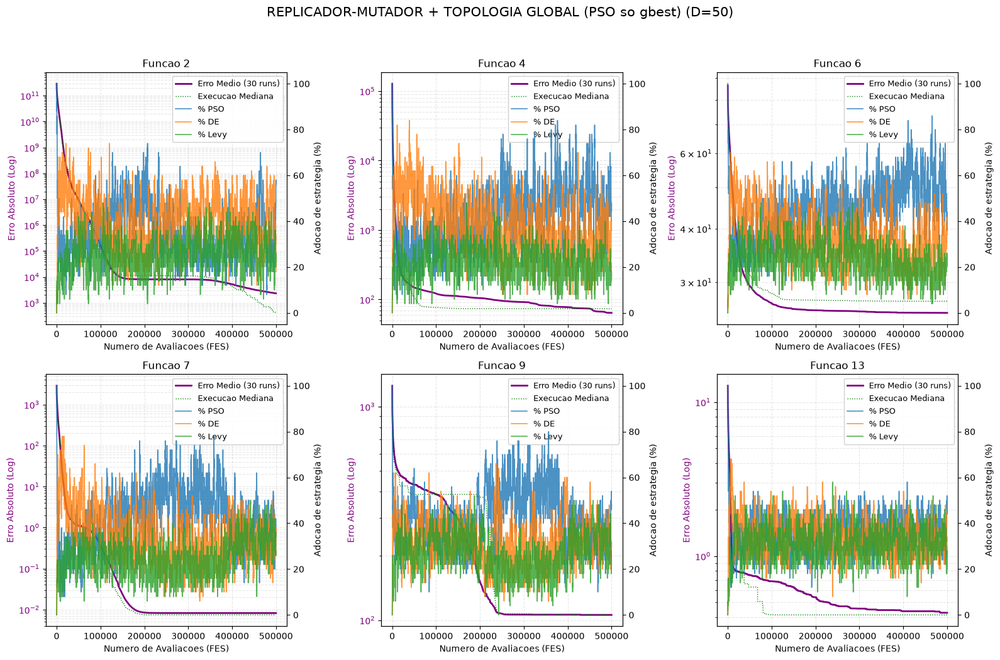


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=50)
Funcao   |        PSO |         DE |       Levy
----------------------------------------------------------------------------------------
F2       |      36.64 |      38.47 |      24.89
F4       |      38.27 |      41.67 |      20.06
F6       |      44.19 |      33.15 |      22.67
F7       |      40.58 |      34.66 |      24.77
F9       |      39.92 |      33.18 |      26.90
F13      |      33.91 |      34.28 |      31.81


In [44]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# EGT Replicador-Mutador com PSO de topologia global (gbest): o termo social do PSO usa
# apenas o lider global, sem o vizinho do anel local. Ablacao da topologia (contraste com
# a versao original, que usa so lbest, e com a variante lbest+gbest).
def egt_replmut_gbest_batch(cec_func, D, NP=50, runs=30, vmax=100.0,
                              op_mode="de", topology="gbest",
                              H=6, p_best_rate=0.11, arc_rate=2.0):
    """Variante do Replicador-Mutador, parametrizada em dois eixos.

    op_mode  : 'de'     -> estrategia 1 = DE/rand/1/bin sobre pbest (versao original).
               'lshade' -> estrategia 1 = operador SHADE (current-to-pbest/1 com arquivo
                           externo e F/CR adaptativos). Sem LPSR: NP fixo, para nao
                           redimensionar os tensores da dinamica de jogo.
    topology : 'lbest'   -> termo social so do anel local k=3 (versao original).
               'gbest'    -> termo social so do lider global (c_cog=c_glob=1.49445, sem lbest).
               'hibrida'  -> anel local + gbest (4 termos; c_cog=c_loc=1.0, c_glob=0.5).
    Retorno: (best_found_ever, historico (runs, T), adocao_de_Levy (runs, T)).
    """
    mu_rate = 0.03
    w_max, w_min = 0.9, 0.4
    if topology == "hibrida":
        c_cog, c_loc, c_glob = 1.0, 1.0, 0.5
    elif topology == "gbest":
        c_cog, c_loc, c_glob = 1.49445, 0.0, 1.49445   # so gbest no termo social
    else:  # 'lbest'
        c_cog, c_loc, c_glob = 1.49445, 1.49445, 0.0
    F_mut, CR_de = 0.5, 0.9

    max_FES = 10000 * D
    lower, upper = -100.0, 100.0
    vmin = -vmax
    dev = DEVICE

    beta = 1.5
    sigma = (math.gamma(1 + beta) * math.sin(math.pi * beta / 2) /
             (math.gamma((1 + beta) / 2) * beta * 2 ** ((beta - 1) / 2))) ** (1 / beta)
    alpha_levy = 0.01 * (upper - lower)

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=dev).uniform_(lower, upper)
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=dev)
    pbest_pos = pos.clone()

    raw = cec_func.evaluate(pos) - cec_func.F_star
    pbest_errors = torch.where(raw < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=dev), raw)
    FES = NP
    best_found_ever, gbest_idx = torch.min(pbest_errors, dim=1)

    strategy = torch.zeros((runs, NP), dtype=torch.long, device=dev)

    use_lshade = (op_mode == "lshade")
    if use_lshade:
        capacity = max(1, int(round(NP * arc_rate)))
        memory_F = torch.full((runs, H), 0.5, dtype=torch.float64, device=dev)
        memory_CR = torch.full((runs, H), 0.5, dtype=torch.float64, device=dev)
        memory_idx = torch.zeros(runs, dtype=torch.long, device=dev)
        archive = torch.zeros((runs, capacity, D), dtype=torch.float64, device=dev)
        archive_size = torch.zeros(runs, dtype=torch.long, device=dev)

    history = [best_found_ever.cpu().numpy()]
    # mistura de estrategias por iteracao: colunas [% PSO, % DE, % Levy]
    strat_mix = [torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0]
    # diversidade: desvio-padrao medio das posicoes entre as NP particulas
    diversity = [pos.std(dim=1).mean(dim=-1).cpu().numpy()]

    batch_col = torch.arange(runs, device=dev).view(runs, 1)
    run_ids = torch.arange(runs, device=dev)
    np_idx = torch.arange(NP, device=dev).view(1, NP)

    while FES < max_FES and not torch.all(best_found_ever <= 0.0):
        w_inertia = w_max - (w_max - w_min) * (FES / max_FES)
        old_pbest_errors = pbest_errors.clone()
        old_pos = pos.clone()
        old_strategy = strategy.clone()

        # vizinho L-best: melhor pbest no anel {i-1, i, i+1}
        err_left = torch.roll(pbest_errors, 1, dims=1)
        err_right = torch.roll(pbest_errors, -1, dims=1)
        err_stack = torch.stack([err_left, pbest_errors, err_right], dim=2)
        best_n = torch.argmin(err_stack, dim=2)
        shift_map = torch.tensor([-1, 0, 1], device=dev)
        n_idx = (np_idx + shift_map[best_n]) % NP
        lbest_pos = pbest_pos[batch_col, n_idx, :]
        gbest_pos = pbest_pos[run_ids, gbest_idx, :]

        # estrategia 0: PSO (termo social conforme 'topology'; nesta celula, apenas gbest)
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=dev)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=dev)
        vel_pso = w_inertia * vel + c_cog * r1 * (pbest_pos - pos) + c_loc * r2 * (lbest_pos - pos)
        if c_glob > 0.0:
            r3 = torch.rand((runs, NP, D), dtype=torch.float64, device=dev)
            vel_pso = vel_pso + c_glob * r3 * (gbest_pos.unsqueeze(1) - pos)
        vel_pso = torch.clamp(vel_pso, vmin, vmax)
        trials_pso = torch.clamp(pos + vel_pso, lower, upper)

        # estrategia 1: DE/rand/1 (op_mode='de') ou operador SHADE (op_mode='lshade')
        if not use_lshade:
            rm = torch.rand((runs, NP, NP), device=dev)
            rm.diagonal(dim1=1, dim2=2).fill_(float('inf'))
            ri = torch.topk(rm, 3, dim=2, largest=False).indices
            a = pbest_pos[batch_col, ri[..., 0], :]
            b = pbest_pos[batch_col, ri[..., 1], :]
            cc = pbest_pos[batch_col, ri[..., 2], :]
            mutant = torch.clamp(a + F_mut * (b - cc), lower, upper)
            cp = torch.rand((runs, NP, D), dtype=torch.float64, device=dev) < CR_de
            fc = torch.randint(0, D, (runs, NP), device=dev)
            cp[batch_col, np_idx, fc] = True
            trials_op = torch.where(cp, mutant, pos)
            Fi = CRi = None
        else:
            rr_ = torch.randint(0, H, (runs, NP), device=dev)
            mF = memory_F.gather(1, rr_)
            mCR = memory_CR.gather(1, rr_)
            CRi = torch.clamp(mCR + 0.1 * torch.randn((runs, NP), dtype=torch.float64, device=dev), 0.0, 1.0)
            Fi = mF + 0.1 * torch.tan(math.pi * (torch.rand((runs, NP), dtype=torch.float64, device=dev) - 0.5))
            for _ in range(8):
                bad = Fi <= 0
                if not torch.any(bad):
                    break
                rep = mF + 0.1 * torch.tan(math.pi * (torch.rand((runs, NP), dtype=torch.float64, device=dev) - 0.5))
                Fi = torch.where(bad, rep, Fi)
            Fi = torch.clamp(Fi, 1e-12, 1.0)

            p_num = max(2, int(round(p_best_rate * NP)))
            ranked = torch.argsort(pbest_errors, dim=1)
            p_choice = torch.randint(0, p_num, (runs, NP), device=dev)
            x_pbest = pbest_pos[batch_col, ranked.gather(1, p_choice), :]

            score = torch.rand((runs, NP, NP), dtype=torch.float64, device=dev)
            ids = torch.arange(NP, device=dev)
            score[:, ids, ids] = float('inf')
            r1i = torch.topk(score, 1, dim=2, largest=False).indices[..., 0]
            x_r1 = pos[batch_col, r1i, :]

            total = NP + capacity
            sc2 = torch.rand((runs, NP, total), dtype=torch.float64, device=dev)
            pop_ids = torch.arange(NP, device=dev).view(1, 1, NP)
            own = pop_ids == torch.arange(NP, device=dev).view(1, NP, 1)
            r1m = pop_ids == r1i.unsqueeze(-1)
            sc2[:, :, :NP] = sc2[:, :, :NP].masked_fill(own | r1m, float('inf'))
            arc_ids = torch.arange(capacity, device=dev).view(1, 1, capacity)
            sc2[:, :, NP:] = sc2[:, :, NP:].masked_fill(~(arc_ids < archive_size.view(runs, 1, 1)), float('inf'))
            r2c = torch.argmin(sc2, dim=2)
            use_arc = r2c >= NP
            arc_slot = torch.clamp(r2c - NP, min=0)
            x_r2 = torch.where(use_arc.unsqueeze(-1),
                               archive[batch_col, arc_slot, :],
                               pos[batch_col, torch.clamp(r2c, max=NP - 1), :])

            mutant = pos + Fi.unsqueeze(-1) * (x_pbest - pos) + Fi.unsqueeze(-1) * (x_r1 - x_r2)
            mutant = torch.where(mutant < lower, (pos + lower) / 2.0, mutant)
            mutant = torch.where(mutant > upper, (pos + upper) / 2.0, mutant)
            cp = torch.rand((runs, NP, D), dtype=torch.float64, device=dev) < CRi.unsqueeze(-1)
            fc = torch.randint(0, D, (runs, NP), device=dev)
            cp[batch_col, np_idx, fc] = True
            trials_op = torch.where(cp, mutant, pos)

        # estrategia 2: voo de Levy
        u = torch.normal(0.0, sigma, (runs, NP, D), dtype=torch.float64, device=dev)
        vv = torch.normal(0.0, 1.0, (runs, NP, D), dtype=torch.float64, device=dev)
        step = u / torch.abs(vv) ** (1 / beta)
        trials_levy = torch.clamp(pos + alpha_levy * step, lower, upper)

        # aplica a estrategia de cada particula e avalia (1 chamada por iteracao)
        is_pso = (strategy == 0).unsqueeze(-1)
        is_op = (strategy == 1).unsqueeze(-1)
        trials = torch.where(is_pso, trials_pso, torch.where(is_op, trials_op, trials_levy))
        vel = torch.where(is_pso, vel_pso, vel)

        raw_new = cec_func.evaluate(trials) - cec_func.F_star
        err_new = torch.where(raw_new < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=dev), raw_new)
        FES += NP

        improves = err_new < pbest_errors
        move_mask = (~is_op) | improves.unsqueeze(-1)   # PSO/Levy sempre; DE/SHADE guloso
        pos = torch.where(move_mask, trials, pos)
        pbest_errors = torch.where(improves, err_new, pbest_errors)
        pbest_pos = torch.where(improves.unsqueeze(-1).expand_as(pos), pos, pbest_pos)

        current_best_iter, gbest_idx = torch.min(pbest_errors, dim=1)
        best_found_ever = torch.minimum(best_found_ever, current_best_iter)

        if use_lshade:
            succ = improves & (old_strategy == 1)
            add_rank = torch.cumsum(succ.to(torch.long), dim=1) - 1
            slots = archive_size.view(runs, 1) + add_rank
            valid = succ & (slots < capacity)
            if torch.any(valid):
                ra, ca = torch.where(valid)
                archive[ra, slots[ra, ca], :] = old_pos[ra, ca, :]
            archive_size = torch.clamp(archive_size + succ.sum(dim=1), max=capacity)

            gain = torch.where(succ, old_pbest_errors - err_new, torch.zeros_like(err_new))
            denom = gain.sum(dim=1)
            has = denom > 0
            wgt = torch.where(has.unsqueeze(-1), gain / torch.clamp(denom.unsqueeze(-1), min=1e-30),
                              torch.zeros_like(gain))
            sf = (wgt * Fi).sum(dim=1)
            sf2 = (wgt * Fi * Fi).sum(dim=1)
            scr = (wgt * CRi).sum(dim=1)
            newF = sf2 / torch.clamp(sf, min=1e-30)
            mi = memory_idx.clone()
            memory_F[run_ids, mi] = torch.where(has, newF, memory_F[run_ids, mi])
            memory_CR[run_ids, mi] = torch.where(has, scr, memory_CR[run_ids, mi])
            memory_idx = torch.where(has, (memory_idx + 1) % H, memory_idx)

        if FES < max_FES:
            payoff = torch.clamp(old_pbest_errors - pbest_errors, min=0.0)
            pi_max, _ = payoff.max(dim=1, keepdim=True)
            pi_min, _ = payoff.min(dim=1, keepdim=True)
            j_idx = torch.randint(0, NP, (runs, NP), device=dev)
            payoff_j = payoff[batch_col, j_idx]
            prob_switch = (payoff_j - payoff) / (pi_max - pi_min + 1e-15)
            sw = (torch.rand((runs, NP), dtype=torch.float64, device=dev) < prob_switch) & (payoff_j > payoff)
            new_strategy = torch.where(sw, strategy[batch_col, j_idx], strategy)
            is_not_leader = np_idx != gbest_idx.unsqueeze(1)
            mu = (torch.rand((runs, NP), dtype=torch.float64, device=dev) < mu_rate) & is_not_leader
            shift = torch.randint(1, 3, (runs, NP), device=dev)
            mutated = (new_strategy + shift) % 3
            new_strategy = torch.where(mu, mutated, new_strategy)
            changed_to_pso = (strategy != new_strategy) & (new_strategy == 0)
            vel = torch.where(changed_to_pso.unsqueeze(-1), torch.zeros_like(vel), vel)
            strategy = new_strategy

        history.append(best_found_ever.cpu().numpy())
        strat_mix.append(torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0)
        diversity.append(pos.std(dim=1).mean(dim=-1).cpu().numpy())

    return (best_found_ever.cpu().numpy(), np.array(history).T,
            np.stack(strat_mix, axis=1), np.array(diversity).T)

# Avaliacao Experimental
funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Logico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta celula (ver celula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*88}")
    print(f" RESULTADOS: REPLICADOR-MUTADOR + TOPOLOGIA GLOBAL (PSO so gbest) - D = {D}")
    print(f"{'='*88}")
    print(f"{'Funcao':<8} | {'Melhor':<10} | {'Pior':<10} | {'Media':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 88)

    tabela_economia = []
    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))
    fig.suptitle(f'REPLICADOR-MUTADOR + TOPOLOGIA GLOBAL (PSO so gbest) (D={D})', fontsize=15)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories, adoptions, diversity = egt_replmut_gbest_batch(
            cec_func, D, NP=NP_baseline, runs=runs_global, vmax=100.0
        )
        _save_run("egt_replmut_gbest", D, func_id, results, histories,
                  np.linspace(NP_baseline, max_FES_global, histories.shape[1]), adoptions, diversity, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)
        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mix_mean = adoptions.mean(axis=(0, 1))  # [% PSO, % DE, % Levy] medio nas 30 execucoes
        tabela_economia.append((func_id, mix_mean))

        median_idx = int(np.argsort(np.abs(results - r_median))[0])
        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        median_history_plot = np.maximum(histories[median_idx], 1e-16)

        ax1 = axes[idx]
        ax2 = ax1.twinx()
        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))
        ax1.plot(x_axis, mean_history_plot, color='purple', linewidth=2, label='Erro Medio (30 runs)')
        ax1.plot(x_axis, median_history_plot, color='green', linewidth=1, linestyle=':', label='Execucao Mediana')
        ax1.set_yscale('log')
        ax1.set_xlabel('Numero de Avaliacoes (FES)')
        ax1.set_ylabel('Erro Absoluto (Log)', color='purple')
        ax1.tick_params(axis='y', labelcolor='purple')
        mix_med = adoptions[median_idx]  # (T, 3)
        for k, lab in enumerate(('PSO', 'DE', 'Levy')):
            ax2.plot(x_axis, mix_med[:, k], linewidth=1.2, alpha=0.8, label=f'% {lab}')
        ax2.set_ylabel('Adocao de estrategia (%)')
        ax2.set_ylim(-5, 105)
        ax1.set_title(f'Funcao {func_id}')
        ax1.grid(True, which="both", ls="--", alpha=0.3)
        lns = ax1.get_lines() + ax2.get_lines()
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc='upper right', framealpha=0.9, fontsize=9)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)
    plt.pause(1)

    print(f"\n{'='*88}")
    print(f" USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D={D})")
    print(f"{'='*88}")
    print(f"{'Funcao':<8} | {'PSO':>10} | {'DE':>10} | {'Levy':>10}")
    print("-" * 88)
    for f_id, mix in tabela_economia:
        print(f"F{f_id:<7} | {mix[0]:>10.2f} | {mix[1]:>10.2f} | {mix[2]:>10.2f}")

plt.show()


# Variante do Replicador-Mutador: topologia local + global

Modificação sobre `egt_lbest_depso_replicator_mutator_batch`: o termo social do PSO
passa a somar o vizinho do anel local (lbest) **e** o líder global (gbest) — 4 termos,
coeficientes 1.0 / 1.0 / 0.5. Serve como ablação da escolha de topologia.


Acelerador Logico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: REPLICADOR-MUTADOR + TOPOLOGIA HIBRIDA (PSO lbest + gbest) - D = 30
Funcao   | Melhor     | Pior       | Media      | Mediana    | Desvio Pad.
----------------------------------------------------------------------------------------
F2       | 0.00e+00 | 0.00e+00 | 0.00e+00 | 0.00e+00 | 0.00e+00
F4       | 5.08e-06 | 6.34e+01 | 2.24e+00 | 1.06e-03 | 1.14e+01
F6       | 5.08e+00 | 1.56e+01 | 9.87e+00 | 9.77e+00 | 2.83e+00
F7       | 0.00e+00 | 6.89e-02 | 1.64e-02 | 1.35e-02 | 1.74e-02
F9       | 2.79e+01 | 7.76e+01 | 4.45e+01 | 4.28e+01 | 1.08e+01
F13      | 1.55e-01 | 3.71e-01 | 2.60e-01 | 2.54e-01 | 5.48e-02


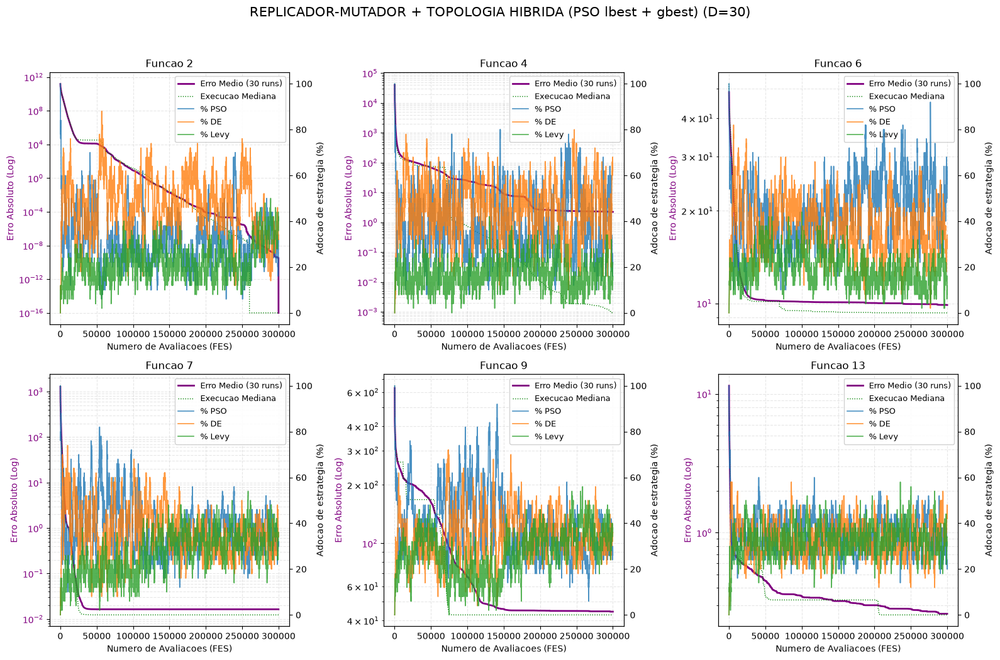


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=30)
Funcao   |        PSO |         DE |       Levy
----------------------------------------------------------------------------------------
F2       |      32.27 |      46.02 |      21.71
F4       |      39.52 |      44.14 |      16.35
F6       |      44.33 |      36.50 |      19.17
F7       |      36.53 |      36.88 |      26.60
F9       |      40.07 |      35.22 |      24.71
F13      |      35.27 |      33.09 |      31.65

 RESULTADOS: REPLICADOR-MUTADOR + TOPOLOGIA HIBRIDA (PSO lbest + gbest) - D = 50
Funcao   | Melhor     | Pior       | Media      | Mediana    | Desvio Pad.
----------------------------------------------------------------------------------------
F2       | 5.46e+00 | 1.46e+03 | 2.55e+02 | 9.53e+01 | 3.62e+02
F4       | 1.11e-01 | 1.47e+02 | 3.33e+01 | 8.98e+00 | 4.04e+01
F6       | 1.55e+01 | 3.63e+01 | 2.57e+01 | 2.53e+01 | 4.76e+00
F7       | 0.00e+00 | 7.14e-02 | 1.28e-02 | 7.40e-03 | 1.79e-02
F9       | 5.87e+01

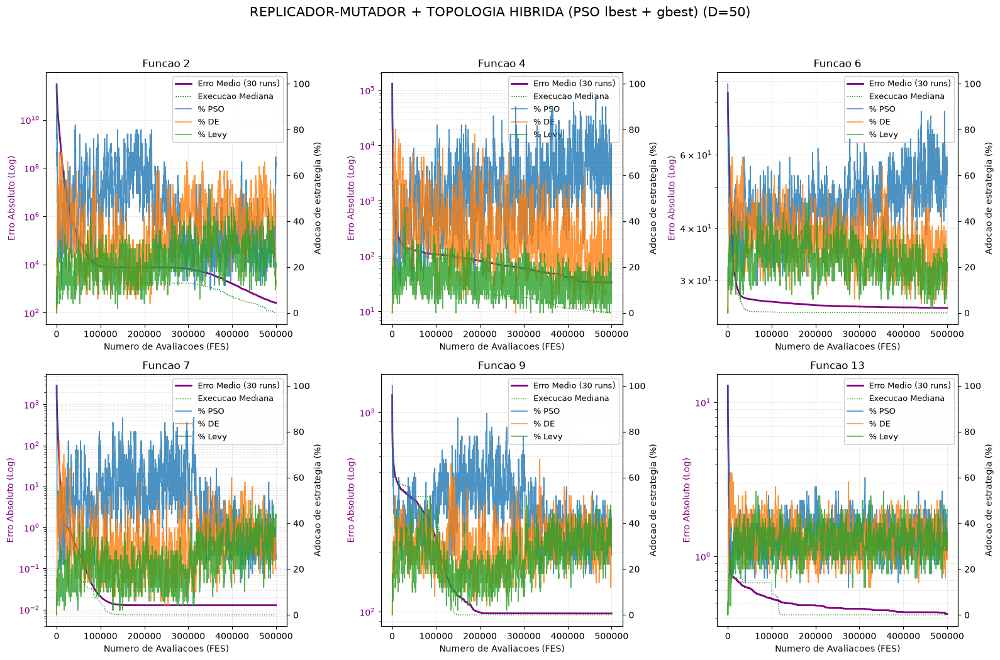


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=50)
Funcao   |        PSO |         DE |       Levy
----------------------------------------------------------------------------------------
F2       |      40.98 |      35.79 |      23.23
F4       |      50.87 |      34.12 |      15.02
F6       |      46.53 |      31.38 |      22.09
F7       |      46.96 |      30.27 |      22.77
F9       |      45.02 |      30.55 |      24.44
F13      |      34.66 |      33.41 |      31.93


In [45]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# EGT Replicador-Mutador com PSO de topologia hibrida: termo social do anel local (lbest) + do lider global (gbest).
def egt_replmut_topohib_batch(cec_func, D, NP=50, runs=30, vmax=100.0,
                              op_mode="de", topology="hibrida",
                              H=6, p_best_rate=0.11, arc_rate=2.0):
    """Variante do Replicador-Mutador, parametrizada em dois eixos.

    op_mode  : 'de'     -> estrategia 1 = DE/rand/1/bin sobre pbest (versao original).
               'lshade' -> estrategia 1 = operador SHADE (current-to-pbest/1 com arquivo
                           externo e F/CR adaptativos). Sem LPSR: NP fixo, para nao
                           redimensionar os tensores da dinamica de jogo.
    topology : 'lbest'   -> termo social so do anel local k=3 (versao original).
               'hibrida'  -> anel local + gbest (4 termos; c_cog=c_loc=1.0, c_glob=0.5).
    Retorno: (best_found_ever, historico (runs, T), adocao_de_Levy (runs, T)).
    """
    mu_rate = 0.03
    w_max, w_min = 0.9, 0.4
    if topology == "hibrida":
        c_cog, c_loc, c_glob = 1.0, 1.0, 0.5
    else:
        c_cog, c_loc, c_glob = 1.49445, 1.49445, 0.0
    F_mut, CR_de = 0.5, 0.9

    max_FES = 10000 * D
    lower, upper = -100.0, 100.0
    vmin = -vmax
    dev = DEVICE

    beta = 1.5
    sigma = (math.gamma(1 + beta) * math.sin(math.pi * beta / 2) /
             (math.gamma((1 + beta) / 2) * beta * 2 ** ((beta - 1) / 2))) ** (1 / beta)
    alpha_levy = 0.01 * (upper - lower)

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=dev).uniform_(lower, upper)
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=dev)
    pbest_pos = pos.clone()

    raw = cec_func.evaluate(pos) - cec_func.F_star
    pbest_errors = torch.where(raw < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=dev), raw)
    FES = NP
    best_found_ever, gbest_idx = torch.min(pbest_errors, dim=1)

    strategy = torch.zeros((runs, NP), dtype=torch.long, device=dev)

    use_lshade = (op_mode == "lshade")
    if use_lshade:
        capacity = max(1, int(round(NP * arc_rate)))
        memory_F = torch.full((runs, H), 0.5, dtype=torch.float64, device=dev)
        memory_CR = torch.full((runs, H), 0.5, dtype=torch.float64, device=dev)
        memory_idx = torch.zeros(runs, dtype=torch.long, device=dev)
        archive = torch.zeros((runs, capacity, D), dtype=torch.float64, device=dev)
        archive_size = torch.zeros(runs, dtype=torch.long, device=dev)

    history = [best_found_ever.cpu().numpy()]
    # mistura de estrategias por iteracao: colunas [% PSO, % DE, % Levy]
    strat_mix = [torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0]
    # diversidade: desvio-padrao medio das posicoes entre as NP particulas
    diversity = [pos.std(dim=1).mean(dim=-1).cpu().numpy()]

    batch_col = torch.arange(runs, device=dev).view(runs, 1)
    run_ids = torch.arange(runs, device=dev)
    np_idx = torch.arange(NP, device=dev).view(1, NP)

    while FES < max_FES and not torch.all(best_found_ever <= 0.0):
        w_inertia = w_max - (w_max - w_min) * (FES / max_FES)
        old_pbest_errors = pbest_errors.clone()
        old_pos = pos.clone()
        old_strategy = strategy.clone()

        # vizinho L-best: melhor pbest no anel {i-1, i, i+1}
        err_left = torch.roll(pbest_errors, 1, dims=1)
        err_right = torch.roll(pbest_errors, -1, dims=1)
        err_stack = torch.stack([err_left, pbest_errors, err_right], dim=2)
        best_n = torch.argmin(err_stack, dim=2)
        shift_map = torch.tensor([-1, 0, 1], device=dev)
        n_idx = (np_idx + shift_map[best_n]) % NP
        lbest_pos = pbest_pos[batch_col, n_idx, :]
        gbest_pos = pbest_pos[run_ids, gbest_idx, :]

        # estrategia 0: PSO (anel L-best, ou anel + gbest se topology='hibrida')
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=dev)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=dev)
        vel_pso = w_inertia * vel + c_cog * r1 * (pbest_pos - pos) + c_loc * r2 * (lbest_pos - pos)
        if c_glob > 0.0:
            r3 = torch.rand((runs, NP, D), dtype=torch.float64, device=dev)
            vel_pso = vel_pso + c_glob * r3 * (gbest_pos.unsqueeze(1) - pos)
        vel_pso = torch.clamp(vel_pso, vmin, vmax)
        trials_pso = torch.clamp(pos + vel_pso, lower, upper)

        # estrategia 1: DE/rand/1 (op_mode='de') ou operador SHADE (op_mode='lshade')
        if not use_lshade:
            rm = torch.rand((runs, NP, NP), device=dev)
            rm.diagonal(dim1=1, dim2=2).fill_(float('inf'))
            ri = torch.topk(rm, 3, dim=2, largest=False).indices
            a = pbest_pos[batch_col, ri[..., 0], :]
            b = pbest_pos[batch_col, ri[..., 1], :]
            cc = pbest_pos[batch_col, ri[..., 2], :]
            mutant = torch.clamp(a + F_mut * (b - cc), lower, upper)
            cp = torch.rand((runs, NP, D), dtype=torch.float64, device=dev) < CR_de
            fc = torch.randint(0, D, (runs, NP), device=dev)
            cp[batch_col, np_idx, fc] = True
            trials_op = torch.where(cp, mutant, pos)
            Fi = CRi = None
        else:
            rr_ = torch.randint(0, H, (runs, NP), device=dev)
            mF = memory_F.gather(1, rr_)
            mCR = memory_CR.gather(1, rr_)
            CRi = torch.clamp(mCR + 0.1 * torch.randn((runs, NP), dtype=torch.float64, device=dev), 0.0, 1.0)
            Fi = mF + 0.1 * torch.tan(math.pi * (torch.rand((runs, NP), dtype=torch.float64, device=dev) - 0.5))
            for _ in range(8):
                bad = Fi <= 0
                if not torch.any(bad):
                    break
                rep = mF + 0.1 * torch.tan(math.pi * (torch.rand((runs, NP), dtype=torch.float64, device=dev) - 0.5))
                Fi = torch.where(bad, rep, Fi)
            Fi = torch.clamp(Fi, 1e-12, 1.0)

            p_num = max(2, int(round(p_best_rate * NP)))
            ranked = torch.argsort(pbest_errors, dim=1)
            p_choice = torch.randint(0, p_num, (runs, NP), device=dev)
            x_pbest = pbest_pos[batch_col, ranked.gather(1, p_choice), :]

            score = torch.rand((runs, NP, NP), dtype=torch.float64, device=dev)
            ids = torch.arange(NP, device=dev)
            score[:, ids, ids] = float('inf')
            r1i = torch.topk(score, 1, dim=2, largest=False).indices[..., 0]
            x_r1 = pos[batch_col, r1i, :]

            total = NP + capacity
            sc2 = torch.rand((runs, NP, total), dtype=torch.float64, device=dev)
            pop_ids = torch.arange(NP, device=dev).view(1, 1, NP)
            own = pop_ids == torch.arange(NP, device=dev).view(1, NP, 1)
            r1m = pop_ids == r1i.unsqueeze(-1)
            sc2[:, :, :NP] = sc2[:, :, :NP].masked_fill(own | r1m, float('inf'))
            arc_ids = torch.arange(capacity, device=dev).view(1, 1, capacity)
            sc2[:, :, NP:] = sc2[:, :, NP:].masked_fill(~(arc_ids < archive_size.view(runs, 1, 1)), float('inf'))
            r2c = torch.argmin(sc2, dim=2)
            use_arc = r2c >= NP
            arc_slot = torch.clamp(r2c - NP, min=0)
            x_r2 = torch.where(use_arc.unsqueeze(-1),
                               archive[batch_col, arc_slot, :],
                               pos[batch_col, torch.clamp(r2c, max=NP - 1), :])

            mutant = pos + Fi.unsqueeze(-1) * (x_pbest - pos) + Fi.unsqueeze(-1) * (x_r1 - x_r2)
            mutant = torch.where(mutant < lower, (pos + lower) / 2.0, mutant)
            mutant = torch.where(mutant > upper, (pos + upper) / 2.0, mutant)
            cp = torch.rand((runs, NP, D), dtype=torch.float64, device=dev) < CRi.unsqueeze(-1)
            fc = torch.randint(0, D, (runs, NP), device=dev)
            cp[batch_col, np_idx, fc] = True
            trials_op = torch.where(cp, mutant, pos)

        # estrategia 2: voo de Levy
        u = torch.normal(0.0, sigma, (runs, NP, D), dtype=torch.float64, device=dev)
        vv = torch.normal(0.0, 1.0, (runs, NP, D), dtype=torch.float64, device=dev)
        step = u / torch.abs(vv) ** (1 / beta)
        trials_levy = torch.clamp(pos + alpha_levy * step, lower, upper)

        # aplica a estrategia de cada particula e avalia (1 chamada por iteracao)
        is_pso = (strategy == 0).unsqueeze(-1)
        is_op = (strategy == 1).unsqueeze(-1)
        trials = torch.where(is_pso, trials_pso, torch.where(is_op, trials_op, trials_levy))
        vel = torch.where(is_pso, vel_pso, vel)

        raw_new = cec_func.evaluate(trials) - cec_func.F_star
        err_new = torch.where(raw_new < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=dev), raw_new)
        FES += NP

        improves = err_new < pbest_errors
        move_mask = (~is_op) | improves.unsqueeze(-1)   # PSO/Levy sempre; DE/SHADE guloso
        pos = torch.where(move_mask, trials, pos)
        pbest_errors = torch.where(improves, err_new, pbest_errors)
        pbest_pos = torch.where(improves.unsqueeze(-1).expand_as(pos), pos, pbest_pos)

        current_best_iter, gbest_idx = torch.min(pbest_errors, dim=1)
        best_found_ever = torch.minimum(best_found_ever, current_best_iter)

        if use_lshade:
            succ = improves & (old_strategy == 1)
            add_rank = torch.cumsum(succ.to(torch.long), dim=1) - 1
            slots = archive_size.view(runs, 1) + add_rank
            valid = succ & (slots < capacity)
            if torch.any(valid):
                ra, ca = torch.where(valid)
                archive[ra, slots[ra, ca], :] = old_pos[ra, ca, :]
            archive_size = torch.clamp(archive_size + succ.sum(dim=1), max=capacity)

            gain = torch.where(succ, old_pbest_errors - err_new, torch.zeros_like(err_new))
            denom = gain.sum(dim=1)
            has = denom > 0
            wgt = torch.where(has.unsqueeze(-1), gain / torch.clamp(denom.unsqueeze(-1), min=1e-30),
                              torch.zeros_like(gain))
            sf = (wgt * Fi).sum(dim=1)
            sf2 = (wgt * Fi * Fi).sum(dim=1)
            scr = (wgt * CRi).sum(dim=1)
            newF = sf2 / torch.clamp(sf, min=1e-30)
            mi = memory_idx.clone()
            memory_F[run_ids, mi] = torch.where(has, newF, memory_F[run_ids, mi])
            memory_CR[run_ids, mi] = torch.where(has, scr, memory_CR[run_ids, mi])
            memory_idx = torch.where(has, (memory_idx + 1) % H, memory_idx)

        if FES < max_FES:
            payoff = torch.clamp(old_pbest_errors - pbest_errors, min=0.0)
            pi_max, _ = payoff.max(dim=1, keepdim=True)
            pi_min, _ = payoff.min(dim=1, keepdim=True)
            j_idx = torch.randint(0, NP, (runs, NP), device=dev)
            payoff_j = payoff[batch_col, j_idx]
            prob_switch = (payoff_j - payoff) / (pi_max - pi_min + 1e-15)
            sw = (torch.rand((runs, NP), dtype=torch.float64, device=dev) < prob_switch) & (payoff_j > payoff)
            new_strategy = torch.where(sw, strategy[batch_col, j_idx], strategy)
            is_not_leader = np_idx != gbest_idx.unsqueeze(1)
            mu = (torch.rand((runs, NP), dtype=torch.float64, device=dev) < mu_rate) & is_not_leader
            shift = torch.randint(1, 3, (runs, NP), device=dev)
            mutated = (new_strategy + shift) % 3
            new_strategy = torch.where(mu, mutated, new_strategy)
            changed_to_pso = (strategy != new_strategy) & (new_strategy == 0)
            vel = torch.where(changed_to_pso.unsqueeze(-1), torch.zeros_like(vel), vel)
            strategy = new_strategy

        history.append(best_found_ever.cpu().numpy())
        strat_mix.append(torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0)
        diversity.append(pos.std(dim=1).mean(dim=-1).cpu().numpy())

    return (best_found_ever.cpu().numpy(), np.array(history).T,
            np.stack(strat_mix, axis=1), np.array(diversity).T)

# Avaliacao Experimental
funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Logico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta celula (ver celula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*88}")
    print(f" RESULTADOS: REPLICADOR-MUTADOR + TOPOLOGIA HIBRIDA (PSO lbest + gbest) - D = {D}")
    print(f"{'='*88}")
    print(f"{'Funcao':<8} | {'Melhor':<10} | {'Pior':<10} | {'Media':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 88)

    tabela_economia = []
    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))
    fig.suptitle(f'REPLICADOR-MUTADOR + TOPOLOGIA HIBRIDA (PSO lbest + gbest) (D={D})', fontsize=15)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories, adoptions, diversity = egt_replmut_topohib_batch(
            cec_func, D, NP=NP_baseline, runs=runs_global, vmax=100.0
        )
        _save_run("egt_replmut_topohib", D, func_id, results, histories,
                  np.linspace(NP_baseline, max_FES_global, histories.shape[1]), adoptions, diversity, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)
        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mix_mean = adoptions.mean(axis=(0, 1))  # [% PSO, % DE, % Levy] medio nas 30 execucoes
        tabela_economia.append((func_id, mix_mean))

        median_idx = int(np.argsort(np.abs(results - r_median))[0])
        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        median_history_plot = np.maximum(histories[median_idx], 1e-16)

        ax1 = axes[idx]
        ax2 = ax1.twinx()
        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))
        ax1.plot(x_axis, mean_history_plot, color='purple', linewidth=2, label='Erro Medio (30 runs)')
        ax1.plot(x_axis, median_history_plot, color='green', linewidth=1, linestyle=':', label='Execucao Mediana')
        ax1.set_yscale('log')
        ax1.set_xlabel('Numero de Avaliacoes (FES)')
        ax1.set_ylabel('Erro Absoluto (Log)', color='purple')
        ax1.tick_params(axis='y', labelcolor='purple')
        mix_med = adoptions[median_idx]  # (T, 3)
        for k, lab in enumerate(('PSO', 'DE', 'Levy')):
            ax2.plot(x_axis, mix_med[:, k], linewidth=1.2, alpha=0.8, label=f'% {lab}')
        ax2.set_ylabel('Adocao de estrategia (%)')
        ax2.set_ylim(-5, 105)
        ax1.set_title(f'Funcao {func_id}')
        ax1.grid(True, which="both", ls="--", alpha=0.3)
        lns = ax1.get_lines() + ax2.get_lines()
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc='upper right', framealpha=0.9, fontsize=9)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)
    plt.pause(1)

    print(f"\n{'='*88}")
    print(f" USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D={D})")
    print(f"{'='*88}")
    print(f"{'Funcao':<8} | {'PSO':>10} | {'DE':>10} | {'Levy':>10}")
    print("-" * 88)
    for f_id, mix in tabela_economia:
        print(f"F{f_id:<7} | {mix[0]:>10.2f} | {mix[1]:>10.2f} | {mix[2]:>10.2f}")

plt.show()


# Variante do Replicador-Mutador: DE autoadaptativo (jDE)

Ablação do **operador do slot 1**. A estratégia DE continua `rand/1` sobre o `pbest`,
mas `F` e `CR` deixam de ser fixos (0.5 / 0.9) e passam a ser autoadaptativos por
partícula, no esquema jDE (Brest et al., 2006): com probabilidade 0.1 a partícula
sorteia novos `F` em [0.1, 1.0] / `CR` em [0, 1], mantidos se o trial melhorar.


Acelerador Lógico Identificado: NVIDIA GeForce RTX 5050 Laptop GPU

 RESULTADOS: REPLICADOR-MUTADOR + DE AUTOADAPTATIVO (jDE) - D = 30
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
-------------------------------------------------------------------------------------
F2       | 2.58e-04 | 2.16e-02 | 4.07e-03 | 2.47e-03 | 4.44e-03
F4       | 2.27e-03 | 7.79e+01 | 2.04e+01 | 4.05e+00 | 2.96e+01
F6       | 3.67e-01 | 1.49e+01 | 7.60e+00 | 7.48e+00 | 3.75e+00
F7       | 0.00e+00 | 3.20e-02 | 4.84e-03 | 0.00e+00 | 7.69e-03
F9       | 2.19e+01 | 5.07e+01 | 4.08e+01 | 4.13e+01 | 7.02e+00
F13      | 1.58e-01 | 2.78e-01 | 2.28e-01 | 2.27e-01 | 2.71e-02


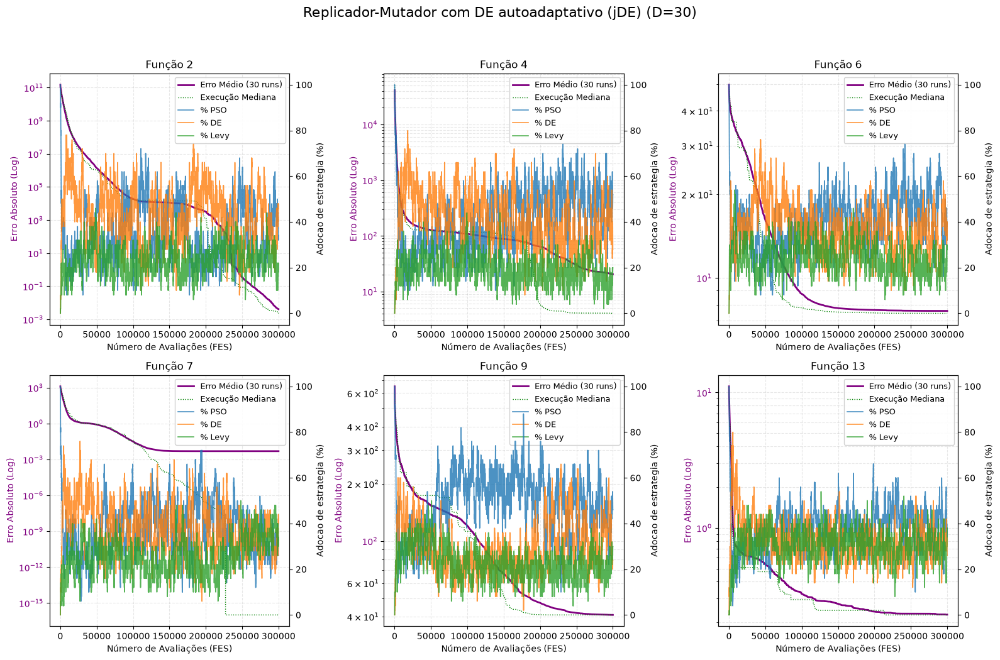


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=30)
Funcao   |        PSO |         DE |       Levy
-------------------------------------------------------------------------------------
F2       |      34.05 |      42.27 |      23.68
F4       |      36.96 |      42.42 |      20.62
F6       |      39.69 |      36.91 |      23.40
F7       |      37.55 |      38.71 |      23.73
F9       |      48.51 |      28.31 |      23.18
F13      |      36.68 |      32.90 |      30.43

 RESULTADOS: REPLICADOR-MUTADOR + DE AUTOADAPTATIVO (jDE) - D = 50
Função   | Melhor     | Pior       | Média      | Mediana    | Desvio Pad.
-------------------------------------------------------------------------------------
F2       | 3.76e+01 | 1.82e+04 | 6.22e+03 | 5.23e+03 | 5.03e+03
F4       | 7.34e+01 | 9.81e+01 | 8.97e+01 | 8.86e+01 | 7.98e+00
F6       | 1.51e+01 | 3.32e+01 | 2.35e+01 | 2.34e+01 | 4.55e+00
F7       | 0.00e+00 | 2.95e-02 | 5.17e-03 | 0.00e+00 | 8.16e-03
F9       | 5.67e+01 | 1.19e+02 | 8.92e+

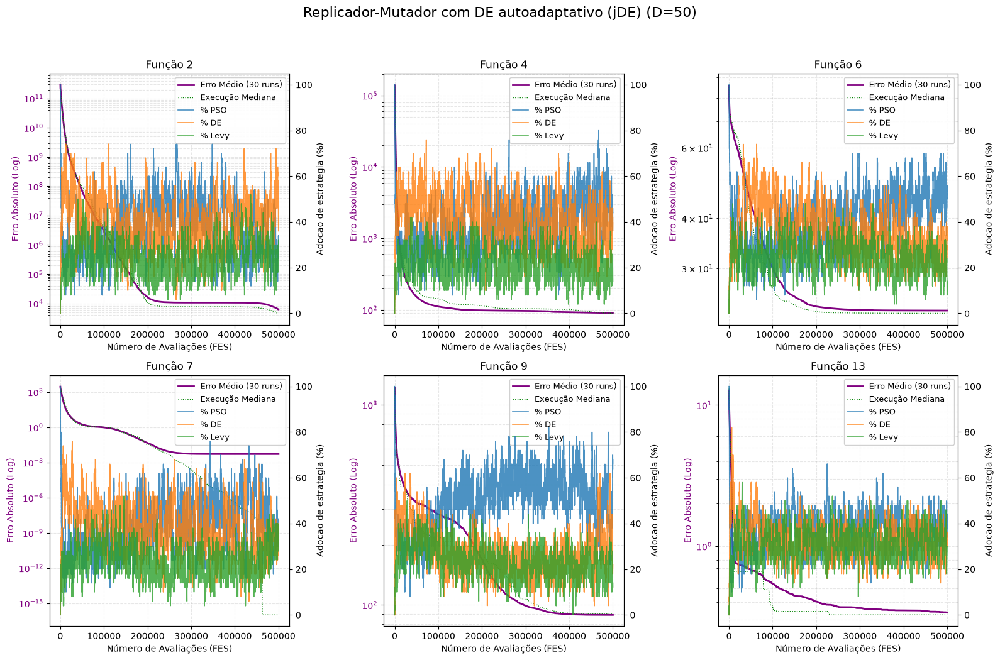


 USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D=50)
Funcao   |        PSO |         DE |       Levy
-------------------------------------------------------------------------------------
F2       |      36.61 |      39.65 |      23.74
F4       |      37.75 |      40.56 |      21.69
F6       |      39.80 |      35.91 |      24.29
F7       |      39.01 |      37.87 |      23.12
F9       |      46.30 |      30.25 |      23.45
F13      |      35.59 |      33.10 |      31.31


In [5]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import time
import math

# Ablação do operador do slot 1: mesma estrutura do Replicador-Mutador, mas a estratégia
# DE passa a usar F e CR autoadaptativos por partícula (jDE, Brest et al. 2006) em vez de
# F=0.5 / CR=0.9 fixos. A mutação continua sendo rand/1 sobre o pbest.
def egt_replmut_jde_batch(cec_func, D, NP=50, runs=30, vmax=100.0):
    mu_rate = 0.03  # prob. de troca aleatória de estratégia (termo mutador)
    w_max, w_min = 0.9, 0.4
    c1, c2 = 1.49445, 1.49445
    F_lo, F_span, tau_F, tau_CR = 0.1, 0.9, 0.1, 0.1  # jDE: F em [0.1, 1.0], CR em [0, 1]

    max_FES = 10000 * D
    bounds = (-100, 100)
    vmin = -vmax  # Limite inferior simétrico de velocidade

    # escala do voo de Lévy (Mantegna)
    beta = 1.5
    sigma = (math.gamma(1 + beta) * math.sin(math.pi * beta / 2) /
             (math.gamma((1 + beta) / 2) * beta * 2**((beta - 1) / 2))) ** (1 / beta)
    alpha_levy = 0.01 * (bounds[1] - bounds[0])

    pos = torch.empty((runs, NP, D), dtype=torch.float64, device=DEVICE).uniform_(bounds[0], bounds[1])
    vel = torch.zeros((runs, NP, D), dtype=torch.float64, device=DEVICE)
    pbest_pos = pos.clone()

    fitness = cec_func.evaluate(pos)
    raw_pbest_err = fitness - cec_func.F_star
    pbest_errors = torch.where(raw_pbest_err < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_pbest_err)

    FES = NP
    best_found_ever, gbest_idx = torch.min(pbest_errors, dim=1)

    # estratégia por partícula: 0 = PSO L-best, 1 = DE, 2 = Lévy
    strategy = torch.zeros((runs, NP), dtype=torch.long, device=DEVICE)

    # F/CR que cada partícula carrega para a estratégia DE (jDE)
    de_F = torch.full((runs, NP), 0.5, dtype=torch.float64, device=DEVICE)
    de_CR = torch.full((runs, NP), 0.9, dtype=torch.float64, device=DEVICE)

    history = [best_found_ever.cpu().numpy()]
    # mistura de estrategias por iteracao: colunas [% PSO, % DE, % Levy]
    strat_mix = [torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0]
    # diversidade: desvio-padrao medio das posicoes entre as NP particulas
    diversity = [pos.std(dim=1).mean(dim=-1).cpu().numpy()]

    batch_idx = torch.arange(runs, device=DEVICE).view(runs, 1)
    np_idx = torch.arange(NP, device=DEVICE).view(1, NP)

    while FES < max_FES and not torch.all(best_found_ever <= 0.0):
        w_inertia = w_max - (w_max - w_min) * (FES / max_FES)
        old_pbest_errors = pbest_errors.clone()

        # vizinho L-best: melhor pbest no anel {i-1, i, i+1}
        err_left = torch.roll(pbest_errors, shifts=1, dims=1)
        err_right = torch.roll(pbest_errors, shifts=-1, dims=1)

        err_stack = torch.stack([err_left, pbest_errors, err_right], dim=2)
        best_n_idx = torch.argmin(err_stack, dim=2)

        shift_map = torch.tensor([-1, 0, 1], device=DEVICE)
        actual_n_idx = (np_idx + shift_map[best_n_idx]) % NP
        lbest_pos = pbest_pos[batch_idx, actual_n_idx, :] # (runs, NP, D)

        # Fase 1: gera o candidato de cada estratégia para toda a população
        # estratégia 0: PSO com termo social do anel L-best
        r1 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)
        r2 = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE)

        vel_pso = (w_inertia * vel +
                   c1 * r1 * (pbest_pos - pos) +
                   c2 * r2 * (lbest_pos - pos))

        # clamp de velocidade (vmax/vmin): evita overflow, sobretudo na F2
        vel_pso = torch.clamp(vel_pso, vmin, vmax)
        trials_pso = torch.clamp(pos + vel_pso, bounds[0], bounds[1])

        # estratégia 1: DE/rand/1 sobre pbest, com F e CR autoadaptativos (jDE)
        newF = torch.where(torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < tau_F,
                           F_lo + F_span * torch.rand((runs, NP), dtype=torch.float64, device=DEVICE), de_F)
        newCR = torch.where(torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < tau_CR,
                            torch.rand((runs, NP), dtype=torch.float64, device=DEVICE), de_CR)

        rand_matrix = torch.rand((runs, NP, NP), device=DEVICE)
        rand_matrix.diagonal(dim1=1, dim2=2).fill_(float('inf'))
        r_indices = torch.topk(rand_matrix, 3, dim=2, largest=False).indices

        a = pbest_pos[batch_idx, r_indices[..., 0], :]
        b = pbest_pos[batch_idx, r_indices[..., 1], :]
        c = pbest_pos[batch_idx, r_indices[..., 2], :]

        mutant = torch.clamp(a + newF.unsqueeze(-1) * (b - c), bounds[0], bounds[1])
        cross_points = torch.rand((runs, NP, D), dtype=torch.float64, device=DEVICE) < newCR.unsqueeze(-1)
        force_cross = torch.randint(0, D, (runs, NP), device=DEVICE)
        cross_points[batch_idx, np_idx, force_cross] = True
        trials_de = torch.where(cross_points, mutant, pos)

        # estratégia 2: voo de Lévy (exploração de fundo)
        u = torch.normal(0, sigma, (runs, NP, D), dtype=torch.float64, device=DEVICE)
        v = torch.normal(0, 1, (runs, NP, D), dtype=torch.float64, device=DEVICE)
        step = u / torch.abs(v) ** (1 / beta)
        trials_levy = torch.clamp(pos + alpha_levy * step, bounds[0], bounds[1])

        # aplica a estratégia de cada partícula e avalia (1 chamada por iteração)
        is_pso = (strategy == 0).unsqueeze(-1)
        is_de = (strategy == 1).unsqueeze(-1)

        trials = torch.where(is_pso, trials_pso, torch.where(is_de, trials_de, trials_levy))
        vel = torch.where(is_pso, vel_pso, vel)

        fit_new = cec_func.evaluate(trials)
        raw_err_new = fit_new - cec_func.F_star
        err_new = torch.where(raw_err_new < 1e-8, torch.tensor(0.0, dtype=torch.float64, device=DEVICE), raw_err_new)

        FES += NP

        improves = err_new < pbest_errors

        # PSO (0) e Lévy (2) são operadores exploratórios e sempre se deslocam;
        # DE (1) usa seleção gulosa: só aceita a nova posição em caso de melhora.
        move_mask = (~is_de) | improves.unsqueeze(-1)
        pos = torch.where(move_mask, trials, pos)
        pbest_errors = torch.where(improves, err_new, pbest_errors)
        pbest_pos = torch.where(improves.unsqueeze(-1).expand_as(pos), pos, pbest_pos)

        # jDE: a partícula DE que melhorou mantém o F/CR usado no trial; as demais revertem
        commit = is_de.squeeze(-1) & improves
        de_F = torch.where(commit, newF, de_F)
        de_CR = torch.where(commit, newCR, de_CR)

        current_best_iter, gbest_idx = torch.min(pbest_errors, dim=1)
        best_found_ever = torch.minimum(best_found_ever, current_best_iter)

        # Fase 2: atualiza as estratégias (replicador + mutador)
        if FES < max_FES:
            payoff = torch.clamp(old_pbest_errors - pbest_errors, min=0.0)
            pi_max, _ = payoff.max(dim=1, keepdim=True)
            pi_min, _ = payoff.min(dim=1, keepdim=True)

            # replicador: copia a estratégia de um oponente com payoff maior (regra de Schlag)
            j_idx = torch.randint(0, NP, (runs, NP), device=DEVICE)
            payoff_j = payoff[batch_idx, j_idx]

            prob_switch = (payoff_j - payoff) / (pi_max - pi_min + 1e-15)
            switch_mask = (torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < prob_switch) & (payoff_j > payoff)
            new_strategy = torch.where(switch_mask, strategy[batch_idx, j_idx], strategy)

            # mutador: troca aleatória com prob. mu_rate (preserva o líder da rodada)
            is_not_leader = np_idx != gbest_idx.unsqueeze(1)
            mu_mask = (torch.rand((runs, NP), dtype=torch.float64, device=DEVICE) < mu_rate) & is_not_leader

            random_shift = torch.randint(1, 3, (runs, NP), device=DEVICE)
            mutated_strategy = (new_strategy + random_shift) % 3

            new_strategy = torch.where(mu_mask, mutated_strategy, new_strategy)

            changed_to_pso = (strategy != new_strategy) & (new_strategy == 0)
            vel = torch.where(changed_to_pso.unsqueeze(-1), torch.zeros_like(vel), vel)

            strategy = new_strategy

        history.append(best_found_ever.cpu().numpy())
        strat_mix.append(torch.stack([(strategy == k).float().mean(dim=1) for k in range(3)], dim=1).cpu().numpy() * 100.0)
        diversity.append(pos.std(dim=1).mean(dim=-1).cpu().numpy())

    return (best_found_ever.cpu().numpy(), np.array(history).T,
            np.stack(strat_mix, axis=1), np.array(diversity).T)

funcoes_cec = [2, 4, 6, 7, 9, 13]
dimensoes = [30, 50]
runs_global = 30
NP_baseline = 50

print(f"Acelerador Lógico Identificado: {torch.cuda.get_device_name(0) if DEVICE == 'cuda' else 'CPU'}")

set_seed(MASTER_SEED)  # semente fixada antes desta célula (ver célula de infraestrutura)

for D in dimensoes:
    print(f"\n{'='*85}")
    print(f" RESULTADOS: REPLICADOR-MUTADOR + DE AUTOADAPTATIVO (jDE) - D = {D}")
    print(f"{'='*85}")
    print(f"{'Função':<8} | {'Melhor':<10} | {'Pior':<10} | {'Média':<10} | {'Mediana':<10} | {'Desvio Pad.':<10}")
    print("-" * 85)

    tabela_economia = []
    max_FES_global = 10000 * D

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))
    fig.suptitle(f'Replicador-Mutador com DE autoadaptativo (jDE) (D={D})', fontsize=16)
    axes = axes.flatten()

    for idx, func_id in enumerate(funcoes_cec):
        cec_func = CEC2014Function(func_id, D)

        _t0 = time.perf_counter()
        results, histories, adoptions, diversity = egt_replmut_jde_batch(
            cec_func, D, NP=NP_baseline, runs=runs_global, vmax=100.0
        )
        _save_run("egt_replmut_jde", D, func_id, results, histories, np.linspace(NP_baseline, max_FES_global, histories.shape[1]), adoptions, diversity, wall_time=time.perf_counter() - _t0)

        r_min, r_max = np.min(results), np.max(results)
        r_mean, r_median = np.mean(results), np.median(results)
        r_std = np.std(results)

        print(f"F{func_id:<7} | {r_min:.2e} | {r_max:.2e} | {r_mean:.2e} | {r_median:.2e} | {r_std:.2e}")

        mix_mean = adoptions.mean(axis=(0, 1))  # [% PSO, % DE, % Levy] medio nas 30 execucoes
        tabela_economia.append((func_id, mix_mean))

        median_idx = np.argsort(np.abs(results - r_median))[0]

        mean_history = np.mean(histories, axis=0)
        mean_history_plot = np.maximum(mean_history, 1e-16)
        median_history_plot = np.maximum(histories[median_idx], 1e-16)

        ax1 = axes[idx]
        ax2 = ax1.twinx()

        x_axis = np.linspace(NP_baseline, max_FES_global, len(mean_history))
        ax1.plot(x_axis, mean_history_plot, color='purple', linewidth=2, label='Erro Médio (30 runs)')
        ax1.plot(x_axis, median_history_plot, color='green', linewidth=1, linestyle=':', label='Execução Mediana')

        ax1.set_yscale('log')
        ax1.set_xlabel('Número de Avaliações (FES)')
        ax1.set_ylabel('Erro Absoluto (Log)', color='purple')
        ax1.tick_params(axis='y', labelcolor='purple')

        mix_med = adoptions[median_idx]  # (T, 3)
        for k, lab in enumerate(('PSO', 'DE', 'Levy')):
            ax2.plot(x_axis, mix_med[:, k], linewidth=1.2, alpha=0.8, label=f'% {lab}')
        ax2.set_ylabel('Adocao de estrategia (%)')
        ax2.set_ylim(-5, 105)

        ax1.set_title(f'Função {func_id}')
        ax1.grid(True, which="both", ls="--", alpha=0.3)
        lns = ax1.get_lines() + ax2.get_lines()
        labs = [l.get_label() for l in lns]
        ax1.legend(lns, labs, loc='upper right', framealpha=0.9, fontsize=9)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show(block=False)
    plt.pause(1)

    print(f"\n{'='*85}")
    print(f" USO MEDIO DE ESTRATEGIA NAS 30 EXECUCOES (%) (D={D})")
    print(f"{'='*85}")
    print(f"{'Funcao':<8} | {'PSO':>10} | {'DE':>10} | {'Levy':>10}")
    print("-" * 85)
    for f_id, mix in tabela_economia:
        print(f"F{f_id:<7} | {mix[0]:>10.2f} | {mix[1]:>10.2f} | {mix[2]:>10.2f}")

plt.show()


# Estudo de sensibilidade: mu_rate do Replicador-Mutador

Varre `mu_rate` (probabilidade do termo mutador na dinamica replicador-mutador) em
{0, 0.01, 0.03, 0.06, 0.10}, D=30, 30 execucoes por ponto, e reporta o erro medio
por funcao mais o erro relativo ao melhor `mu_rate` de cada funcao. Justifica o
valor 0.03 adotado na proposta e mostra a robustez a essa escolha.

mu_rate  |         F2 |         F4 |         F6 |         F7 |         F9 |        F13
-----------------------------------------------------------------------------------------
0.0      |  2.223e+03 |  8.997e+01 |  1.853e+01 |  7.264e-01 |  9.122e+01 |  5.245e-01
0.01     |  0.000e+00 |  6.526e+00 |  9.160e+00 |  1.643e-03 |  3.623e+01 |  2.255e-01
0.03     |  1.953e-06 |  4.262e+00 |  7.121e+00 |  2.052e-03 |  4.431e+01 |  2.324e-01
0.06     |  1.713e-01 |  4.698e+00 |  6.118e+00 |  2.382e-03 |  3.996e+01 |  2.072e-01
0.1      |  5.915e+01 |  1.416e+01 |  4.422e+00 |  4.514e-03 |  4.103e+01 |  2.032e-01


C:\Users\natan\AppData\Local\Temp\ipykernel_33268\2125642454.py:28: RuntimeWarning: divide by zero encountered in divide
  rel = erro_medio / np.nanmin(erro_medio, axis=0, keepdims=True)
C:\Users\natan\AppData\Local\Temp\ipykernel_33268\2125642454.py:28: RuntimeWarning: invalid value encountered in divide
  rel = erro_medio / np.nanmin(erro_medio, axis=0, keepdims=True)


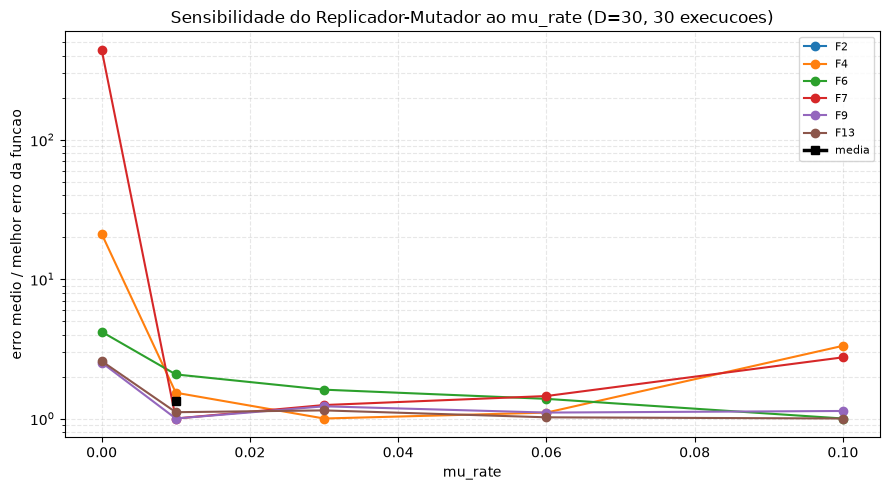


mu_rate com melhor desempenho medio relativo: 0.01  (valor adotado na proposta: 0.03)


In [47]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

# Sensibilidade ao mu_rate (taxa do termo mutador) no Replicador-Mutador.
# Reusa egt_lbest_depso_replicator_mutator_batch, definido na celula "Replicador - Mutador".
MU_SWEEP = [0.0, 0.01, 0.03, 0.06, 0.10]
D_SENS = 30
RUNS_SENS = 30
FUNCS_SENS = [2, 4, 6, 7, 9, 13]

set_seed(MASTER_SEED)

erro_medio = np.full((len(MU_SWEEP), len(FUNCS_SENS)), np.nan)

print(f"{'mu_rate':<8} | " + " | ".join(f"{'F' + str(fid):>10}" for fid in FUNCS_SENS))
print("-" * (11 + 13 * len(FUNCS_SENS)))
for im, mu in enumerate(MU_SWEEP):
    for jf, fid in enumerate(FUNCS_SENS):
        cec_func = CEC2014Function(fid, D_SENS)
        res, _, _, _ = egt_lbest_depso_replicator_mutator_batch(
            cec_func, D_SENS, NP=50, runs=RUNS_SENS, vmax=100.0, mu_rate=mu)
        erro_medio[im, jf] = float(np.mean(res))
    print(f"{mu:<8} | " + " | ".join(f"{erro_medio[im, jf]:10.3e}" for jf in range(len(FUNCS_SENS))))

# erro relativo ao melhor mu de cada funcao
rel = erro_medio / np.nanmin(erro_medio, axis=0, keepdims=True)
melhor_mu = MU_SWEEP[int(np.nanargmin(np.nanmean(rel, axis=1)))]

fig, ax = plt.subplots(figsize=(9, 5))
for jf, fid in enumerate(FUNCS_SENS):
    ax.plot(MU_SWEEP, rel[:, jf], marker="o", label=f"F{fid}")
ax.plot(MU_SWEEP, np.nanmean(rel, axis=1), color="k", lw=2.5, marker="s", label="media")
ax.set_yscale("log")
ax.set_xlabel("mu_rate")
ax.set_ylabel("erro medio / melhor erro da funcao")
ax.set_title(f"Sensibilidade do Replicador-Mutador ao mu_rate (D={D_SENS}, {RUNS_SENS} execucoes)")
ax.grid(True, which="both", ls="--", alpha=0.3)
ax.legend(fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join("resultados", "figuras", "sensibilidade_mu.png"), dpi=130)
plt.show()

print(f"\nmu_rate com melhor desempenho medio relativo: {melhor_mu}  (valor adotado na proposta: 0.03)")


# Análise Estatística e Gráficos (comparativo)

Carrega tudo o que estiver em `resultados/`, e produz: tabela descritiva (best/worst/mean/std/median, taxa de sucesso e FES-para-alvo), boxplots do erro final, curvas de convergência sobrepostas, curvas de evolução da adoção de estratégia, teste de Wilcoxon (rank-sum) par-a-par com correção de Holm, e teste de Friedman + pós-teste de Nemenyi (diagrama de diferença crítica) através das 6 funções. A tabela de literatura é um template a preencher a partir das fontes citadas.

Algoritmos: ['DE', 'PSO', 'PSO-DE', 'Nash PSO-DE', 'EGT-DEPSO', 'EGT Repl.-Mut.', 'Repl-Mut gbest', 'Repl-Mut lbest+gbest', 'Repl-Mut jDE']
Proposta (Wilcoxon focado): EGT Repl.-Mut.

 TABELA DESCRITIVA  -  D = 30   (SR = taxa de sucesso a 1e-8; SP = FES medio p/ sucesso / SR)
Funcao  | Algoritmo                |       Best |      Worst |       Mean |        Std |     Median |   SR% | FESalvo(med) |           SP
--------------------------------------------------------------------------------------------------------------------------------------------
F2      | DE                       |  8.869e+08 |  2.320e+09 |  1.680e+09 |  3.096e+08 |  1.751e+09 |     0 |       ---    |       inf   
F2      | PSO                      |  9.232e-05 |  2.064e+10 |  5.643e+09 |  5.261e+09 |  4.706e+09 |     0 |       ---    |       inf   
F2      | PSO-DE                   |  4.069e+09 |  2.349e+10 |  9.826e+09 |  4.025e+09 |  8.859e+09 |     0 |       ---    |       inf   
F2      | Nash PSO-DE        

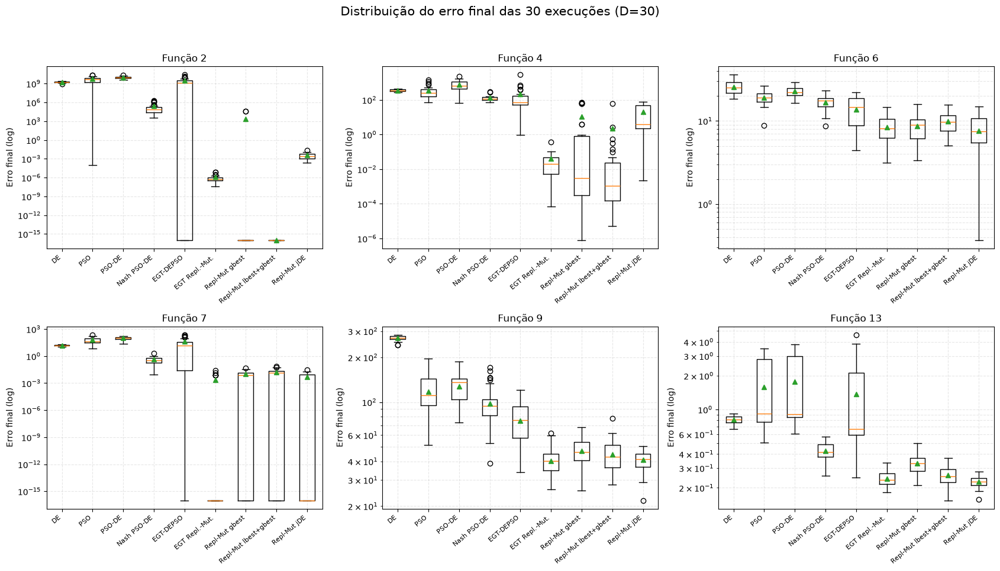

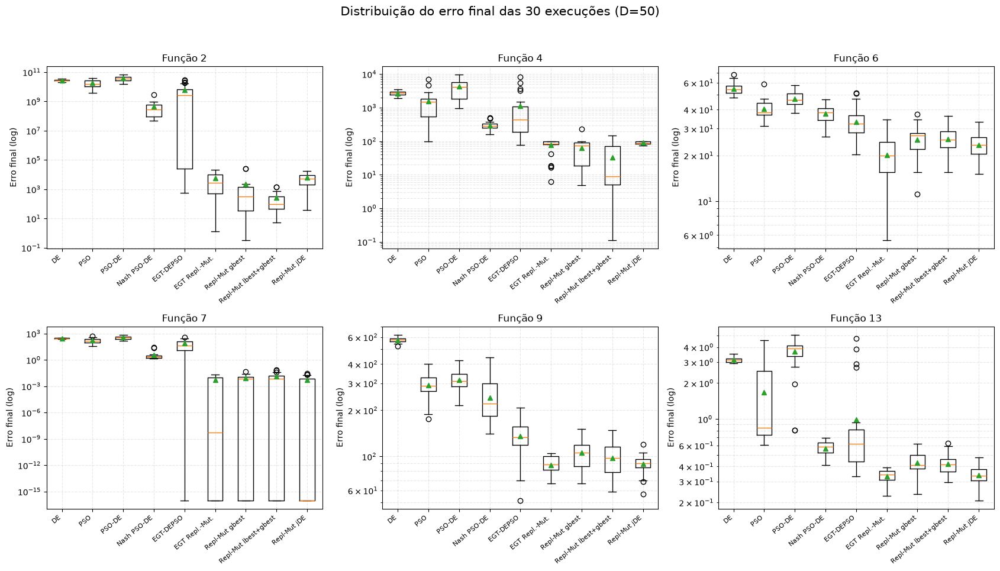

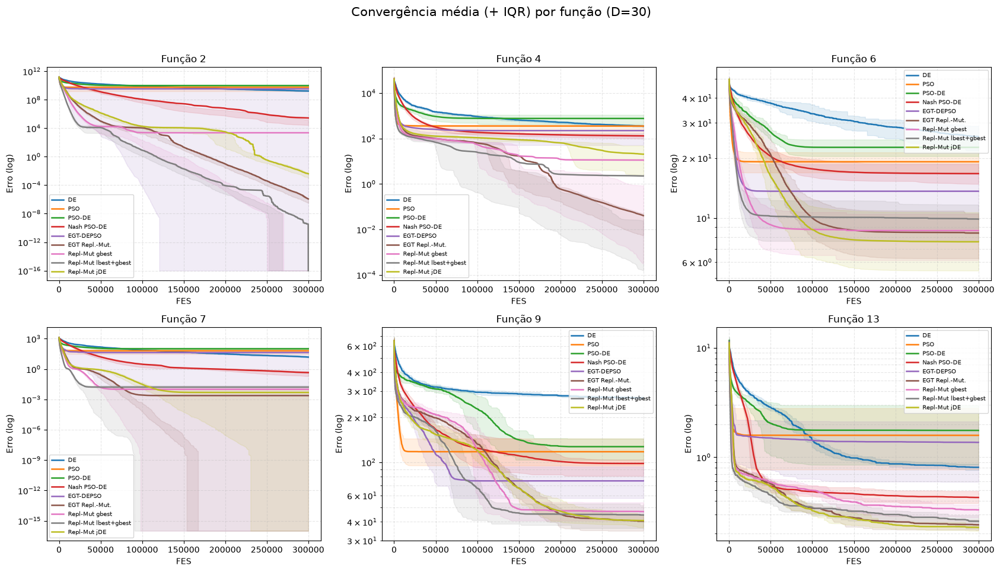

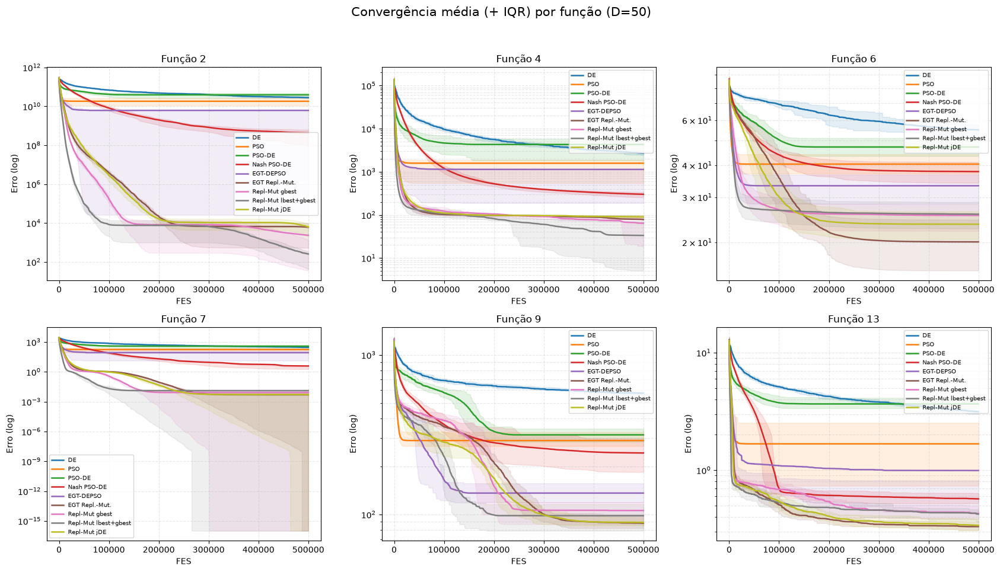

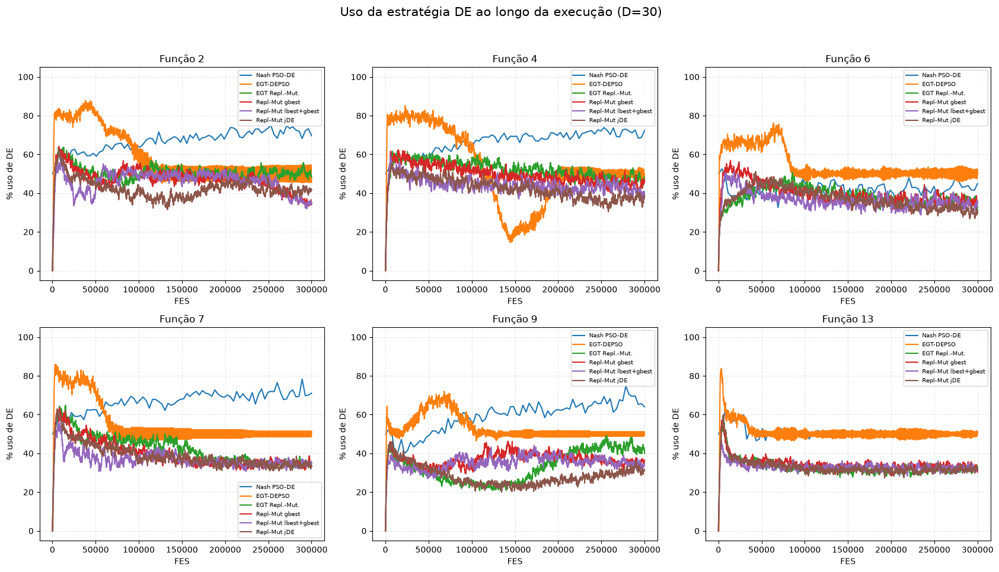

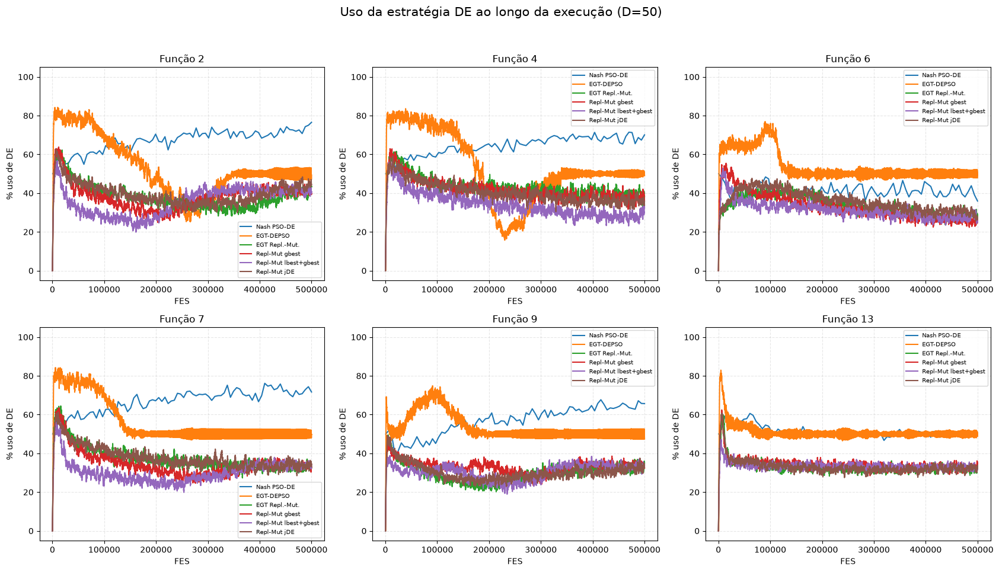

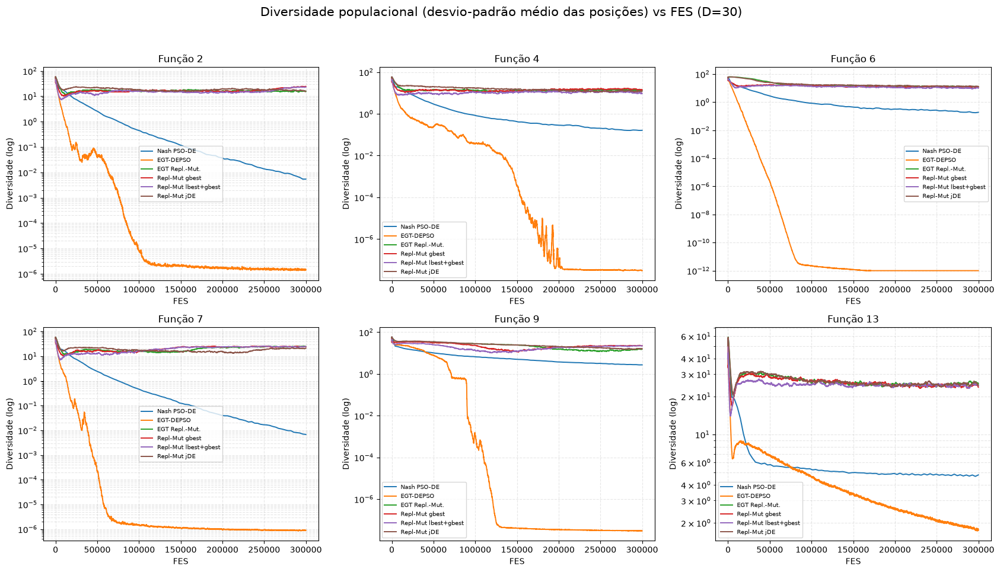

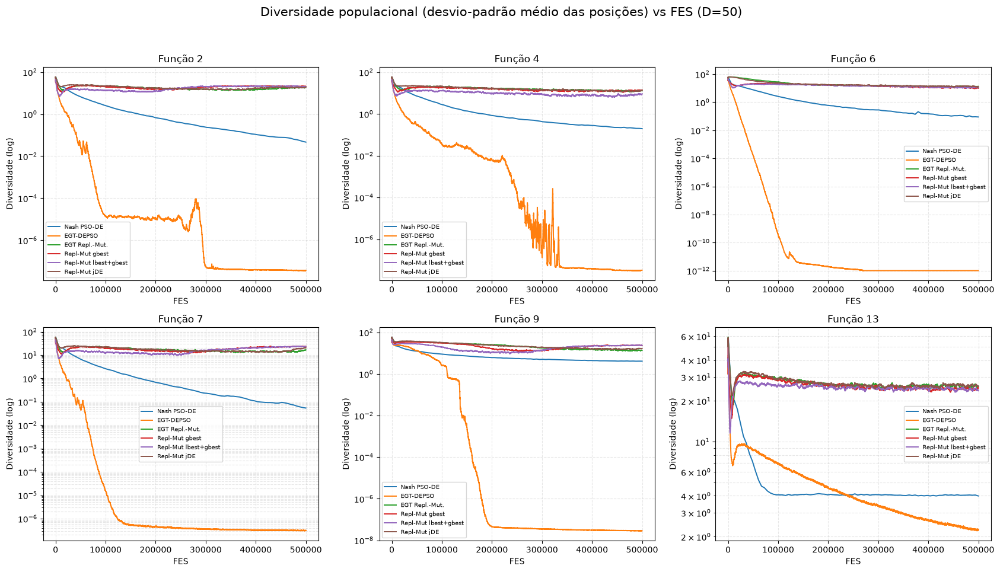

F2: convergencia em   8.7% do orcamento (FES=26250/300000) | diversidade nesse ponto=7.59e-02 | adocao pos-convergencia: media=57.0% desvio=11.64 min=45.1% max=87.9%
F4: convergencia em  44.0% do orcamento (FES=131950/300000) | diversidade nesse ponto=1.11e-02 | adocao pos-convergencia: media=41.0% desvio=12.44 min=14.6% max=53.7%
F6: convergencia em  12.3% do orcamento (FES=37050/300000) | diversidade nesse ponto=1.68e-04 | adocao pos-convergencia: media=53.1% desvio=6.79 min=45.1% max=76.3%
F7: convergencia em  11.8% do orcamento (FES=35300/300000) | diversidade nesse ponto=3.36e-02 | adocao pos-convergencia: media=52.4% desvio=6.91 min=46.5% max=82.5%
F9: convergencia em  31.2% do orcamento (FES=93550/300000) | diversidade nesse ponto=3.85e-03 | adocao pos-convergencia: media=50.3% desvio=1.37 min=46.5% max=61.2%
F13: convergencia em  99.0% do orcamento (FES=297000/300000) | diversidade nesse ponto=1.75e+00 | adocao pos-convergencia: media=50.0% desvio=0.67 min=48.5% max=51.7%


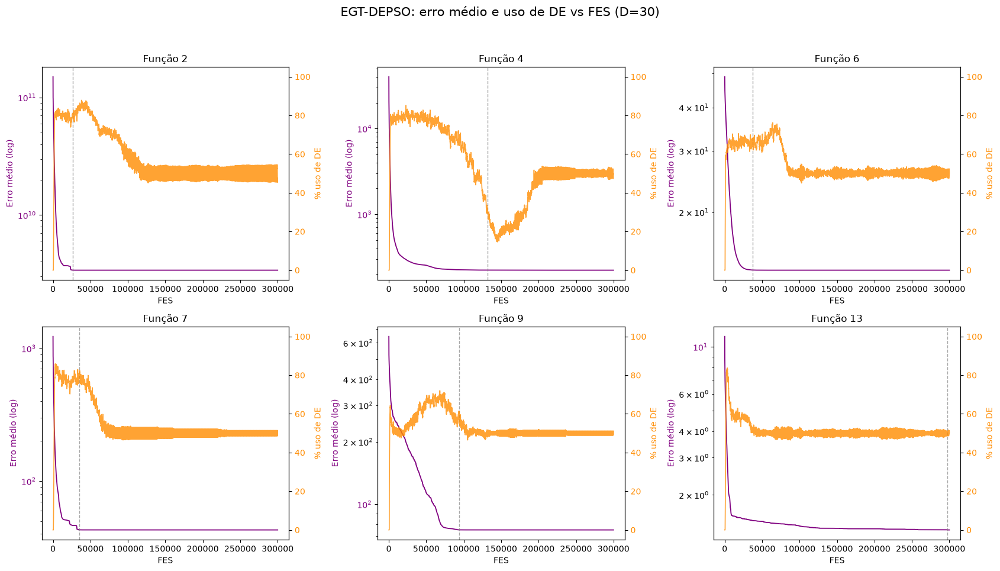


 WILCOXON RANK-SUM par-a-par  -  D = 30   ('linha vs coluna' = vitorias/empates/derrotas nas 6 funcoes, a=0.05)
                                        DE             PSO          PSO-DE     Nash PSO-DE       EGT-DEPSO  EGT Repl.-Mut.  Repl-Mut gbest  Repl-Mut lbest    Repl-Mut jDE
DE                                    -              3/0/3           4/0/2           0/0/6           0/3/3           0/0/6           0/0/6           0/0/6           0/0/6
PSO                                  3/0/3            -              4/2/0           0/0/6           0/1/5           0/0/6           0/0/6           0/0/6           0/0/6
PSO-DE                               2/0/4           0/2/4            -              0/0/6           0/0/6           0/0/6           0/0/6           0/0/6           0/0/6
Nash PSO-DE                          6/0/0           6/0/0           6/0/0            -              2/1/3           0/0/6           0/0/6           0/0/6           0/0/6
EGT-DEPSO                       

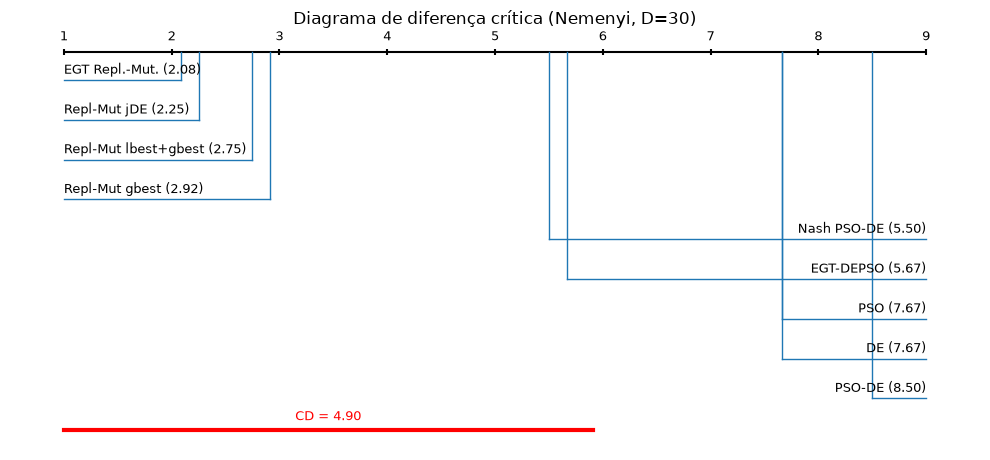


 FRIEDMAN  -  D = 50   chi2 = 43.733   p = 6.389e-07   (k=9 algoritmos, N=6 funcoes)
 [aviso] N=6 e amostra pequena para Friedman; leia como indicativo.
   rank medio  2.00   EGT Repl.-Mut.
   rank medio  2.33   Repl-Mut jDE
   rank medio  2.67   Repl-Mut lbest+gbest
   rank medio  3.00   Repl-Mut gbest
   rank medio  5.33   Nash PSO-DE
   rank medio  5.67   EGT-DEPSO
   rank medio  7.00   PSO
   rank medio  8.33   DE
   rank medio  8.67   PSO-DE

 Diferenca critica de Nemenyi (a=0.05): CD = 4.905
 Rank medio > 6.90 => significativamente pior que 'EGT Repl.-Mut.'.


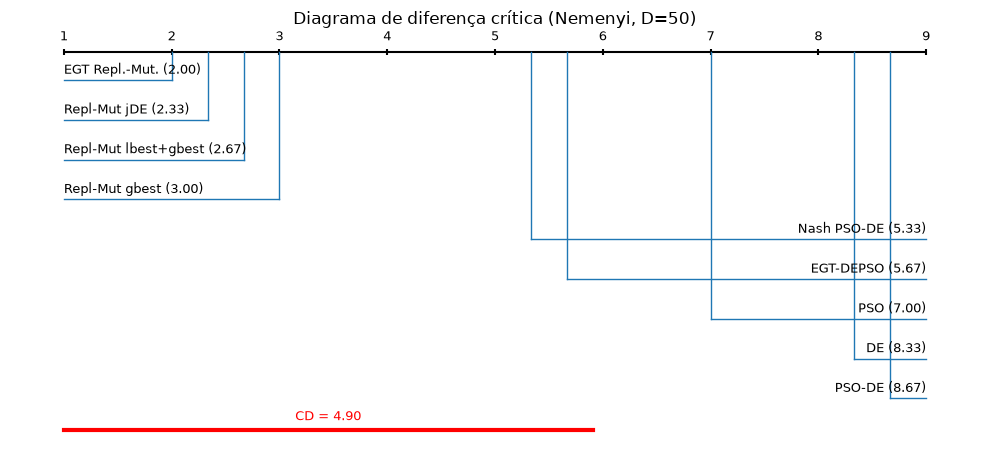


 CUSTO COMPUTACIONAL  -  tempo das 30 execucoes em lote, somado nas 6 funcoes (s)
Algoritmo                |     D=30 (s) |     D=50 (s) |    total (s)
------------------------------------------------------------------------------
DE                       |         66.7 |         33.5 |        100.2
PSO                      |         62.0 |        103.2 |        165.2
PSO-DE                   |         45.7 |        237.7 |        283.4
Nash PSO-DE              |          9.0 |         16.8 |         25.7
EGT-DEPSO                |         78.2 |        544.0 |        622.2
EGT Repl.-Mut.           |        220.4 |        171.8 |        392.1
Repl-Mut gbest           |        156.9 |        159.6 |        316.5
Repl-Mut lbest+gbest     |         93.6 |        160.9 |        254.6
Repl-Mut jDE             |        132.6 |        181.4 |        314.0

Figuras salvas em: resultados\figuras


In [1]:
import os, glob
import math
import numpy as np
import matplotlib.pyplot as plt

RESULTS_DIR = "resultados"  # relativo ao diretorio do notebook
FIG_DIR = os.path.join(RESULTS_DIR, "figuras")
os.makedirs(FIG_DIR, exist_ok=True)

FUNCS = [2, 4, 6, 7, 9, 13]
DIMS = [30, 50]
ALPHA = 0.05
EPS = 1e-16  # piso para escala logaritmica

PRETTY = {
    "de": "DE", "pso": "PSO", "pso_de": "PSO-DE",
    "nash_pso_de": "Nash PSO-DE", "egt_depso": "EGT-DEPSO",
    "egt_replicador_mutador": "EGT Repl.-Mut.", "egt_topologia_hibrida": "EGT Topo. Hib.",
    "lshade": "L-SHADE", "egt_pso_lshade": "EGT-PSO+L-SHADE",
    "egt_depso_lshade_lite": "EGT-DEPSO+L-SHADE Lite", "sdpso": "SDPSO",
    "egt_replmut_lshade": "Repl-Mut+SHADE", "egt_replmut_gbest": "Repl-Mut gbest", "egt_replmut_topohib": "Repl-Mut lbest+gbest", "egt_replmut_jde": "Repl-Mut jDE",
    "egt_replmut_lshade_topohib": "Repl-Mut SHADE+Topo",
}
def lbl(a): return PRETTY.get(a, a)

# funcoes estatisticas (sem scipy)
def _rankdata(a):
    """Ranks 1..n com media nos empates (equivalente a scipy.stats.rankdata)."""
    a = np.asarray(a, dtype=float)
    n = a.size
    order = np.argsort(a, kind="mergesort")
    ranks = np.empty(n, dtype=float)
    ranks[order] = np.arange(1, n + 1, dtype=float)
    vals, inv, cnt = np.unique(a, return_inverse=True, return_counts=True)
    inv = inv.reshape(-1)
    sums = np.zeros(vals.size, dtype=float)
    np.add.at(sums, inv, ranks)
    return (sums / cnt)[inv]

def _ranksums(x, y):
    """Wilcoxon rank-sum (Mann-Whitney) - aprox. normal com correcao de empates.
    Retorna (z, p_bilateral). Compat. com scipy.stats.ranksums para n moderado."""
    x = np.asarray(x, dtype=float); y = np.asarray(y, dtype=float)
    n1, n2 = x.size, y.size
    if n1 == 0 or n2 == 0:
        return 0.0, 1.0
    allv = np.concatenate([x, y])
    r = _rankdata(allv)
    R1 = r[:n1].sum()
    N = n1 + n2
    mu = n1 * (N + 1) / 2.0
    _, cnt = np.unique(allv, return_counts=True)
    tie = float(np.sum(cnt ** 3 - cnt))
    var = n1 * n2 / 12.0 * ((N + 1) - tie / (N * (N - 1))) if N > 1 else 0.0
    if var <= 0:
        return 0.0, 1.0
    z = (R1 - mu) / math.sqrt(var)
    p = math.erfc(abs(z) / math.sqrt(2.0))
    return z, p

def _gammaincc(a, x):
    """Q(a,x) = gama incompleta superior regularizada (Numerical Recipes)."""
    if x <= 0.0:
        return 1.0
    if a <= 0.0:
        return float("nan")
    lg = math.lgamma(a)
    if x < a + 1.0:
        ap = a; s = 1.0 / a; term = s
        for _ in range(2000):
            ap += 1.0
            term *= x / ap
            s += term
            if abs(term) < abs(s) * 1e-16:
                break
        return 1.0 - s * math.exp(-x + a * math.log(x) - lg)
    tiny = 1e-300
    b = x + 1.0 - a
    c = 1.0 / tiny
    d = 1.0 / b
    h = d
    for i in range(1, 2000):
        an = -i * (i - a)
        b += 2.0
        d = an * d + b
        if abs(d) < tiny: d = tiny
        c = b + an / c
        if abs(c) < tiny: c = tiny
        d = 1.0 / d
        delta = d * c
        h *= delta
        if abs(delta - 1.0) < 1e-16:
            break
    return math.exp(-x + a * math.log(x) - lg) * h

def _chi2_sf(x, k):
    return _gammaincc(k / 2.0, x / 2.0)

def _friedman(mat):
    """mat: (k tratamentos) x (N blocos). Retorna (chi2, p, R) com R = ranks por bloco."""
    mat = np.asarray(mat, dtype=float)
    k, N = mat.shape
    R = np.zeros_like(mat)
    for j in range(N):
        R[:, j] = _rankdata(mat[:, j])
    Rj = R.sum(axis=1)
    chi2 = 12.0 / (N * k * (k + 1)) * float(np.sum(Rj ** 2)) - 3.0 * N * (k + 1)
    return chi2, _chi2_sf(chi2, k - 1), R

def _a12(x, y):
    """Vargha-Delaney A12 = P(x>y) + 0.5 P(x=y). 0.5 = sem diferenca;
    x < y com frequencia -> A12 < 0.5 (aqui x = proposta, y = baseline, erro menor e melhor)."""
    x = np.asarray(x, dtype=float); y = np.asarray(y, dtype=float)
    n1, n2 = x.size, y.size
    r = _rankdata(np.concatenate([x, y]))
    return (r[:n1].sum() / n1 - (n1 + 1) / 2.0) / n2


def holm(pvals):
    p = np.asarray(pvals, dtype=float)
    m = p.size
    order = np.argsort(p)
    adj = np.empty(m, dtype=float)
    run = 0.0
    for kk, idx in enumerate(order):
        run = max(run, min(1.0, (m - kk) * p[idx]))
        adj[idx] = run
    return adj

# 0. carga
DB = {}
for path in sorted(glob.glob(os.path.join(RESULTS_DIR, "*_D*_F*.npz"))):
    d = np.load(path, allow_pickle=True)
    DB[(str(d["algo"]), int(d["D"]), int(d["func_id"]))] = {k: d[k] for k in d.files}

if not DB:
    raise RuntimeError("Nada em 'resultados/'. Rode as celulas de experimento antes desta.")

# FILTRO: quais algoritmos entram
# Apenas os que estao no notebook. Estado da arte (L-SHADE, SDPSO, ...) entra pela tabela LITERATURA.
INCLUIR = [
    "de", "pso", "pso_de",              # controles
    "nash_pso_de",                     # referência (artigo)
    "egt_depso",                       # modificação v1 (jogo competitivo)
    "egt_replicador_mutador",          # modificação v2 (RM) = PROPOSTA
    "egt_replmut_gbest",               # ablação de topologia (só gbest)
    "egt_replmut_topohib",             # ablação de topologia (lbest + gbest)
    "egt_replmut_jde",                 # ablação do operador (DE autoadaptativo, jDE)
]
DB = {k: v for k, v in DB.items() if k[0] in INCLUIR}
if not DB:
    raise RuntimeError("Nenhum algoritmo de INCLUIR tem .npz em 'resultados/'.")

ALGOS = [a for a in INCLUIR if any((a, D, f) in DB for D in DIMS for f in FUNCS)]
print("Algoritmos:", [lbl(a) for a in ALGOS])

# CONFIG proposta
PROPOSTA = "egt_replicador_mutador"   # modificacao proposta -> Wilcoxon focado vs cada baseline
print("Proposta (Wilcoxon focado):", lbl(PROPOSTA) if PROPOSTA else "(nenhuma)")

# literatura: erro medio publicado (MaxFES = 10000*D, 51 execucoes, protocolo CEC2014).
# Numeracao de funcao identica a do notebook (F2 Bent Cigar, F4 Rosenbrock, F6
# Weierstrass, F7 Griewank, F9 Rastrigin rot., F13 HappyCat). Fontes:
#   L-SHADE       : Tanabe & Fukunaga (2014), IEEE CEC 2014, pp. 1658-1665, Tabela I.
#   UMOEAs        : Elsayed, Sarker, Essam & Hamza (2014), IEEE CEC 2014, pp. 1650-1657,
#                   Tabelas III (D=30) e IV (D=50).
#   LSHADE-EpSin  : Awad, Ali, Suganthan & Reynolds (2016), IEEE CEC 2016, pp. 2958-2965,
#                   Tabelas III (D=30) e IV (D=50).
#   MVMO-SH       : Erlich, Rueda, Wildenhues & Shewarega (2014), IEEE CEC 2014,
#                   pp. 1625-1632, Tabelas II (D=30) e III (D=50). Metodo baseado em
#                   arquivo/mapeamento (swarm intelligence), nao-DE.
# valor 0.0 = erro < 1e-8 em todas as execucoes (regra de truncamento do CEC2014).
LITERATURA = {
    "L-SHADE": {
        30: {2: 0.0, 4: 0.0,     6: 1.4e-07, 7: 0.0, 9: 6.8e+00, 13: 1.2e-01},
        50: {2: 0.0, 4: 5.9e+01, 6: 2.6e-01, 7: 0.0, 9: 1.1e+01, 13: 1.6e-01},
    },
    "UMOEAs": {
        30: {2: 0.0, 4: 0.0,       6: 0.0,       7: 0.0, 9: 8.84e+00, 13: 5.46e-02},
        50: {2: 0.0, 4: 7.82e-02,  6: 6.03e-02,  7: 0.0, 9: 1.94e+01, 13: 9.85e-02},
    },
    "LSHADE-EpSin": {
        30: {2: 0.0, 4: 0.0,       6: 0.0,       7: 0.0, 9: 1.36e+01, 13: 1.34e-01},
        50: {2: 0.0, 4: 5.59e+01,  6: 1.79e-04,  7: 0.0, 9: 3.02e+01, 13: 2.06e-01},
    },
    "MVMO-SH": {
        30: {2: 2.38e-05, 4: 4.38e-13, 6: 3.62e+00, 7: 2.99e-03, 9: 2.51e+01, 13: 1.57e-01},
        50: {2: 1.52e-05, 4: 5.77e+00, 6: 1.05e+01, 7: 6.67e-03, 9: 7.69e+01, 13: 2.84e-01},
    },
}

def fmt(x):
    return "   ---   " if (x is None or (isinstance(x, float) and np.isnan(x))) else f"{x:.3e}"

_lit_falta = [(nm, D, f) for nm, tab in LITERATURA.items() for D in DIMS for f in FUNCS
              if D in tab and f in tab[D] and (tab[D][f] is None or np.isnan(tab[D][f]))]
if _lit_falta:
    nomes = dict.fromkeys(n for n, _, _ in _lit_falta)
    print(f"\n[LITERATURA] {len(_lit_falta)} valores ainda np.nan - copiar das tabelas dos artigos:")
    for nm in nomes:
        cel = [f"D{D}/F{f}" for n, D, f in _lit_falta if n == nm]
        print(f"   {nm}: {', '.join(cel)}")

# 1. tabela descritiva
for D in DIMS:
    if not any((a, D, f) in DB for a in ALGOS for f in FUNCS):
        continue
    print("\n" + "=" * 122)
    print(f" TABELA DESCRITIVA  -  D = {D}   (SR = taxa de sucesso a 1e-8; SP = FES medio p/ sucesso / SR)")
    print("=" * 140)
    print(f"{'Funcao':<7} | {'Algoritmo':<24} | {'Best':>10} | {'Worst':>10} | {'Mean':>10} | {'Std':>10} | {'Median':>10} | {'SR%':>5} | {'FESalvo(med)':>12} | {'SP':>12}")
    print("-" * 140)
    for f in FUNCS:
        for a in ALGOS:
            e = DB.get((a, D, f))
            if e is None:
                continue
            fe = np.asarray(e["final_error"], dtype=float)
            ftt = np.asarray(e["fes_to_target"], dtype=float)
            fin = np.isfinite(ftt)
            sr = 100.0 * np.mean(fin)
            fmed = np.median(ftt[fin]) if fin.any() else np.nan
            sp = float(np.mean(ftt[fin]) / np.mean(fin)) if fin.any() else np.inf   # Success Performance
            sp_s = f"{sp:.3e}" if np.isfinite(sp) else "   inf   "
            print(f"F{f:<6} | {lbl(a):<24} | {fe.min():10.3e} | {fe.max():10.3e} | {fe.mean():10.3e} | {fe.std():10.3e} | {np.median(fe):10.3e} | {sr:5.0f} | {fmt(fmed):>12} | {sp_s:>12}")
        for src_name, tab in LITERATURA.items():
            if D in tab and f in tab[D]:
                print(f"{'':<7} | {src_name + ' (lit.)':<24} | {'':>10} | {'':>10} | {fmt(tab[D][f]):>10} | {'':>10} | {'':>10} | {'':>5} | {'':>12} | {'':>12}")
        print("-" * 140)

# 2. boxplots
for D in DIMS:
    present = [a for a in ALGOS if any((a, D, f) in DB for f in FUNCS)]
    if not present:
        continue
    fig, axes = plt.subplots(2, 3, figsize=(17, 10))
    fig.suptitle(f"Distribuição do erro final das 30 execuções (D={D})", fontsize=15)
    for ax, f in zip(axes.flat, FUNCS):
        data, ticks = [], []
        for a in present:
            e = DB.get((a, D, f))
            if e is None:
                continue
            data.append(np.clip(np.asarray(e["final_error"], dtype=float), EPS, None))
            ticks.append(lbl(a))
        if not data:
            ax.set_visible(False); continue
        ax.boxplot(data, showmeans=True)
        ax.set_yscale("log")
        ax.set_xticks(range(1, len(ticks) + 1))
        ax.set_xticklabels(ticks, rotation=40, ha="right", fontsize=8)
        ax.set_title(f"Função {f}")
        ax.set_ylabel("Erro final (log)")
        ax.grid(True, which="both", ls="--", alpha=0.3)
    plt.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.savefig(os.path.join(FIG_DIR, f"boxplot_D{D}.png"), dpi=130)
    plt.show(block=False)

# 3. convergencia sobreposta
for D in DIMS:
    present = [a for a in ALGOS if any((a, D, f) in DB for f in FUNCS)]
    if not present:
        continue
    fig, axes = plt.subplots(2, 3, figsize=(17, 10))
    fig.suptitle(f"Convergência média (+ IQR) por função (D={D})", fontsize=15)
    for ax, f in zip(axes.flat, FUNCS):
        for a in present:
            e = DB.get((a, D, f))
            if e is None:
                continue
            fx = np.asarray(e["curve_fes"], dtype=float)
            mu = np.clip(np.asarray(e["curve_mean"], dtype=float), EPS, None)
            q25 = np.clip(np.asarray(e["curve_q25"], dtype=float), EPS, None)
            q75 = np.clip(np.asarray(e["curve_q75"], dtype=float), EPS, None)
            line, = ax.plot(fx, mu, lw=1.8, label=lbl(a))
            ax.fill_between(fx, q25, q75, color=line.get_color(), alpha=0.12)
        ax.set_yscale("log")
        ax.set_title(f"Função {f}")
        ax.set_xlabel("FES")
        ax.set_ylabel("Erro (log)")
        ax.grid(True, which="both", ls="--", alpha=0.3)
        ax.legend(fontsize=7)
    plt.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.savefig(os.path.join(FIG_DIR, f"convergencia_D{D}.png"), dpi=130)
    plt.show(block=False)

# 4. evolucao da adocao
for D in DIMS:
    present = [a for a in ALGOS if any((a, D, f) in DB and "adoption" in DB[(a, D, f)] for f in FUNCS)]
    if not present:
        continue
    fig, axes = plt.subplots(2, 3, figsize=(17, 10))
    fig.suptitle(f"Uso da estratégia DE ao longo da execução (D={D})", fontsize=15)
    for ax, f in zip(axes.flat, FUNCS):
        for a in present:
            e = DB.get((a, D, f))
            if e is None or "adoption" not in e:
                continue
            fx = np.asarray(e["curve_fes"], dtype=float)
            ad = np.asarray(e["adoption"], dtype=float)
            de_curve = ad[:, 1] if ad.ndim == 2 else ad   # coluna 1 = % DE; EGT-DEPSO ja e 1-D
            n = min(fx.shape[0], de_curve.shape[0])
            ax.plot(fx[:n], de_curve[:n], lw=1.5, label=lbl(a))
        ax.set_title(f"Função {f}")
        ax.set_xlabel("FES")
        ax.set_ylabel("% uso de DE")
        ax.set_ylim(-5, 105)
        ax.grid(True, ls="--", alpha=0.3)
        ax.legend(fontsize=7)
    plt.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.savefig(os.path.join(FIG_DIR, f"adocao_de_D{D}.png"), dpi=130)
    plt.show(block=False)

# 4b. diversidade populacional vs FES
for D in DIMS:
    present = [a for a in ALGOS if any((a, D, f) in DB and "curve_div" in DB[(a, D, f)] for f in FUNCS)]
    if not present:
        continue
    fig, axes = plt.subplots(2, 3, figsize=(17, 10))
    fig.suptitle(f"Diversidade populacional (desvio-padrão médio das posições) vs FES (D={D})", fontsize=15)
    for ax, f in zip(axes.flat, FUNCS):
        for a in present:
            e = DB.get((a, D, f))
            if e is None or "curve_div" not in e:
                continue
            fx = np.asarray(e["curve_fes"], dtype=float)
            dv = np.asarray(e["curve_div"], dtype=float)
            n = min(fx.shape[0], dv.shape[0])
            ax.plot(fx[:n], np.clip(dv[:n], 1e-12, None), lw=1.4, label=lbl(a))
        ax.set_yscale("log")
        ax.set_title(f"Função {f}")
        ax.set_xlabel("FES")
        ax.set_ylabel("Diversidade (log)")
        ax.grid(True, which="both", ls="--", alpha=0.3)
        ax.legend(fontsize=7)
    plt.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.savefig(os.path.join(FIG_DIR, f"diversidade_D{D}.png"), dpi=130)
    plt.show(block=False)


# 4c. estagnacao do erro vs oscilacao de adocao no EGT-DEPSO
D = 30
e_dict = {f: DB.get(("egt_depso", D, f)) for f in FUNCS}
if any(e is not None and "adoption" in e for e in e_dict.values()):
    fig, axes = plt.subplots(2, 3, figsize=(17, 10))
    fig.suptitle(f"EGT-DEPSO: erro médio e uso de DE vs FES (D={D})", fontsize=15)
    for ax1, f in zip(axes.flat, FUNCS):
        e = e_dict[f]
        if e is None or "adoption" not in e:
            continue
        fx = np.asarray(e["curve_fes"], dtype=float)
        mu = np.clip(np.asarray(e["curve_mean"], dtype=float), 1e-16, None)
        ad = np.asarray(e["adoption"], dtype=float)
        n = min(fx.shape[0], ad.shape[0])

        ax1.plot(fx, mu, color="purple", linewidth=1.3)
        ax1.set_yscale("log")
        ax1.set_ylabel("Erro médio (log)", color="purple")
        ax1.tick_params(axis="y", labelcolor="purple")
        ax1.set_xlabel("FES")
        ax1.set_title(f"Função {f}")

        ax2 = ax1.twinx()
        ax2.plot(fx[:n], ad[:n], color="darkorange", linewidth=1.2, alpha=0.8)
        ax2.set_ylim(-5, 105)
        ax2.set_ylabel("% uso de DE", color="darkorange")
        ax2.tick_params(axis="y", labelcolor="darkorange")

        # ponto em que o erro se estabiliza (variacao < 0.1% do valor final ate o fim da curva)
        final = mu[-1]
        tol = abs(final) * 1e-3 + 1e-12
        conv_idx = next((i for i in range(len(mu)) if np.all(np.abs(mu[i:] - final) <= tol)), None)
        if conv_idx is not None:
            ax1.axvline(fx[conv_idx], color="gray", linestyle="--", linewidth=1.0, alpha=0.7)
            pct = 100.0 * conv_idx / len(mu)
            div_conv = float(np.asarray(e["curve_div"], dtype=float)[conv_idx]) if "curve_div" in e else float("nan")
            tail = ad[conv_idx:n]
            print(f"F{f}: convergencia em {pct:5.1f}% do orcamento (FES={fx[conv_idx]:.0f}/{fx[-1]:.0f}) | "
                  f"diversidade nesse ponto={div_conv:.2e} | "
                  f"adocao pos-convergencia: media={tail.mean():.1f}% desvio={tail.std():.2f} "
                  f"min={tail.min():.1f}% max={tail.max():.1f}%")

    plt.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.savefig(os.path.join(FIG_DIR, f"estagnacao_egtdepso_D{D}.png"), dpi=130)
    plt.show(block=False)

# 5. Wilcoxon rank-sum par-a-par
for D in DIMS:
    present = [a for a in ALGOS if all((a, D, f) in DB for f in FUNCS)]
    if len(present) < 2:
        continue
    print("\n" + "=" * 110)
    print(f" WILCOXON RANK-SUM par-a-par  -  D = {D}   ('linha vs coluna' = vitorias/empates/derrotas nas 6 funcoes, a={ALPHA})")
    print("=" * 110)
    print(" " * 26 + "".join(f"{lbl(a)[:14]:>16}" for a in present))
    for ai in present:
        cells = []
        for aj in present:
            if ai == aj:
                cells.append("      -   ")
                continue
            w = t = l = 0
            for f in FUNCS:
                x = np.asarray(DB[(ai, D, f)]["final_error"], dtype=float)
                y = np.asarray(DB[(aj, D, f)]["final_error"], dtype=float)
                _, p = _ranksums(x, y)
                if not np.isfinite(p) or p >= ALPHA:
                    t += 1
                elif np.median(x) < np.median(y):
                    w += 1
                else:
                    l += 1
            cells.append(f"{w}/{t}/{l}")
        print(f"{lbl(ai)[:24]:<26}" + "".join(f"{c:>16}" for c in cells))

# 6. Wilcoxon focado (proposta vs baselines) + Holm
if PROPOSTA is not None:
    for D in DIMS:
        if not all((PROPOSTA, D, f) in DB for f in FUNCS):
            continue
        others = [a for a in ALGOS if a != PROPOSTA and all((a, D, f) in DB for f in FUNCS)]
        if not others:
            continue
        print("\n" + "=" * 104)
        print(f" WILCOXON RANK-SUM focado: {lbl(PROPOSTA)} vs baseline  -  D = {D}   (p corrigido por Holm nas 6 funcoes)")
        print("=" * 104)
        print(f"{'Baseline':<22} | {'F':<4} | {'med.prop':>11} | {'med.base':>11} | {'p(Holm)':>9} | {'A12':>5} | {'efeito':>8} | veredito")
        print("-" * 112)
        for a in others:
            praw, meds, a12s = [], [], []
            for f in FUNCS:
                x = np.asarray(DB[(PROPOSTA, D, f)]["final_error"], dtype=float)
                y = np.asarray(DB[(a, D, f)]["final_error"], dtype=float)
                _, p = _ranksums(x, y)
                praw.append(1.0 if not np.isfinite(p) else p)
                meds.append((float(np.median(x)), float(np.median(y))))
                a12s.append(_a12(x, y))
            padj = holm(praw)
            wins = 0
            for kk, f in enumerate(FUNCS):
                mx, my = meds[kk]
                a12 = a12s[kk]; mag = abs(a12 - 0.5)
                eff = "neglig." if mag < 0.06 else "pequeno" if mag < 0.14 else "medio" if mag < 0.21 else "grande"
                if padj[kk] < ALPHA and mx < my:
                    verd = "+ (proposta melhor)"; wins += 1
                elif padj[kk] < ALPHA and mx > my:
                    verd = "- (baseline melhor)"
                else:
                    verd = "= (sem diferenca)"
                print(f"{lbl(a):<22} | F{f:<3} | {mx:11.3e} | {my:11.3e} | {padj[kk]:9.2e} | {a12:5.2f} | {eff:>8} | {verd}")
            print(f"{'':<22} | {'TOT':<4} | proposta vence em {wins}/{len(FUNCS)} funcoes  (A12<0.5 favorece a proposta)")
            print("-" * 112)

# 7. Friedman + Nemenyi (CD)
Q_ALPHA_05 = {2: 1.960, 3: 2.343, 4: 2.569, 5: 2.728, 6: 2.850, 7: 2.949, 8: 3.031,
              9: 3.102, 10: 3.164, 11: 3.219, 12: 3.268, 13: 3.313, 14: 3.354, 15: 3.391}

for D in DIMS:
    present = [a for a in ALGOS if all((a, D, f) in DB for f in FUNCS)]
    k, N = len(present), len(FUNCS)
    if k < 3:
        continue
    med = np.array([[np.median(np.asarray(DB[(a, D, f)]["final_error"], dtype=float)) for f in FUNCS]
                    for a in present])
    chi2, p, R = _friedman(med)
    avg_rank = R.mean(axis=1)
    print("\n" + "=" * 92)
    print(f" FRIEDMAN  -  D = {D}   chi2 = {chi2:.3f}   p = {p:.3e}   (k={k} algoritmos, N={N} funcoes)")
    print("=" * 92)
    if N < 10:
        print(" [aviso] N=6 e amostra pequena para Friedman; leia como indicativo.")
    order = np.argsort(avg_rank)
    for i in order:
        print(f"   rank medio {avg_rank[i]:5.2f}   {lbl(present[i])}")
    q = Q_ALPHA_05.get(k)
    if q is None:
        continue
    CD = q * math.sqrt(k * (k + 1) / (6.0 * N))
    best = avg_rank[order[0]]
    print(f"\n Diferenca critica de Nemenyi (a=0.05): CD = {CD:.3f}")
    print(f" Rank medio > {best + CD:.2f} => significativamente pior que '{lbl(present[order[0]])}'.")

    fig, ax = plt.subplots(figsize=(10, 2 + 0.3 * k))
    lo, hi = 1, k
    ax.set_xlim(lo - 0.5, hi + 0.5)
    ax.set_ylim(0, k + 1.5)
    ax.invert_yaxis()
    ax.hlines(0.5, lo, hi, color="k")
    for xv in range(lo, hi + 1):
        ax.vlines(xv, 0.42, 0.58, color="k")
        ax.text(xv, 0.2, str(xv), ha="center", fontsize=9)
    for rank_i, i in enumerate(order):
        y = rank_i + 1.2
        left = avg_rank[i] < (lo + hi) / 2.0
        ax.plot([avg_rank[i], avg_rank[i]], [0.5, y], color="C0", lw=1)
        ax.plot([avg_rank[i], lo if left else hi], [y, y], color="C0", lw=1)
        ax.text(lo if left else hi, y - 0.16, f"{lbl(present[i])} ({avg_rank[i]:.2f})",
                ha="left" if left else "right", fontsize=9)
    ax.plot([lo, lo + CD], [k + 1.0, k + 1.0], color="r", lw=3)
    ax.text(lo + CD / 2.0, k + 0.75, f"CD = {CD:.2f}", ha="center", color="r", fontsize=9)
    ax.set_title(f"Diagrama de diferença crítica (Nemenyi, D={D})")
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, f"cd_diagram_D{D}.png"), dpi=130)
    plt.show(block=False)

# 8. custo computacional
_have_t = [a for a in ALGOS if any((a, D, f) in DB and "wall_time" in DB[(a, D, f)] for D in DIMS for f in FUNCS)]
print("\n" + "=" * 78)
print(" CUSTO COMPUTACIONAL  -  tempo das 30 execucoes em lote, somado nas 6 funcoes (s)")
print("=" * 78)
if not _have_t:
    print("   (nenhum .npz tem wall_time; re-rode as celulas de experimento)")
else:
    print(f"{'Algoritmo':<24} | {'D=30 (s)':>12} | {'D=50 (s)':>12} | {'total (s)':>12}")
    print("-" * 78)
    for a in _have_t:
        t = {}
        for D in DIMS:
            vs = [float(DB[(a, D, f)]["wall_time"]) for f in FUNCS
                  if (a, D, f) in DB and "wall_time" in DB[(a, D, f)]]
            t[D] = sum(vs) if vs else float("nan")
        print(f"{lbl(a):<24} | {t.get(30, float('nan')):12.1f} | {t.get(50, float('nan')):12.1f} | {t.get(30, 0) + t.get(50, 0):12.1f}")

plt.show()
print("\nFiguras salvas em:", FIG_DIR)
